In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


# Import scripts

In [4]:
path_scripts = '/Users/simjoo/Projects/10X_PDAC_Lgr5/scripts/v3/'

In [5]:
import sys
sys.path.append(path_scripts)

In [6]:
from ipyparallel import Client
import csv
import os
import pickle
import scipy.io
import scanpy as sc
import anndata
import bbknn
import statsmodels.api as sm
import gseapy as gp
import phenograph as pg
import ternary
from more_itertools import windowed

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/numba/core/cpu.py:77: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


In [7]:
%R library(Seurat)
%R library(SingleCellExperiment)
%R library(scran)
%R library(DropletUtils)
%R library(DESeq2)

R[write to console]: Loading required package: SummarizedExperiment

R[write to console]: Loading required package: GenomicRanges

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted

array(['DESeq2', 'DropletUtils', 'scran', 'SingleCellExperiment',
       'SummarizedExperiment', 'DelayedArray', 'BiocParallel',
       'matrixStats', 'Biobase', 'GenomicRanges', 'GenomeInfoDb',
       'IRanges', 'S4Vectors', 'BiocGenerics', 'parallel', 'stats4',
       'Seurat', 'tools', 'stats', 'graphics', 'grDevices', 'utils',
       'datasets', 'methods', 'base'], dtype='<U20')

In [8]:
from TenX_PDAC_misc_scripts_v1_0 import *
from TenX_PDAC_plot_v1_0 import *
from TenX_PDAC_mann_whitney_u_v1_0 import *

In [9]:
#exp_id = create_ID()

In [10]:
exp_id = '202110251102'
path_input = '/Users/simjoo/Projects/10X_PDAC_Lgr5/data_input/'
path_output = '/Users/simjoo/Projects/10X_PDAC_Lgr5/data_output/v3/'
path_figures = '/Users/simjoo/Projects/10X_PDAC_Lgr5/figures/v3/'

In [11]:
cmap_tab20 = {str(c) : mpl.colors.rgb2hex(plt.cm.tab20(c/20)) for c in range(20)}
cmap_tumor = {'autochthonous':'#d95f02', 'fragment_transplant':'#1b9e77', 'sorted_transplant':'#7570b3',
              '2D':'#e7298a','3D_2%':'#66a61e','3D_Tuv':'#e6ab02',}
cmap_treatment = {'3d_TAM':'#addd8e','10d_Veh':'#31a354','20d_TAM':'#006837',
                  '10d_LGK':'#fd8d3c','20d_LGK':'#bd0026','10d_Gem':'#2c7fb8'}
cmap_lineage_tracing = {'tdTomato': '#d95f02', 'Negative': 'silver', 'tdTomato-GFP': '#e6ab02', 'GFP': '#66a61e'}
cmap_cl_tumor = {'Luminal cells':'#7570b3',
               'Basal cells':'#1b9e77',
               'Mesenchymal cells':'#d95f02',
                 'Other':'silver'}

In [12]:
cmap_tumor_sel = {'autochthonous':'#e31a1c',
                  '2D':'#b2df8a',
                  '3D_2%':'#a6cee3',
                  '3D_Tuv':'#a6cee3',
                  'NSG_2D':'#33a02c',
                  'NSG_3D':'#1f78b4',
                  'NSG_unsorted':'#ff7f00',
                  'NSG_TdTom-sorted':'#6a3d9a',
                  'NSG_fragment':'#a65628'}

# Initialize engines

In [13]:
c = Client()

In [14]:
dview = c[:]

In [15]:
dview.execute('import sys')
dview.execute('sys.path.append("/Users/simjoo/Projects/10X_PDAC_Lgr5/scripts/v3/")')
dview.execute('from TenX_PDAC_misc_scripts_v1_0 import *')
dview.execute('from TenX_PDAC_plot_v1_0 import *')
dview.execute('from TenX_PDAC_mann_whitney_u_v1_0 import *')

<AsyncResult: execute>

# UMAP of autochthonous tumor cells

In [63]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Exclude LGK-treated cells

In [16]:
c_sel = Xs.obs[Xs.obs['treatment']!='LGK-974'].index

In [17]:
len(c_sel)

14392

In [18]:
Xs = Xs[c_sel]

## Plot cluster identities

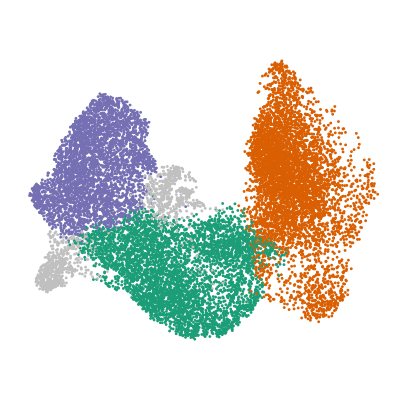

In [171]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['cl_tumor_pca'],
                    cmap_cl_tumor,
                    s=8, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_cluster.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

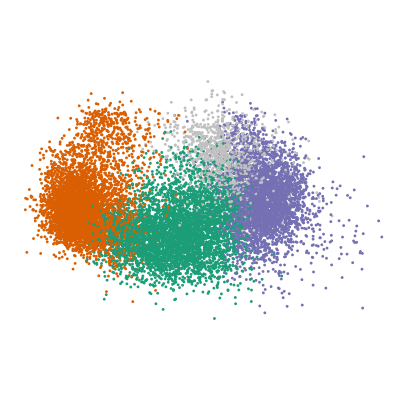

In [26]:
draw_scatter_groups(Xs.obsm['X_pca'][:,(0,1)], 
                    Xs.obs['cl_tumor_pca'],
                    cmap_cl_tumor,
                    s=8, show_axes=False, show_legend=False)
figname = 'PCA_autochthonous_cluster.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

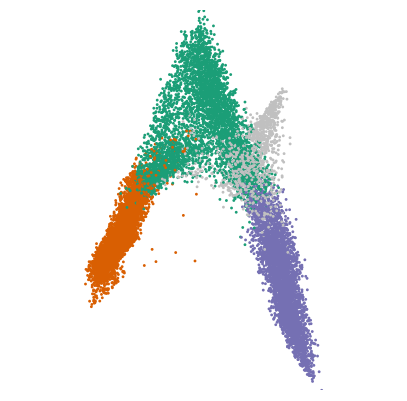

In [27]:
draw_scatter_groups(Xs.obsm['X_diffmap_pca'][:,(1,2)], 
                    Xs.obs['cl_tumor_pca'],
                    cmap_cl_tumor,
                    s=8, show_axes=False, show_legend=False, pad=0)
figname = 'diffmap_autochthonous_cluster.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Plot marker genes

In [28]:
pdX = sc2pd(X, 'norm_log2')

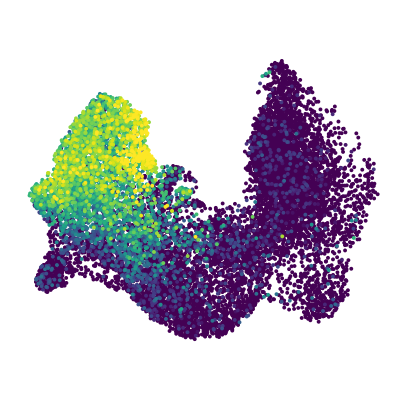

In [29]:
g = 'Lgals4'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Lgals4.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

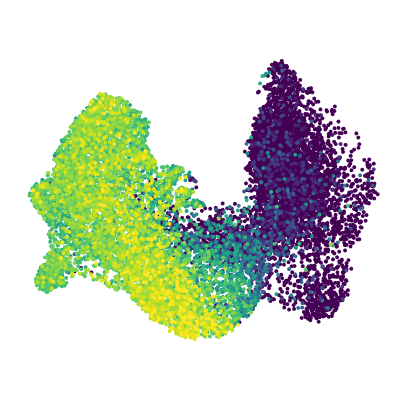

In [33]:
g = 'Epcam'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Epcam.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

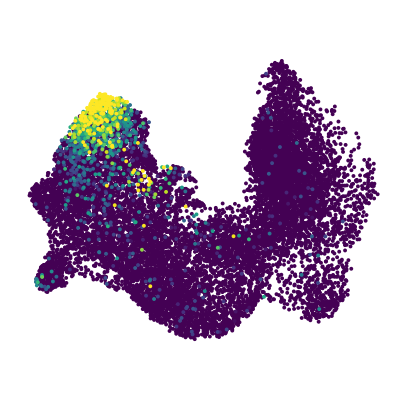

In [35]:
g = 'Muc6'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Muc6.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

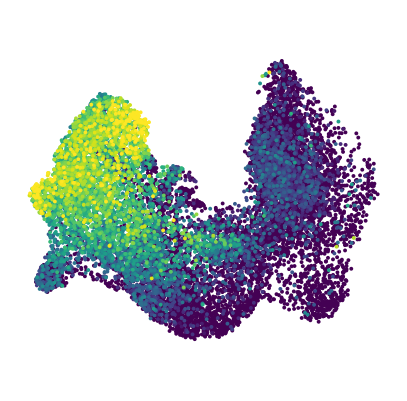

In [41]:
g = 'Gsta4'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Gsta4.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

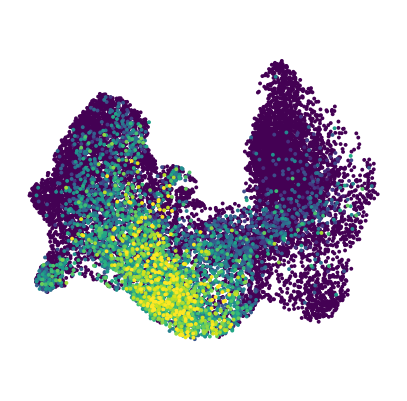

In [30]:
g = 'Cldn6'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Cldn6.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

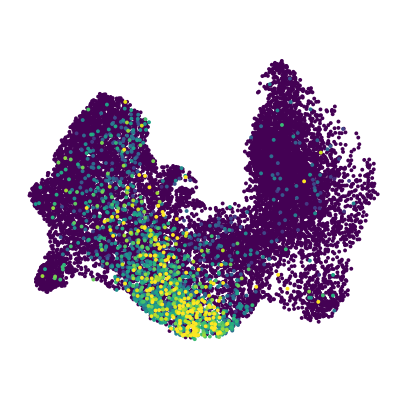

In [44]:
g = 'Slc4a11'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Slc4a11.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

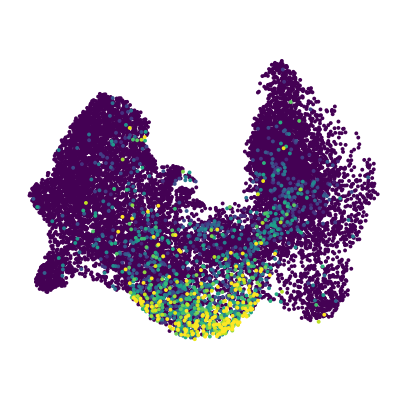

In [45]:
g = 'Csf2'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Csf2.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

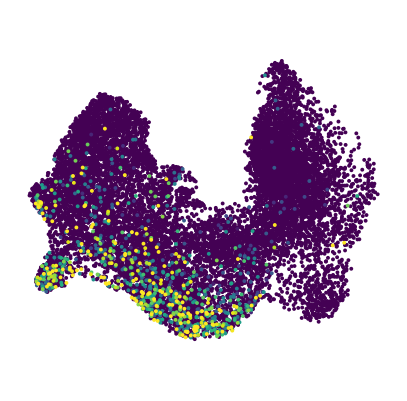

In [46]:
g = 'Krt17'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Krt17.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

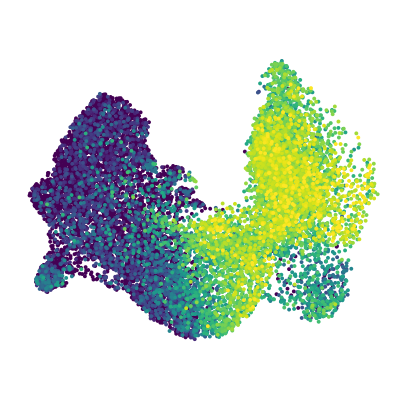

In [47]:
g = 'Vim'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Vim.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

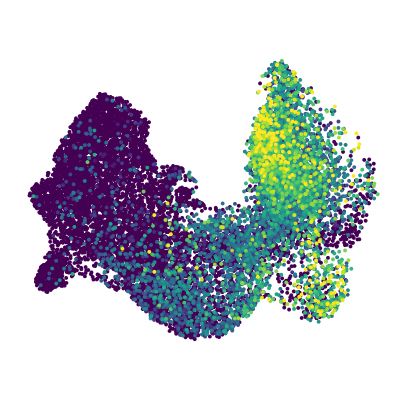

In [48]:
g = 'Vcan'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Vcan.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

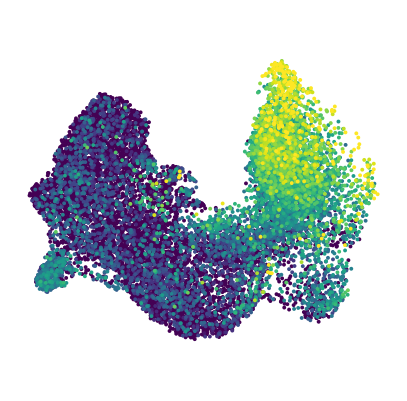

In [49]:
g = 'Sparc'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_autochthonous_Sparc.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

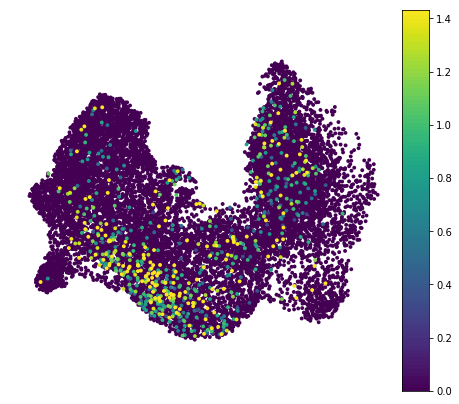

In [72]:
g = 'Lgr5'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=True)
figname = 'UMAP_autochthonous_Lgr5.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [54]:
def draw_violin(data, groups, cmap=plt.cm.tab20, gr_order=None, scatter=False, label='Expression'):
    
    L = len(set(groups))
    
    if not gr_order:
        gr_order = return_unique(groups)
    
    #initialize figure

    height = 4
    width = 2.5 * L

    plt.figure(facecolor = 'w', figsize = (width, height))
    
    #define colormap
    
    if type(cmap) != dict:
        cm = cmap
        cmap = {}
        for ix, gr in enumerate(return_unique(groups)):
            cmap[gr] = cm(float(ix) / 20)
            
    clist = [cmap[groups[c]] for c in groups.index]

    #define x and y axes

    ax = plt.subplot()

    ax.set_xlim(-0.5, L-0.5)
    ax.set_xticks(range(L))
    ax.set_xticklabels(gr_order, family = 'Arial', fontsize = 20, rotation = 'horizontal')

    ax.set_ylim(data.values.min(), data.max())
    ax.set_ylabel(label, family = 'Arial', fontsize = 25)
    for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    
    #plot data

    for p, i in enumerate(gr_order):

        i_tmp = groups[groups==i].index
        d_tmp = data[i_tmp].values
        
        if scatter:
            ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)

        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[i])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    """   
    ax.text((ax.get_xlim()[1]-0.5)/2,
            ax.get_ylim()[1]*1.05,
            data.name, 
            fontsize=25, family='Arial', va='center', ha='center')
    """

In [64]:
## Exclude 'other' cells

c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index

len(c_sel)

Xs = Xs[c_sel]

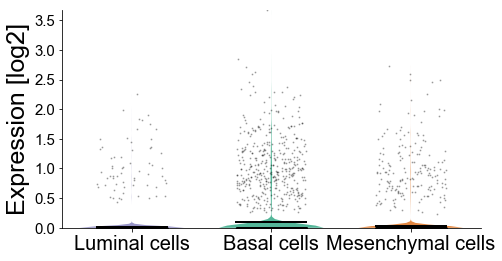

In [66]:
draw_violin(pdX.loc['Lgr5'][Xs.obs_names], Xs.obs['cl_tumor_pca'], 
            cmap=cmap_cl_tumor, gr_order=['Luminal cells','Basal cells','Mesenchymal cells'], scatter=True, label='Expression [log2]')

figname = 'violin_autochthonous_Lgr5.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Pseudotime-dependent genes

In [17]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [18]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Exclude LGK-treated cells

In [19]:
c_sel = Xs.obs[Xs.obs['treatment']!='LGK-974'].index

In [20]:
len(c_sel)

14392

In [21]:
Xs = Xs[c_sel]

## Exclude 'other' cells

In [22]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index

In [23]:
len(c_sel)

13317

In [24]:
Xs = Xs[c_sel]

## Pseudotime on UMAP

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:50: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


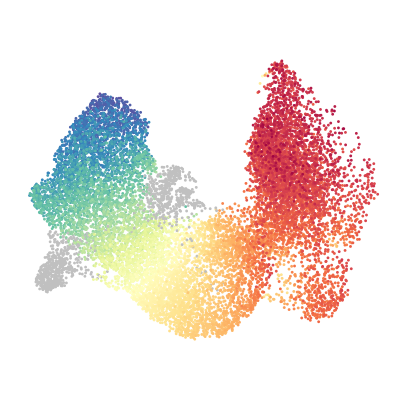

In [37]:
    coords=Xs.obsm['X_umap_pca']
    expr=Xs.obs['dpt_pseudotime_pca']
    vmin=0
    vmax=1
    cmap=plt.cm.Spectral_r
    text=None
    pad=2
    s=8
    show_axes=False
    show_legend=False
    c_sel_other = Xs.obs[Xs.obs['cl_tumor_pca']=='Other'].index
    
    
    if vmax < 1: 
        vmax = 1
    
    #initialize figure
    
    height = 7
    width = 7.5
    plt.figure(facecolor = 'w', figsize = (width, height))
    gs = plt.GridSpec(1,2, wspace=0.025, width_ratios=[7,.5])

    #define x- and y-limits

    x_min, x_max = np.min(coords[:,0]), np.max(coords[:,0])
    y_min, y_max = np.min(coords[:,1]), np.max(coords[:,1])
    x_diff, y_diff = x_max - x_min, y_max - y_min
    x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

    pad = pad

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

    if x_diff < y_diff:
        xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
        ylim = (y_min - pad, y_max + pad)

    #define x- and y-axes

    ax = plt.subplot(gs[0])

    ax.set_xlim(xlim[0], xlim[1])
    ax.set_ylim(ylim[0], ylim[1])
    
    #define colormap
            
    clist = np.array(['silver' if i in c_sel_other else cmap((expr[i]-vmin)/(vmax-vmin)) for i in Xs.obs_names])
    ixz = expr.argsort()
        
    #plot

    ax.scatter(coords[:,0][ixz],
               coords[:,1][ixz], 
               s = s,
               linewidth = 0.0,
               c = clist[ixz.values])
    
    #text
    
    if text:
        ax.text(xlim[0] + (xlim[1]-xlim[0]) / 2,
                ylim[1] * 1.05,
                text,
                fontsize = 15, va = 'center', ha = 'center')
        
    if not show_axes:
        clean_axis(ax)
    
    #plot colorbar
    
    if show_legend:

        ax = plt.subplot(gs[1])

        ax.set_xlim(0,1)
        ax.set_xticks([])

        ax.set_ylim(vmin, vmax)
        ax.yaxis.set_ticks_position('right')

        for i in np.linspace(vmin, vmax, 100):
            ax.axhspan(i, i + (vmax-vmin) / 100, color = cmap((i-vmin)/(vmax-vmin)))
            
figname = 'UMAP_autochthonous_dpt.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Clustering of pseudotemporal genes

In [24]:
def bin_axis(data, n_bins, bin_range, bin_names):
    
    """
    Divides a pseudotemporal axis into bins.
    -----------
    data: [pd.Series] containing the axis coordinates of m cells.
    n_bins: number [int] of bins.
    bin_range: [tuple] of beginning and end of bin range.
    bin_names: [list] of names for each bin.
    -----------
    returns
    """
    
    #get bin edges
    
    bins = np.histogram(data, n_bins, bin_range)[1]
    
    #digitize
    
    dig = np.digitize(data, bins)
    
    #transform to pd.Series with bin names
    
    output = pd.Series(index = data.index)
    
    for pos,ix in enumerate(data.index):
        output.loc[ix] = bin_names[dig[pos]-1]
        
    return bins, output

In [25]:
dpt_pca = Xs.obs['dpt_pseudotime_pca']
stats_pca = Xs.uns['dpt_vgam_stats_pca']
fit_pca = Xs.uns['dpt_vgam_fit_pca']

In [27]:
save_to_txt(stats_pca, path_output, exp_id, 'dpt_stats_pca')

In [28]:
dpt_leiden_pca = Xs.uns['dpt_vgam_clusters_pca']['leiden']

In [29]:
dpt_leiden_pca = groups_reorder(dpt_leiden_pca, ['1','3','0','2'])

In [28]:
Counter(dpt_leiden_pca)

Counter({'1': 1003, '3': 654, '0': 1531, '2': 781})

In [29]:
stats_pca = stats_pca.loc[dpt_leiden_pca.index]
fit_pca = fit_pca.loc[dpt_leiden_pca.index].astype(float)

In [30]:
dpt_bins = bin_axis(dpt_pca, 10, (0.0,1.01), range(10))[1]

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:24: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [31]:
cl_score = pd.DataFrame(index = return_unique(dpt_bins), columns = ['Basal cells', 'Luminal cells', 'Mesenchymal cells', 'Other'])

for b in return_unique(dpt_bins):
    c_tmp = dpt_bins[dpt_bins==b].index
    cnt_tmp = Counter(Xs.obs['cl_tumor_pca'][c_tmp])
    cl_score.loc[b,'Basal cells'] = cnt_tmp['Basal cells']
    cl_score.loc[b,'Luminal cells'] = cnt_tmp['Luminal cells']
    cl_score.loc[b,'Mesenchymal cells'] = cnt_tmp['Mesenchymal cells']

In [32]:
cl_score_sw = pd.DataFrame(columns = ['Basal cells', 'Luminal cells', 'Mesenchymal cells', 'Other'])
n = 50

for i,w in enumerate(windowed(dpt_pca.sort_values().index, n)):
    cnt_tmp = Counter(Xs.obs['cl_tumor_pca'][list(w)])
    cl_score_sw.loc[i,'Basal cells'] = cnt_tmp['Basal cells']
    cl_score_sw.loc[i,'Luminal cells'] = cnt_tmp['Luminal cells']
    cl_score_sw.loc[i,'Mesenchymal cells'] = cnt_tmp['Mesenchymal cells']

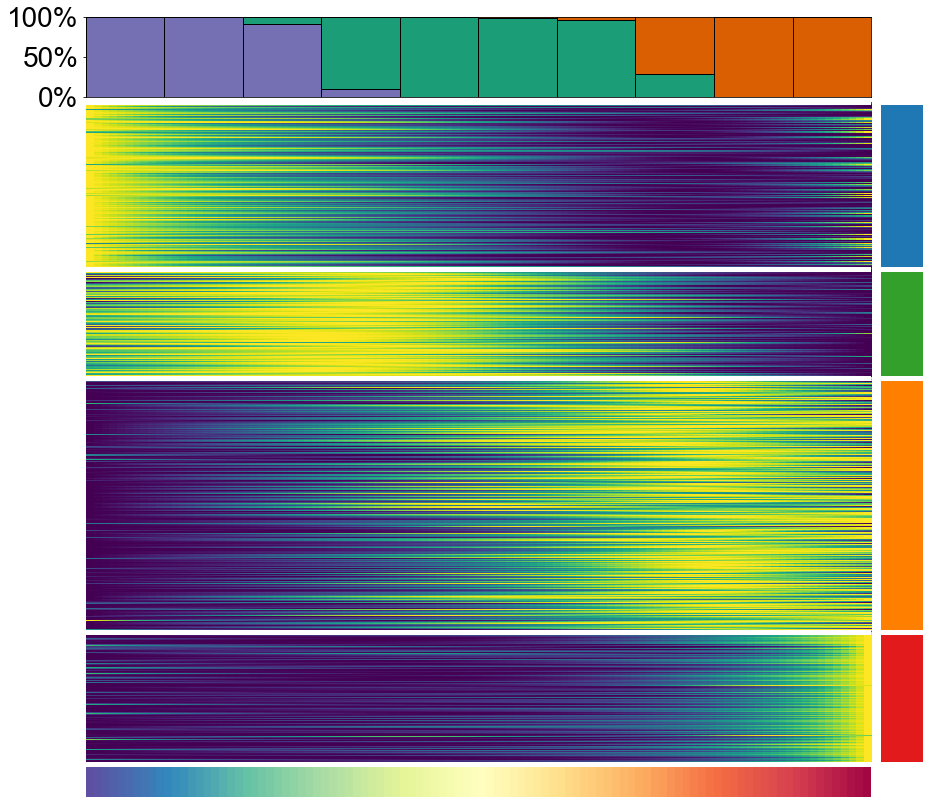

In [34]:
dataset = fit_pca.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)
gene_groups = dpt_leiden_pca
bins = dpt_bins
cc = cl_score.apply(lambda x: x / np.sum(x), axis = 1)
cmap_pop = cmap_cl_tumor
cmap_g = {'1':'#1f78b4','3':'#33a02c','0':'#ff7f00','2':'#e31a1c'}

#initialize figure

height = 15
width = 15

fig = plt.figure(facecolor = 'w', figsize = (width, height))
gs1 = plt.GridSpec(4, 2, hspace=0.025, wspace=0.025, height_ratios=[2,16.5,0.75,0.75], width_ratios = [14.25,0.75])

#draw heatmap in pseudotime

dataset = dataset.loc[gene_groups.index]
ax0 = plt.subplot(gs1[1,0])
ax0.set_ylim(len(dataset.index), 0)
ax0.matshow(dataset, aspect = 'auto', cmap = plt.cm.viridis, vmin = 0, vmax = 1.0)
clean_axis(ax0)

#PTO colormap

ax2 = plt.subplot(gs1[2,0])
ax2.set_xlim(0,1)
for pos in np.arange(0,1,0.01):
    ax2.axvspan(pos, pos + 0.01, color = plt.cm.Spectral_r(pos))    
clean_axis(ax2)

#gene group identity

ax3 = plt.subplot(gs1[1,1])
ax3.set_ylim(len(dataset.index),0)
for pos, gr in enumerate(gene_groups.values):
    ax3.axhspan(pos, pos + 1, color = cmap_g[gr])  
clean_axis(ax3)

#draw lines

for gr in set(gene_groups): 
    pos = list(gene_groups).index(gr)   
    ax0.axhline(pos, color = 'white', linewidth = 5)
    ax3.axhline(pos, color = 'white', linewidth = 5)
    
#population

ax4 = plt.subplot(gs1[0,0])

ax4.set_xlim(-0.5, len(set(bins))-0.5)
ax4.set_xticks([])
ax4.set_ylim(0,1)
ax4.set_yticks([0.0,0.5,1.0])
ax4.set_yticklabels(['0%','50%','100%'], family = 'Arial', fontsize = 28)

for pos, b in enumerate(range(10)):
    y0 = 0
    for gr in ['Luminal cells', 'Basal cells', 'Mesenchymal cells']:
        ax4.bar(x = pos, height = y0 + cc.loc[b,gr], bottom = y0, 
                color = cmap_pop[gr], width = 1, linewidth = 1, edgecolor = 'black')
        y0 += cc.loc[b,gr]
figname = 'heatmap_dpt.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Sliding window

In [34]:
def sliding_window(dat, dpt, metric='mean', n=25):
    
    from more_itertools import windowed
    
    out=pd.DataFrame(index=dat.index)
    
    if metric == 'mean':
        for w in windowed(list(dpt.sort_values().index), n):
            out[str(dpt[list(w)].mean())] = dat[list(w)].mean(axis=1)
            
    return out

In [42]:
pdXsc = sliding_window(pdX, Xs.obs['dpt_pseudotime_pca'], metric='mean', n=250)

In [44]:
cl_score_sw = pd.DataFrame(columns = ['Basal cells', 'Luminal cells', 'Mesenchymal cells', 'Other'])
n = 250

for i,w in enumerate(windowed(dpt_pca.sort_values().index, n)):
    cnt_tmp = Counter(Xs.obs['cl_tumor_pca'][list(w)])
    cl_score_sw.loc[i,'Basal cells'] = cnt_tmp['Basal cells']
    cl_score_sw.loc[i,'Luminal cells'] = cnt_tmp['Luminal cells']
    cl_score_sw.loc[i,'Mesenchymal cells'] = cnt_tmp['Mesenchymal cells']

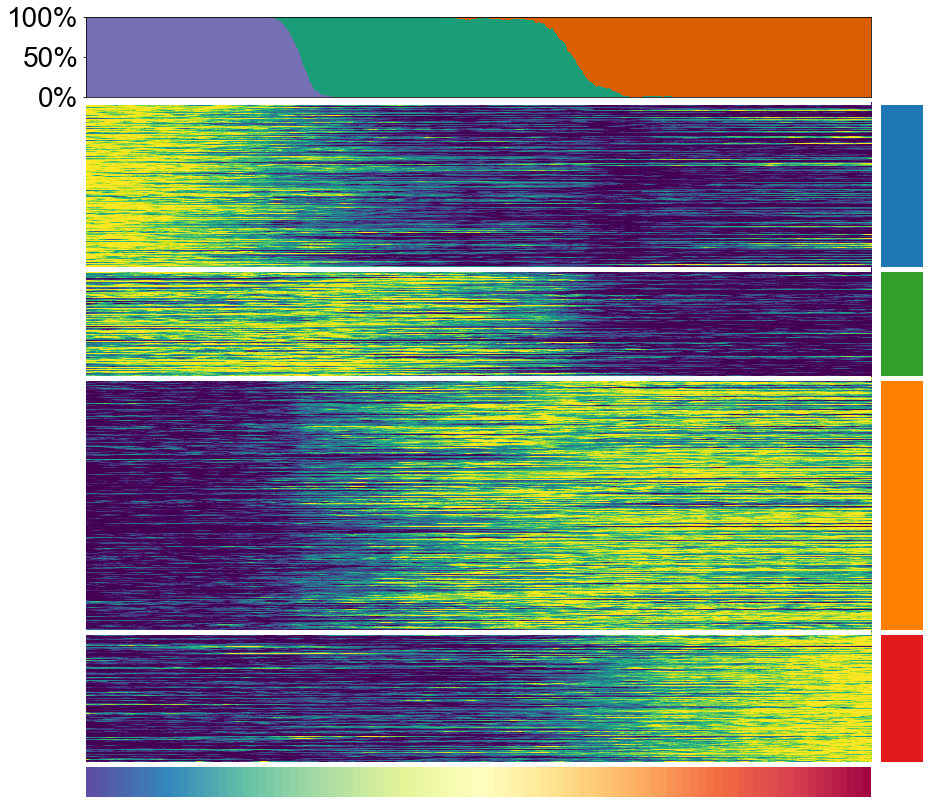

In [47]:
dataset = pdXsc.apply(lambda x: (x-np.percentile(x,1))/(np.percentile(x,99)-np.percentile(x,1)), axis=1)
gene_groups = dpt_leiden_pca
bins = dpt_bins
cc = cl_score_sw.apply(lambda x: x / np.sum(x), axis = 1)
cmap_pop = cmap_cl_tumor
cmap_g = {'1':'#1f78b4','3':'#33a02c','0':'#ff7f00','2':'#e31a1c'}

#initialize figure

height = 15
width = 15

fig = plt.figure(facecolor = 'w', figsize = (width, height))
gs1 = plt.GridSpec(4, 2, hspace=0.025, wspace=0.025, height_ratios=[2,16.5,0.75,0.75], width_ratios = [14.25,0.75])

#draw heatmap in pseudotime

dataset = dataset.loc[gene_groups.index]
ax0 = plt.subplot(gs1[1,0])
ax0.set_ylim(len(dataset.index), 0)
ax0.matshow(dataset, aspect = 'auto', cmap = plt.cm.viridis, vmin = 0.1, vmax = 0.9)
clean_axis(ax0)

#PTO colormap

ax2 = plt.subplot(gs1[2,0])
ax2.set_xlim(0,1)
for pos in np.arange(0,1,0.01):
    ax2.axvspan(pos, pos + 0.01, color = plt.cm.Spectral_r(pos))    
clean_axis(ax2)

#gene group identity

ax3 = plt.subplot(gs1[1,1])
ax3.set_ylim(len(dataset.index),0)
for pos, gr in enumerate(gene_groups.values):
    ax3.axhspan(pos, pos + 1, color = cmap_g[gr])  
clean_axis(ax3)

#draw lines

for gr in set(gene_groups): 
    pos = list(gene_groups).index(gr)   
    ax0.axhline(pos, color = 'white', linewidth = 5)
    ax3.axhline(pos, color = 'white', linewidth = 5)
    
#population

ax4 = plt.subplot(gs1[0,0])

ax4.set_xlim(-0.5, len(cc.index))
ax4.set_xticks([])
ax4.set_ylim(0,1)
ax4.set_yticks([0.0,0.5,1.0])
ax4.set_yticklabels(['0%','50%','100%'], family = 'Arial', fontsize = 28)

ax4.bar(x = cc.index, height = cc['Luminal cells'], bottom = 0, 
        color = cmap_pop['Luminal cells'], width = 1, linewidth = 0)
ax4.bar(x = cc.index, height = cc['Luminal cells']+cc['Basal cells'], bottom = cc['Luminal cells'], 
        color = cmap_pop['Basal cells'], width = 1, linewidth = 0)
ax4.bar(x = cc.index, height = 1, bottom = cc['Luminal cells']+cc['Basal cells'], 
        color = cmap_pop['Mesenchymal cells'], width = 1, linewidth = 0)

figname = 'heatmap_dpt_sw250.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Gene set enrichment analysis

### Luminal

In [26]:
genes1 = dpt_leiden_pca[dpt_leiden_pca=='1'].index

In [27]:
len(genes1)

1003

In [29]:
enr_genes1 = gp.enrichr(gene_list=list(genes1),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

In [30]:
enr_genes1.res2d['Term'] = [i.split(' Homo sapiens')[0] for i in enr_genes1.res2d['Term']]

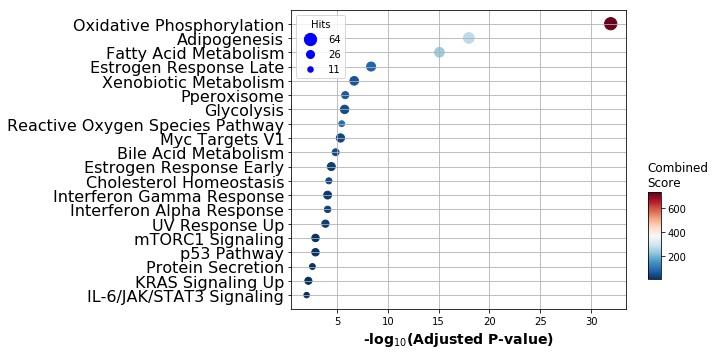

In [31]:
gp.plot.dotplot(enr_genes1.res2d, top_term=20)
figname = 'dpt_gsea_luminal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Basal

In [32]:
genes3 = dpt_leiden_pca[dpt_leiden_pca=='3'].index

In [33]:
len(genes3)

654

In [34]:
enr_genes3 = gp.enrichr(gene_list=list(genes3),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

In [35]:
enr_genes3.res2d['Term'] = [i.split(' Homo sapiens')[0] for i in enr_genes3.res2d['Term']]

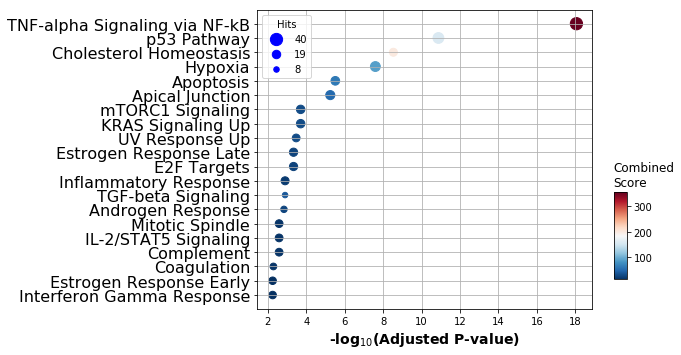

In [36]:
gp.plot.dotplot(enr_genes3.res2d, top_term=20)
figname = 'dpt_gsea_basal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Mesenchymal I

In [37]:
genes0 = dpt_leiden_pca[dpt_leiden_pca=='0'].index

In [38]:
len(genes0)

1531

In [39]:
enr_genes0 = gp.enrichr(gene_list=list(genes0),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

In [40]:
enr_genes0.res2d['Term'] = [i.split(' Homo sapiens')[0] for i in enr_genes0.res2d['Term']]

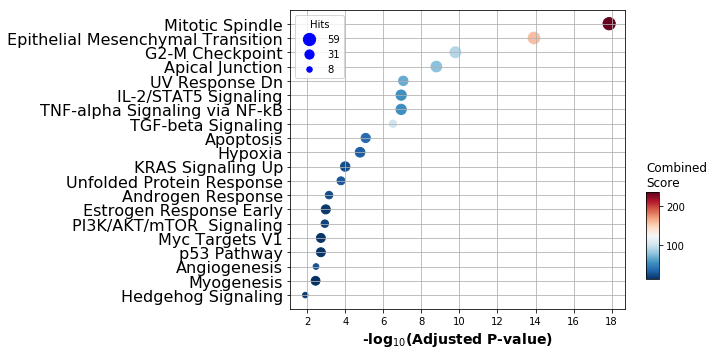

In [41]:
gp.plot.dotplot(enr_genes0.res2d, top_term=20)
figname = 'dpt_gsea_mes1.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Mesenchymal II

In [42]:
genes2 = dpt_leiden_pca[dpt_leiden_pca=='2'].index

In [43]:
len(genes2)

781

In [44]:
enr_genes2 = gp.enrichr(gene_list=list(genes2),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.001,
                        no_plot=True,)

In [45]:
enr_genes2.res2d['Term'] = [i.split(' Homo sapiens')[0] for i in enr_genes2.res2d['Term']]

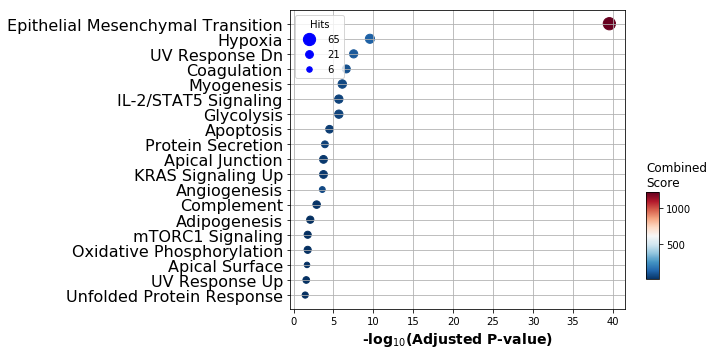

In [46]:
gp.plot.dotplot(enr_genes2.res2d, top_term=20)
figname = 'dpt_gsea_mes2.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Marker genes over pseudotime - heatmap

In [48]:
def fit_vgam(adata, genes, var_pt, var_sf='size_factor', layer='raw', neg_log = False, steps=101, df=3):
    
    assert var_pt in adata.obs.columns, 'var_pt not in adata.obs'
    assert var_sf in adata.obs.columns, 'var_sf not in adata.obs'

    from rpy2 import robjects
    from rpy2.robjects import FloatVector
    from rpy2.robjects.packages import importr

    rbase = importr('base')
    rvgam = importr('VGAM', robject_translations = {"nvar.vlm": "nvar__vlm"})
    rstats = importr('stats')
    robjects.r['options'](warn=-1)
    
    fit = pd.DataFrame(index=genes, columns=np.linspace(0., np.max(adata.obs[var_pt]), steps).astype(str))
    stats = pd.DataFrame(index = genes, columns=['Chisq','Pr(>Chisq)'])
    
    pt = robjects.FloatVector(adata.obs[var_pt])
    sf = robjects.FloatVector(adata.obs[var_sf])
    X_pred = robjects.FloatVector(np.linspace(0, np.max(adata.obs[var_pt]), steps))
    
    
    for g in genes:
        try:
            Y = robjects.FloatVector(np.rint(np.array(adata[:,g].layers[layer].todense()).flatten()))

            DF = robjects.DataFrame({'Y':Y, 'X':pt, 'sf':sf})

            fmla_red = robjects.Formula("Y ~ 1")
            fit_red = rvgam.vglm(fmla_red, rvgam.negbinomial, data = DF, 
                                 na_action = robjects.r['na.fail'], smart = True)

            fmla_full = robjects.Formula("Y ~ sm.ns(X, df = %s)" % df)                         
            fit_full = rvgam.vglm(fmla_full, rvgam.negbinomial, data = DF, 
                                 na_action = robjects.r['na.fail'], smart = True)

            DF_pred = robjects.DataFrame({'X':X_pred})
            predicted = rvgam.predict(fit_full, newdata = DF_pred, type = 'response')
            fit.loc[g] = list(predicted.flatten())

            lr_stats_red = rvgam.lrtest(fit_full, fit_red)
            stats.loc[g]['Chisq','Pr(>Chisq)'] = [lr_stats_red.do_slot('Body').loc['2']['Chisq'],
                                                  lr_stats_red.do_slot('Body').loc['2']['Pr(>Chisq)']]
        except:
            continue
        
        
    stats['Pr(>Chisq)'] = rstats.p_adjust(FloatVector(stats['Pr(>Chisq)']), method = 'BH')
        
    if neg_log:
        stats['Pr(>Chisq)'] = -np.log10(stats['Pr(>Chisq)'].astype(float))
    
    return fit, stats

In [49]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Exclude LGK-treated cells

In [50]:
c_sel = Xs.obs[Xs.obs['treatment']!='LGK-974'].index

In [51]:
len(c_sel)

14392

In [52]:
Xs = Xs[c_sel]

## Exclude 'other' cells

In [53]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index

In [54]:
len(c_sel)

13317

In [55]:
Xs = Xs[c_sel]

## Subsample cells

In [56]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))[Xs.obs_names]

In [57]:
X.obs['dpt_pseudotime_pca'] = Xs.obs['dpt_pseudotime_pca']

Trying to set attribute `.obs` of view, copying.


In [58]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index
c_sel = np.random.choice(c_sel, 10000, replace=False)

## Fit

In [59]:
gene_groups = pd.Series()
for g in ['Muc1','Muc2','Muc3','Muc3a','Muc4','Muc5ac','Muc5b','Muc6']:
    gene_groups[g] = 'Mucins'
for g in ['C1galt1','Galnt4', 'Galnt5', 'Galnt6', 'Galnt7','Gcnt3','St6galnac1']:
    gene_groups[g] = 'O-Glycan'
for g in ['Krt4','Krt6b','Krt7','Krt8','Krt14','Krt15','Krt16','Krt17']:
    gene_groups[g] = 'Keratins'
for g in ['Agrn','Col4a1','Col4a2','Lama3','Lama5','Lamb3','Lamc2','Npnt']:
    gene_groups[g] = 'Basement membrane I'
for g in ['Col6a1','Col6a2','Col6a3','Col15a1','Col18a1','Hmcn1', 'Hspg2','Lama4','Lamb1','Lamc1','Nid1','Ntn1','Ntng1']:
    gene_groups[g] = 'Basement membrane II'
for g in ['Col1a1','Col1a2','Dcn','Fn1','Sparc','Vcan']:
    gene_groups[g] = 'Extracellular matrix'
for g in ['Snai1', 'Snai2', 'Twist1', 'Twist2', 'Zeb1', 'Zeb2', 'Mmp2', 'Tgfb1']:
    gene_groups[g] = 'EMT'
for g in ['Lgr5']:
    gene_groups[g] = 'Other'  

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  """Entry point for launching an IPython kernel.


In [60]:
fit_pca_markers, stats_pca_markers = fit_vgam(X[c_sel],
                              list(gene_groups.index), 
                              'dpt_pseudotime_pca', 
                              layer = 'norm_log2',
                              neg_log = False, df=3)

In [61]:
len(gene_groups)

59

In [62]:
g_sel = ['Muc1','Muc2','Muc3','Muc4','Muc5ac','Muc6',
         'C1galt1','Galnt4', 'Galnt5','Galnt6','Gcnt3','St6galnac1',
         'Krt4','Krt6b','Krt14','Krt15','Krt16','Krt17',
         'Agrn','Col4a1','Lama5','Lamb3','Lamc2','Npnt',
         'Mmp2','Snai1','Snai2','Tgfb1','Twist1','Zeb1',
         'Col6a1', 'Hspg2','Lama4','Lamb1','Nid1','Ntn1',
         'Col1a1','Col1a2','Dcn','Fn1','Sparc','Vcan']

In [63]:
dpt_pca = Xs.obs['dpt_pseudotime_pca']
dpt_bins = bin_axis(dpt_pca, 10, (0.0,1.01), range(10))[1]

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:24: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [64]:
cl_score = pd.DataFrame(index = return_unique(dpt_bins), columns = ['Basal cells', 'Luminal cells', 'Mesenchymal cells', 'Other'])

for b in return_unique(dpt_bins):
    c_tmp = dpt_bins[dpt_bins==b].index
    cnt_tmp = Counter(Xs.obs['cl_tumor_pca'][c_tmp])
    cl_score.loc[b,'Basal cells'] = cnt_tmp['Basal cells']
    cl_score.loc[b,'Luminal cells'] = cnt_tmp['Luminal cells']
    cl_score.loc[b,'Mesenchymal cells'] = cnt_tmp['Mesenchymal cells']

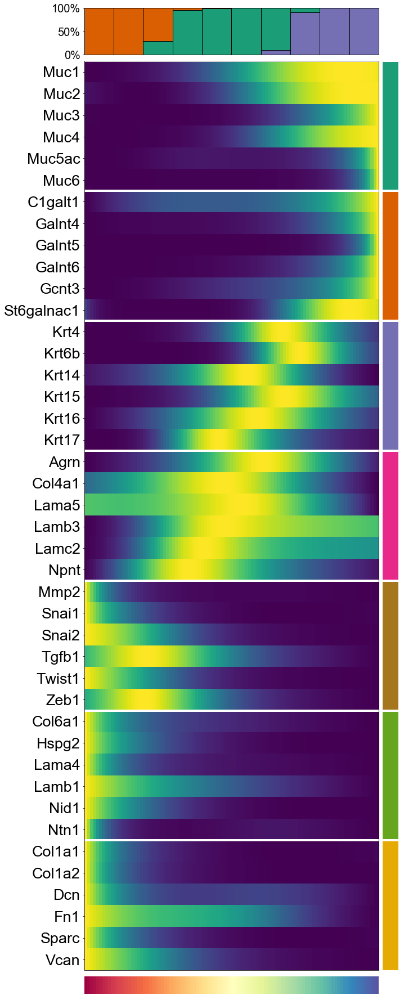

In [64]:
dataset = fit_pca_markers.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)
gene_groups = gene_groups[g_sel]
bins = dpt_bins
cc = cl_score.apply(lambda x: x / np.sum(x), axis = 1)
cmap_pop = cmap_cl_tumor
cmap_g = {'Mucins':'#1b9e77',
          'O-Glycan':'#d95f02',
          'Keratins':'#7570b3',
          'Basement membrane I':'#e7298a',
          'Basement membrane II':'#66a61e',
          'Extracellular matrix':'#e6ab02',
          'EMT':'#a6761d',}

#initialize figure

height = 33
width = 10

fig = plt.figure(facecolor = 'w', figsize = (width, height))
gs1 = plt.GridSpec(4, 2, hspace=0.025, wspace=0.025, height_ratios=[2,39,0.75,0.75], width_ratios = [14.25,0.75])

#draw heatmap in pseudotime

dataset = dataset.loc[gene_groups.index]
dataset = dataset[dataset.columns[::-1]] #reverse plot
ax0 = plt.subplot(gs1[1,0])
ax0.matshow(dataset, aspect = 'auto', cmap = plt.cm.viridis, vmin = 0, vmax = 1.0)
ax0.set_ylim(len(dataset.index)-0.5, -0.5)
ax0.set_yticks(list(range(len(gene_groups.index))))
ax0.set_yticklabels(gene_groups.index, family='Arial', fontsize = 27)
ax0.set_xticks([])

#PTO colormap

ax2 = plt.subplot(gs1[2,0])
ax2.set_xlim(0,1)
for pos in np.arange(0,1,0.01):
    ax2.axvspan(pos, pos + 0.01, color = plt.cm.Spectral(pos))    
clean_axis(ax2)

#gene group identity

ax3 = plt.subplot(gs1[1,1])
ax3.set_ylim(len(dataset.index),0)
for pos, gr in enumerate(gene_groups.values):
    ax3.axhspan(pos, pos + 1, color = cmap_g[gr])  
clean_axis(ax3)

#draw lines

for gr in set(gene_groups): 
    pos = list(gene_groups).index(gr)   
    ax0.axhline(pos-0.5, color = 'white', linewidth = 4)
    ax3.axhline(pos, color = 'white', linewidth = 4)
    
#population

ax4 = plt.subplot(gs1[0,0])

ax4.set_xlim(-0.5, len(set(bins))-0.5)
ax4.set_xticks([])
ax4.set_ylim(0,1)
ax4.set_yticks([0.0,0.5,1.0])
ax4.set_yticklabels(['0%','50%','100%'], family = 'Arial', fontsize = 20)

for pos, b in enumerate(range(10)[::-1]):
    y0 = 0
    for gr in ['Luminal cells', 'Basal cells', 'Mesenchymal cells']:
        ax4.bar(x = pos, height = y0 + cc.loc[b,gr], bottom = y0, 
                color = cmap_pop[gr], width = 1, linewidth = 1, edgecolor = 'black')
        y0 += cc.loc[b,gr]
        
figname = 'heatmap_dpt_markers_r.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Sliding window

In [74]:
cl_score_sw = pd.DataFrame(columns = ['Basal cells', 'Luminal cells', 'Mesenchymal cells', 'Other'])
n = 100

for i,w in enumerate(windowed(dpt_pca.sort_values().index, n)):
    cnt_tmp = Counter(Xs.obs['cl_tumor_pca'][list(w)])
    cl_score_sw.loc[i,'Basal cells'] = cnt_tmp['Basal cells']
    cl_score_sw.loc[i,'Luminal cells'] = cnt_tmp['Luminal cells']
    cl_score_sw.loc[i,'Mesenchymal cells'] = cnt_tmp['Mesenchymal cells']

In [75]:
pdXsc = sliding_window(pdX, Xs.obs['dpt_pseudotime_pca'], metric='mean', n=250)

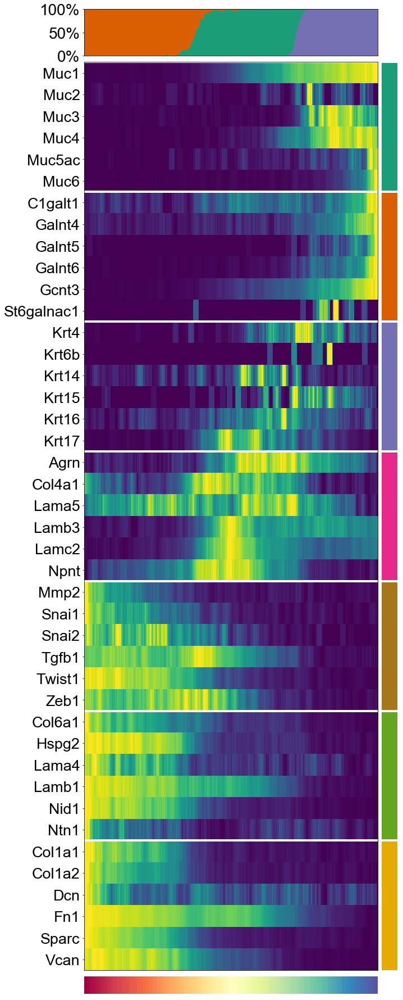

In [76]:
dataset = pdXsc.apply(lambda x: (x-np.percentile(x,1))/(np.percentile(x,99)-np.percentile(x,1)), axis=1)
gene_groups = gene_groups[g_sel]
bins = dpt_bins
cc = cl_score_sw.apply(lambda x: x / np.sum(x), axis = 1)[::-1]
cmap_pop = cmap_cl_tumor
cmap_g = {'Mucins':'#1b9e77',
          'O-Glycan':'#d95f02',
          'Keratins':'#7570b3',
          'Basement membrane I':'#e7298a',
          'Basement membrane II':'#66a61e',
          'Extracellular matrix':'#e6ab02',
          'EMT':'#a6761d',}

#initialize figure

height = 33
width = 10

fig = plt.figure(facecolor = 'w', figsize = (width, height))
gs1 = plt.GridSpec(4, 2, hspace=0.025, wspace=0.025, height_ratios=[2,39,0.75,0.75], width_ratios = [14.25,0.75])

#draw heatmap in pseudotime

dataset = dataset.loc[gene_groups.index]
dataset = dataset[dataset.columns[::-1]] #reverse plot
ax0 = plt.subplot(gs1[1,0])
ax0.matshow(dataset, aspect = 'auto', cmap = plt.cm.viridis, vmin = 0, vmax = 1.0)
ax0.set_ylim(len(dataset.index)-0.5, -0.5)
ax0.set_yticks(list(range(len(gene_groups.index))))
ax0.set_yticklabels(gene_groups.index, family='Arial', fontsize = 27)
ax0.set_xticks([])

#PTO colormap

ax2 = plt.subplot(gs1[2,0])
ax2.set_xlim(0,1)
for pos in np.arange(0,1,0.01):
    ax2.axvspan(pos, pos + 0.01, color = plt.cm.Spectral(pos))    
clean_axis(ax2)

#gene group identity

ax3 = plt.subplot(gs1[1,1])
ax3.set_ylim(len(dataset.index),0)
for pos, gr in enumerate(gene_groups.values):
    ax3.axhspan(pos, pos + 1, color = cmap_g[gr])  
clean_axis(ax3)

#draw lines

for gr in set(gene_groups): 
    pos = list(gene_groups).index(gr)   
    ax0.axhline(pos-0.5, color = 'white', linewidth = 4)
    ax3.axhline(pos, color = 'white', linewidth = 4)
    
#population

ax4 = plt.subplot(gs1[0,0])

ax4.set_xlim(-0.5, len(cc.index))
ax4.set_xticks([])
ax4.set_ylim(0,1)
ax4.set_yticks([0.0,0.5,1.0])
ax4.set_yticklabels(['0%','50%','100%'], family = 'Arial', fontsize = 28)

ax4.bar(x = cc.index[::-1], height = cc['Luminal cells'], bottom = 0, 
        color = cmap_pop['Luminal cells'], width = 1, linewidth = 0)
ax4.bar(x = cc.index[::-1], height = cc['Luminal cells']+cc['Basal cells'], bottom = cc['Luminal cells'], 
        color = cmap_pop['Basal cells'], width = 1, linewidth = 0)
ax4.bar(x = cc.index[::-1], height = 1, bottom = cc['Luminal cells']+cc['Basal cells'], 
        color = cmap_pop['Mesenchymal cells'], width = 1, linewidth = 0)

figname = 'heatmap_dpt_markers_r_sw250.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Marker genes over pseudotime - scatter

In [77]:
def draw_expression_pseudotime(df, fit1, fit2, gene, pt, groups, label=None, cmap=plt.cm.tab20):
    
    from statsmodels.nonparametric.smoothers_lowess import lowess
    
    dat = df.loc[gene]
    
    if not label:
        label=gene
    
    #define cmap
    
    if type(cmap) != dict:
        cm = cmap
        cmap = {}
        for ix, gr in enumerate(return_unique(groups)):
            cmap[gr] = cm(float(ix) / 20)
            
    clist = [cmap[groups[c]] for c in groups.index]
    
    #initialize figure

    height = 5
    width = 10

    plt.figure(facecolor = 'w', figsize = (width, height))
    
    ax = plt.subplot(111)
    
    #define axes
    
    ax.set_xlim(0,1)
    ax.set_xticks([])
    ax.set_xlabel('Pseudotime', family = 'Arial', fontsize = 32)
    
    ax.set_ylabel(label, family = 'Arial', fontsize = 30)
    
    for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)

    #plot scatter
    
    ax.scatter(pt, dat[pt.index], s=10, color=clist)
    
    #plot fit1
    
    if type(fit1) == pd.DataFrame:
        dat_fit1 = fit1.loc[gene]
        ax.plot(np.array(dat_fit1.index).astype(float), dat_fit1, color='k', lw=5, linestyle='--')
        
    #plot fit2
    
    if type(fit2) == pd.DataFrame:
        print(type(fit2))
        dat_fit2 = fit2.loc[gene]
        ax.plot(np.array(dat_fit2.index).astype(float),dat_fit2, color='b', lw=3)

In [78]:
pdX = sc2pd(X, 'norm_log2')[Xs.obs['dpt_pseudotime_pca'].sort_values().index]

In [79]:
genes_sel = ['Lgals4','Vim','Epcam','Krt17']

In [80]:
pdXsc = sliding_window(pdX.loc[genes_sel], Xs.obs['dpt_pseudotime_pca'], metric='mean', n=250)

/Users/simjoo/.local/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1377: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/Users/simjoo/.local/lib/python3.6/site-packages/matplotlib/axes/_base.py:239: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


<class 'pandas.core.frame.DataFrame'>


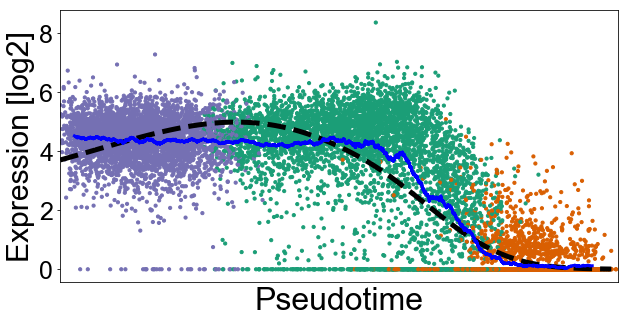

In [81]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           pdXsc,
                           'Epcam',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)
figname = 'scatter_dpt_Epcam.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

<class 'pandas.core.frame.DataFrame'>


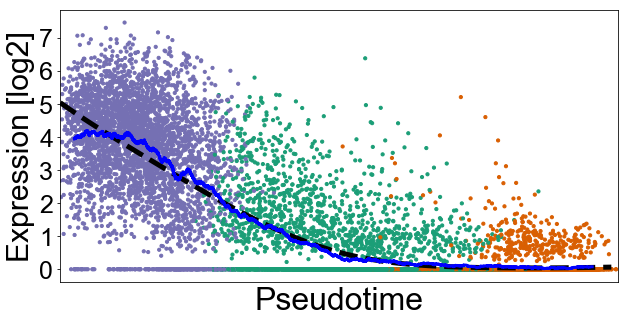

In [82]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           pdXsc,
                           'Lgals4',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)
figname = 'scatter_dpt_Lgals4.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

<class 'pandas.core.frame.DataFrame'>


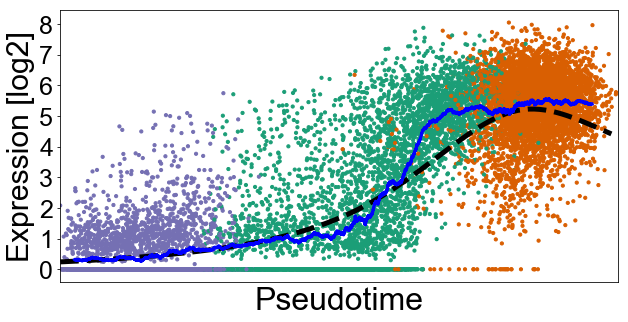

In [83]:
draw_expression_pseudotime(pdX,
                           fit_pca,
                           pdXsc,
                           'Vim',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)
figname = 'scatter_dpt_Vim.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

<class 'pandas.core.frame.DataFrame'>


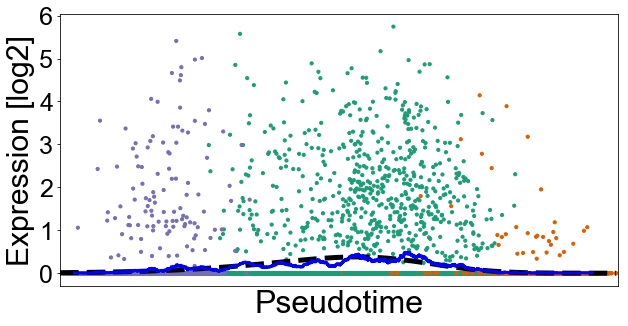

In [84]:
draw_expression_pseudotime(pdX,
                           fit_pca_markers,
                           pdXsc,
                           'Krt17',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)
figname = 'scatter_dpt_Krt17.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

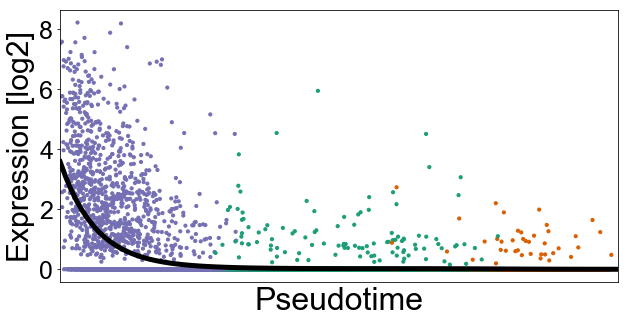

In [117]:
draw_expression_pseudotime(pdX,
                           fit_pca_markers,
                           'Muc6',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)
figname = 'scatter_dpt_Muc6.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

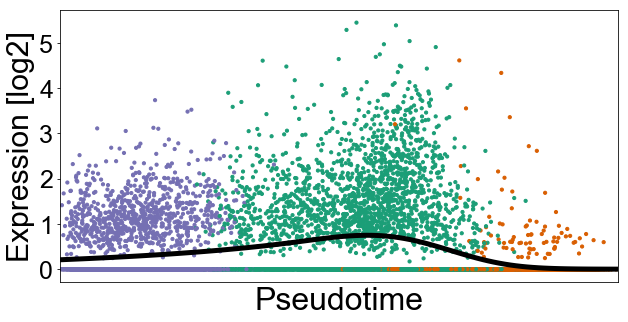

In [119]:
draw_expression_pseudotime(pdX,
                           fit_pca_markers,
                           'Lama3',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)

figname = 'scatter_dpt_Lama3.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

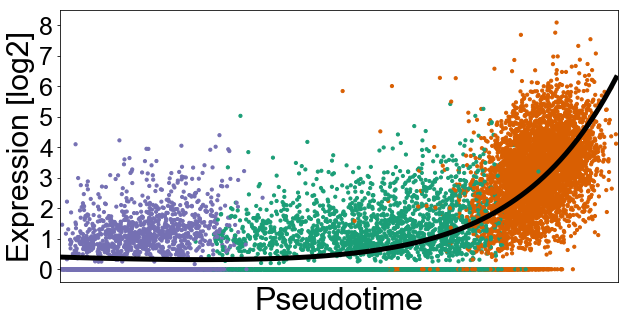

In [120]:
draw_expression_pseudotime(pdX,
                           fit_pca_markers,
                           'Sparc',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)

figname = 'scatter_dpt_Sparc.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

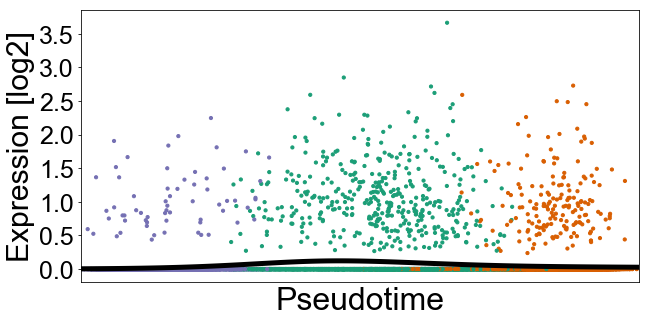

In [121]:
draw_expression_pseudotime(pdX,
                           fit_pca_markers,
                           'Lgr5',
                           Xs.obs['dpt_pseudotime_pca'], 
                           Xs.obs['cl_tumor_pca'],
                           label='Expression [log2]',
                           cmap=cmap_cl_tumor)

figname = 'scatter_dpt_Lgr5.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Ternary plot of autochthonous cells

In [38]:
Xs_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

In [39]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

## Select autochthonous cells

In [40]:
c_sel = Xs.obs[Xs.obs['tumor']=='autochthonous'].index

In [41]:
len(c_sel)

18413

In [42]:
Xs = Xs[c_sel]

## Exclude LGK-treated cells

In [43]:
c_sel = Xs.obs[Xs.obs['treatment']!='LGK-974'].index

In [44]:
len(c_sel)

14392

In [45]:
Xs = Xs[c_sel]

## Exclude 'other' cells

In [46]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index

In [47]:
len(c_sel)

13733

In [48]:
Xs = Xs[c_sel]

## Exclude training cells

In [49]:
c_sel = Xs.obs[Xs.obs['train_pca']==False].index

In [50]:
len(c_sel)

8781

In [51]:
Xs = Xs[c_sel]

## Plot

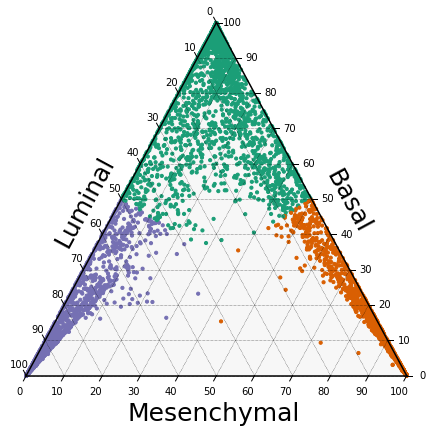

In [59]:
dat = list(zip(Xs[c_sel].obs['pheno_prob2_pca']*100, 
               Xs[c_sel].obs['pheno_prob1_pca']*100,
               Xs[c_sel].obs['pheno_prob0_pca']*100))
cmap = {0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'}
clist = [cmap[i] for i in Xs[c_sel].obs['pheno_class_pca']]

## Boundary and Gridlines
scale = 100
figure, tax = ternary.figure(scale=scale)
figure.set_figheight(7.5)
figure.set_figwidth(7.5)

# Draw Boundary and Gridlines
tax.boundary(linewidth=1.5)
tax.gridlines(color="black", multiple=10, linewidth=0.5)

# Set Axis labels and Title
fontsize = 25
offset = 0.1
tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset)
tax.right_axis_label("Basal", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025)

# Set ticks
tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=10)

# Background color
tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')

#plot scatter

tax.scatter(dat, s=10, color = clist)

figname = 'ternary_autochthonous_class.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

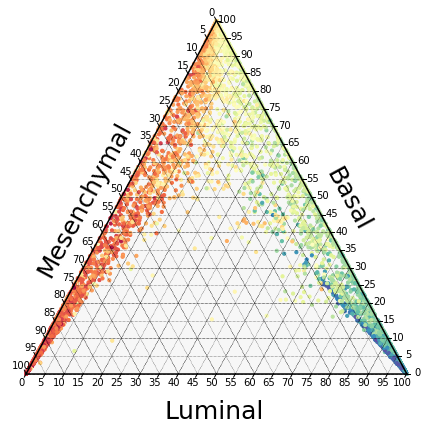

In [191]:
dat = list(zip(Xs[c_sel].obs['pheno_prob0_pca']*100, 
               Xs[c_sel].obs['pheno_prob1_pca']*100,
               Xs[c_sel].obs['pheno_prob2_pca']*100))
cmap = plt.cm.Spectral_r
clist = [cmap(i) for i in Xs_aut[c_sel].obs['dpt_pseudotime_pca']]

## Boundary and Gridlines
scale = 100
figure, tax = ternary.figure(scale=scale)
figure.set_figheight(7.5)
figure.set_figwidth(7.5)

# Draw Boundary and Gridlines
tax.boundary(linewidth=1.5)
tax.gridlines(color="black", multiple=10)
tax.gridlines(color="black", multiple=5, linewidth=0.5)

# Set Axis labels and Title
fontsize = 25
offset = 0.1
tax.left_axis_label("Mesenchymal", fontsize=fontsize, offset=offset)
tax.right_axis_label("Basal", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Luminal", fontsize=fontsize, offset=0.025)

# Set ticks
tax.ticks(axis='lbr', linewidth=1, multiple=5, offset=0.01)

# Background color
tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')

#plot scatter

tax.scatter(dat, s=10, color = clist)

figname = 'ternary_autochthonous_dpt.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Signature expression

In [226]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Exclude LGK-treated cells

In [227]:
c_sel = Xs.obs[Xs.obs['treatment']!='LGK-974'].index

In [228]:
len(c_sel)

14392

In [229]:
Xs = Xs[c_sel]

## Get MaxAbs scaled data

In [230]:
from sklearn.preprocessing import MaxAbsScaler

In [231]:
X_scaled = X[Xs.obs_names]

In [232]:
X_scaled.X = X_scaled.layers['norm_log2']

In [233]:
X_scaled.X = MaxAbsScaler().fit_transform(X_scaled.X)

## LUAD High plasticity state signature

In [234]:
def draw_scatter_expr(coords, expr, vmin, vmax,text = None,  cmap = plt.cm.viridis, pad = 2, s = 50, 
                      show_axes = True, show_legend=True):
    
    #if vmax < 1: 
        #vmax = 1
    
    #initialize figure
    
    height = 7
    width = 7.5
    plt.figure(facecolor = 'w', figsize = (width, height))
    gs = plt.GridSpec(1,2, wspace=0.025, width_ratios=[7,.5])

    #define x- and y-limits

    x_min, x_max = np.min(coords[:,0]), np.max(coords[:,0])
    y_min, y_max = np.min(coords[:,1]), np.max(coords[:,1])
    x_diff, y_diff = x_max - x_min, y_max - y_min
    x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

    pad = pad

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

    if x_diff < y_diff:
        xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
        ylim = (y_min - pad, y_max + pad)

    #define x- and y-axes

    ax = plt.subplot(gs[0])

    ax.set_xlim(xlim[0], xlim[1])
    ax.set_ylim(ylim[0], ylim[1])
    
    #define colormap
            
    clist = np.array([cmap((e-vmin)/(vmax-vmin)) for e in expr])
    ixz = expr.argsort()
        
    #plot

    ax.scatter(coords[:,0][ixz],
               coords[:,1][ixz], 
               s = s,
               linewidth = 0.0,
               c = clist[ixz.values])
    
    #text
    
    if text:
        ax.text(xlim[0] + (xlim[1]-xlim[0]) / 2,
                ylim[1] * 1.05,
                text,
                fontsize = 15, va = 'center', ha = 'center')
        
    if not show_axes:
        clean_axis(ax)
    
    #plot colorbar
    
    if show_legend:

        ax = plt.subplot(gs[1])

        ax.set_xlim(0,1)
        ax.set_xticks([])

        ax.set_ylim(vmin, vmax)
        ax.yaxis.set_ticks_position('right')

        for i in np.linspace(vmin, vmax, 100):
            ax.axhspan(i, i + (vmax-vmin) / 100, color = cmap((i-vmin)/(vmax-vmin)))

In [235]:
sig_HPS = open('%s/LUAD_cluster_5.txt' % path_input, 'r').readlines()
sig_HPS = [i.replace('\n','').capitalize() for i in sig_HPS]

In [236]:
len(sig_HPS)

406

In [237]:
sc.tl.score_genes(X_scaled, sig_HPS, ctrl_size=len(sig_HPS), score_name='score_HPS')

Trying to set attribute `.obs` of view, copying.


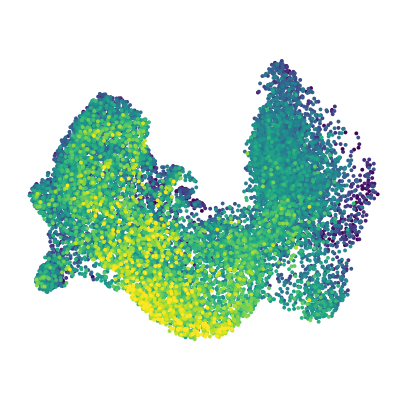

In [240]:
g = 'score_HPS'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)

figname = 'UMAP_signature_HPS.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Moffit et al. basal and classical states

In [675]:
moffit = pd.read_table('%s/41588_2015_BFng3398_MOESM62_ESM.txt' % path_input, sep = '\t', header = 0, index_col = 0)

In [676]:
moffit_gene_sets = moffit['factor']
moffit_gene_sets.index = [i.capitalize() for i in moffit_gene_sets.index]

In [677]:
genes_moffit_basal = moffit_gene_sets[moffit_gene_sets==6].index
genes_moffit_classical = moffit_gene_sets[moffit_gene_sets==8].index

In [678]:
len(genes_moffit_basal)

796

In [679]:
len(genes_moffit_classical)

1012

In [1]:
#sc.tl.score_genes(X_scaled, genes_moffit_basal, ctrl_size=len(genes_moffit_basal), score_name='score_moffit_basal')
#sc.tl.score_genes(X_scaled, genes_moffit_classical, ctrl_size=len(genes_moffit_classical), score_name='score_moffit_classical')

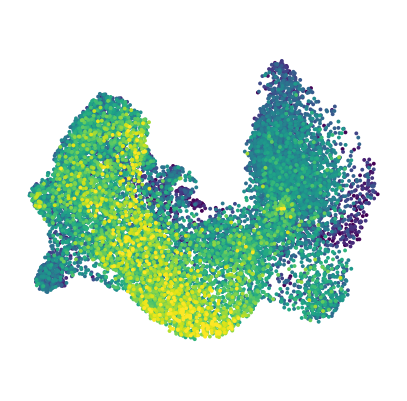

In [687]:
g = 'score_moffit_basal'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_signature_basal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

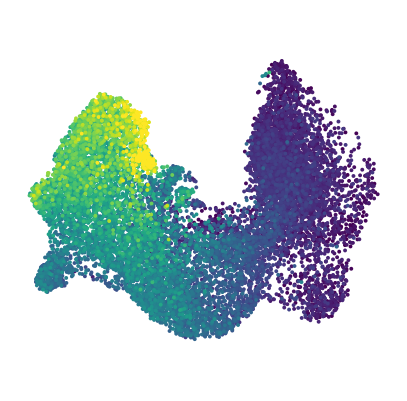

In [688]:
g = 'score_moffit_classical'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_signature_classical.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Collisson et al. states

In [23]:
collisson = pd.read_table('%s/collisson.txt' % path_input, sep = '\t', header = 0, index_col = 0)

In [24]:
genes_collisson_classical = [i.capitalize() for i in collisson[collisson['Classical']>0.75].index]
genes_collisson_exocrine = [i.capitalize() for i in collisson[collisson['Exocrine-like']>0.75].index]
genes_collisson_QM = [i.capitalize() for i in collisson[collisson['Quasi_Mesenchymal']>0.75].index]

In [25]:
print(len(genes_collisson_classical),len(genes_collisson_exocrine),len(genes_collisson_QM))

207 62 75


In [26]:
sc.tl.score_genes(X_scaled, genes_collisson_classical, ctrl_size=len(genes_collisson_classical), score_name='score_collisson_classical')
sc.tl.score_genes(X_scaled, genes_collisson_exocrine, ctrl_size=len(genes_collisson_exocrine), score_name='score_collisson_exocrine')
sc.tl.score_genes(X_scaled, genes_collisson_QM, ctrl_size=len(genes_collisson_QM), score_name='score_collisson_QM')

Trying to set attribute `.obs` of view, copying.


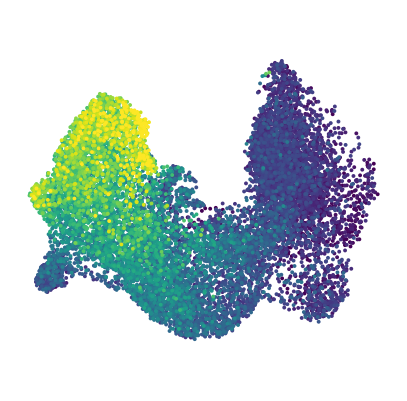

In [29]:
g = 'score_collisson_classical'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_score_collisson_classical.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

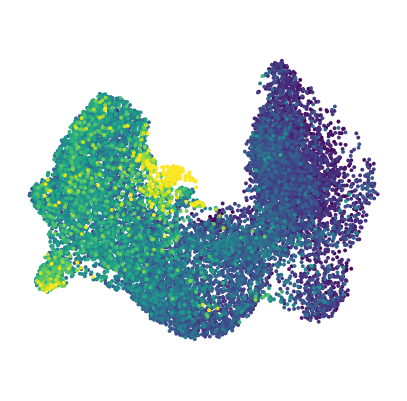

In [30]:
g = 'score_collisson_exocrine'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_score_collisson_exocrine.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

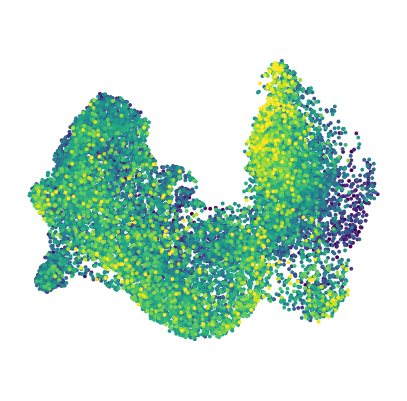

In [31]:
g = 'score_collisson_QM'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_score_collisson_QM.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Bailey et al. states

In [40]:
bailey = pd.read_table('%s/bailey.txt' % path_input, sep = '\t', header = 0, index_col = 0).astype(str)

In [56]:
bailey_dict = {}
for c in bailey.columns:
    bailey_dict[c] = [i.capitalize() for i in bailey[c] if i != 'nan']

In [61]:
genes_bailey_squamous = []
for i in ['yellow','brown','green','purple']:
    genes_bailey_squamous += bailey_dict[i]

In [62]:
genes_bailey_ADEX = []
for i in ['orange','black']:
    genes_bailey_ADEX += bailey_dict[i]

In [64]:
genes_bailey_progenitor = []
for i in ['blue']:
    genes_bailey_progenitor += bailey_dict[i]

In [70]:
genes_bailey_immunogenic = []
for i in ['blue','red','magenta','royalblue']:
    genes_bailey_immunogenic += bailey_dict[i]

In [74]:
#sc.tl.score_genes(X_scaled, genes_bailey_squamous, ctrl_size=len(genes_bailey_squamous), score_name='score_bailey_squamous')
#sc.tl.score_genes(X_scaled, genes_bailey_ADEX, ctrl_size=len(genes_bailey_ADEX), score_name='score_bailey_ADEX')
#sc.tl.score_genes(X_scaled, genes_bailey_progenitor, ctrl_size=len(genes_bailey_progenitor), score_name='score_bailey_progenitor')
#sc.tl.score_genes(X_scaled, genes_bailey_immunogenic, ctrl_size=len(genes_bailey_immunogenic), score_name='score_bailey_immunogenic')

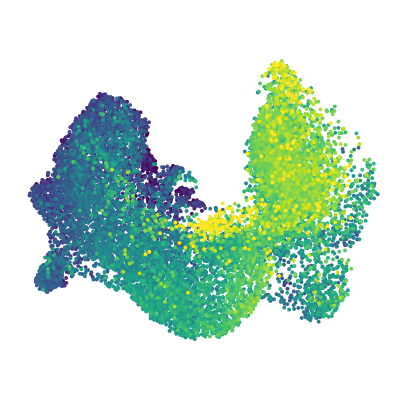

In [75]:
g = 'score_bailey_squamous'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_bailey_squamous.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

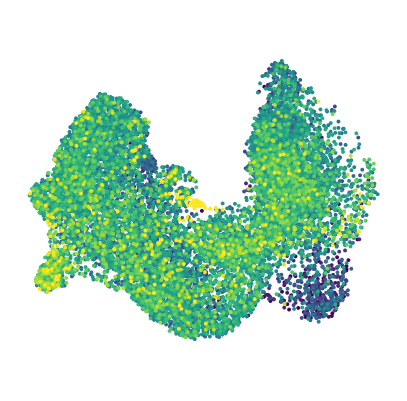

In [76]:
g = 'score_bailey_ADEX'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_bailey_ADEX.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

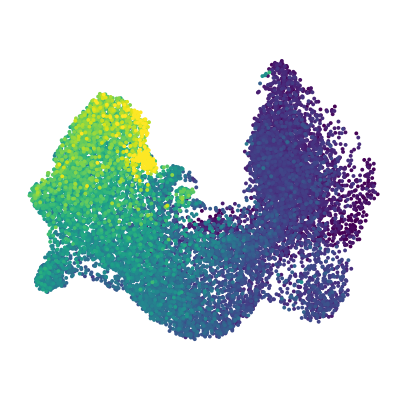

In [77]:
g = 'score_bailey_progenitor'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_bailey_progenitor.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

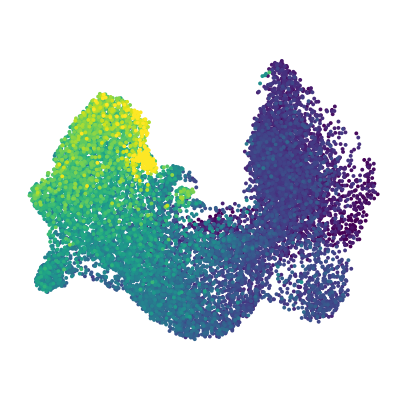

In [78]:
g = 'score_bailey_immunogenic'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_bailey_immunogenic.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Rhagavan et al. (Top 30 genes)

In [81]:
rhagavan = pd.read_table('%s/rhagavan.txt' % path_input, sep = '\t', header = 0, index_col = None)

In [83]:
genes_rhagavan_basal = [i.capitalize() for i in rhagavan['scBasal']]

In [85]:
genes_rhagavan_classical = [i.capitalize() for i in rhagavan['scClassical']]

In [86]:
genes_rhagavan_intermediate = [i.capitalize() for i in rhagavan['IC']]

In [88]:
sc.tl.score_genes(X_scaled, genes_rhagavan_basal, ctrl_size=len(genes_rhagavan_basal), score_name='score_rhagavan_basal')
sc.tl.score_genes(X_scaled, genes_rhagavan_classical, ctrl_size=len(genes_rhagavan_classical), score_name='score_rhagavan_classical')
sc.tl.score_genes(X_scaled, genes_rhagavan_intermediate, ctrl_size=len(genes_rhagavan_intermediate), score_name='score_rhagavan_intermediate')

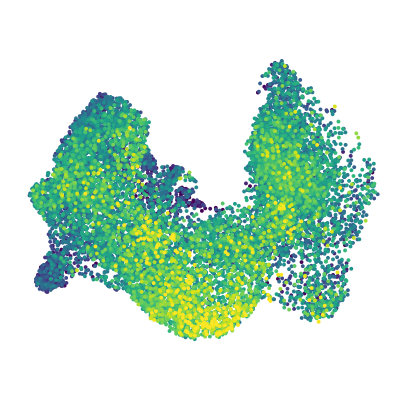

In [89]:
g = 'score_rhagavan_basal'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_rhagavan_basal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

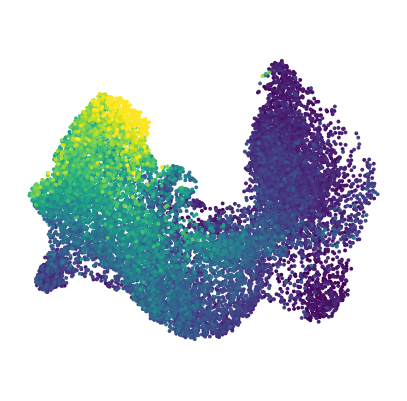

In [90]:
g = 'score_rhagavan_classical'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_rhagavan_classical.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

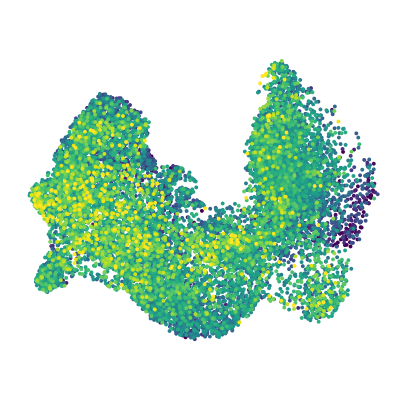

In [91]:
g = 'score_rhagavan_intermediate'
expr = X_scaled.obs[g][Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  cmap=plt.cm.viridis,
                  s = 15, show_axes=False, show_legend=False)
figname = 'UMAP_rhagavan_intermediate.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Signatures along pseudotime

In [28]:
def fit_vgam(adata, genes, var_pt, var_sf='size_factor', layer='raw', neg_log = False, steps=101, df=3):
    
    assert var_pt in adata.obs.columns, 'var_pt not in adata.obs'
    assert var_sf in adata.obs.columns, 'var_sf not in adata.obs'

    from rpy2 import robjects
    from rpy2.robjects import FloatVector
    from rpy2.robjects.packages import importr

    rbase = importr('base')
    rvgam = importr('VGAM', robject_translations = {"nvar.vlm": "nvar__vlm"})
    rstats = importr('stats')
    robjects.r['options'](warn=-1)
    
    fit = pd.DataFrame(index=genes, columns=np.linspace(0., np.max(adata.obs[var_pt]), steps).astype(str))
    stats = pd.DataFrame(index = genes, columns=['Chisq','Pr(>Chisq)'])
    
    pt = robjects.FloatVector(adata.obs[var_pt])
    sf = robjects.FloatVector(adata.obs[var_sf])
    X_pred = robjects.FloatVector(np.linspace(0, np.max(adata.obs[var_pt]), steps))
    
    
    for g in genes:
        try:
            Y = robjects.FloatVector(np.rint(np.array(adata[:,g].layers[layer].todense()).flatten()))

            DF = robjects.DataFrame({'Y':Y, 'X':pt, 'sf':sf})

            fmla_red = robjects.Formula("Y ~ 1")
            fit_red = rvgam.vglm(fmla_red, rvgam.negbinomial, data = DF, 
                                 na_action = robjects.r['na.fail'], smart = True)

            fmla_full = robjects.Formula("Y ~ sm.ns(X, df = %s)" % df)                         
            fit_full = rvgam.vglm(fmla_full, rvgam.negbinomial, data = DF, 
                                 na_action = robjects.r['na.fail'], smart = True)

            DF_pred = robjects.DataFrame({'X':X_pred})
            predicted = rvgam.predict(fit_full, newdata = DF_pred, type = 'response')
            fit.loc[g] = list(predicted.flatten())

            lr_stats_red = rvgam.lrtest(fit_full, fit_red)
            stats.loc[g]['Chisq','Pr(>Chisq)'] = [lr_stats_red.do_slot('Body').loc['2']['Chisq'],
                                                  lr_stats_red.do_slot('Body').loc['2']['Pr(>Chisq)']]
        except:
            continue
        
        
    stats['Pr(>Chisq)'] = rstats.p_adjust(FloatVector(stats['Pr(>Chisq)']), method = 'BH')
        
    if neg_log:
        stats['Pr(>Chisq)'] = -np.log10(stats['Pr(>Chisq)'].astype(float))
    
    return fit, stats

In [16]:
def draw_sigexpr_pseudotime(dpt, sigs, colors=['red','blue','green'], label=''):

    
    #initialize figure

    height = 5
    width = 20

    plt.figure(facecolor = 'w', figsize = (width, height))
    
    ax = plt.subplot(111)
    
    #define axes
    
    ax.set_xlim(np.min(dpt),np.max(dpt))
    ax.set_xticks([])
    ax.set_xlabel('Pseudotime', family = 'Arial', fontsize = 25)
    
    ax.set_ylabel(label, family = 'Arial', fontsize = 25)
    
    for i,s in enumerate(sigs):
        s = s.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)
        ax.plot(np.array(s.columns).astype(float), s.median(), color=colors[i], lw=5)
        ax.fill_between(np.array(s.columns).astype(float),
                        s.apply(lambda x: np.percentile(x, 25), axis=0),
                        s.apply(lambda x: np.percentile(x, 75), axis=0),
                        color=colors[i], alpha = 0.25)


In [17]:
def draw_sigexpr_pseudotime2(dpt, sigs, colors=['red','blue','green'], label=''):

    
    #initialize figure

    height = 5
    width = 20

    plt.figure(facecolor = 'w', figsize = (width, height))
    
    ax = plt.subplot(111)
    
    #define axes
    
    ax.set_xlim(np.min(dpt),np.max(dpt))
    ax.set_xticks([])
    ax.set_xlabel('Pseudotime', family = 'Arial', fontsize = 25)
    
    ax.set_ylabel(label, family = 'Arial', fontsize = 25)
    
    for i,s in enumerate(sigs):
        s = s.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)
        for g in s.index:
            ax.plot(np.array(s.columns).astype(float), s.loc[g], color=colors[i], lw=5)

In [18]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

In [19]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))[Xs.obs_names]

In [20]:
X.obs['dpt_pseudotime_pca'] = Xs.obs['dpt_pseudotime_pca']

Trying to set attribute `.obs` of view, copying.


In [21]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index
c_sel = np.random.choice(c_sel, 5000, replace=False)

# Luminal, Basal, Mesenchymal signatures along pseudotime

In [85]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))

## Exclude LGK-treated cells

In [86]:
c_sel = Xs.obs[Xs.obs['treatment']!='LGK-974'].index

In [87]:
len(c_sel)

14392

In [88]:
Xs = Xs[c_sel]

## Exclude 'other' cells

In [89]:
c_sel = Xs.obs[Xs.obs['cl_tumor_pca']!='Other'].index

In [90]:
len(c_sel)

13317

In [91]:
Xs = Xs[c_sel]

## Get signatures

In [92]:
dpt_pca = Xs.obs['dpt_pseudotime_pca']
stats_pca = Xs.uns['dpt_vgam_stats_pca']
fit_pca = Xs.uns['dpt_vgam_fit_pca'].astype(float)

In [93]:
dpt_leiden_pca = Xs.uns['dpt_vgam_clusters_pca']['leiden']

In [94]:
dpt_leiden_pca = groups_reorder(dpt_leiden_pca, ['1','3','0','2'])

In [95]:
dpt_bins = bin_axis(dpt_pca, 10, (0.0,1.01), range(10))[1]

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:24: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [96]:
cl_score = pd.DataFrame(index = return_unique(dpt_bins), columns = ['Basal cells', 'Luminal cells', 'Mesenchymal cells', 'Other'])

for b in return_unique(dpt_bins):
    c_tmp = dpt_bins[dpt_bins==b].index
    cnt_tmp = Counter(Xs.obs['cl_tumor_pca'][c_tmp])
    cl_score.loc[b,'Basal cells'] = cnt_tmp['Basal cells']
    cl_score.loc[b,'Luminal cells'] = cnt_tmp['Luminal cells']
    cl_score.loc[b,'Mesenchymal cells'] = cnt_tmp['Mesenchymal cells']

In [97]:
genes_luminal = dpt_leiden_pca[dpt_leiden_pca=='1'].index

In [98]:
len(genes_luminal)

1003

In [99]:
genes_basal = dpt_leiden_pca[dpt_leiden_pca=='3'].index

In [100]:
len(genes_basal)

654

In [101]:
genes_mes1 = dpt_leiden_pca[dpt_leiden_pca=='0'].index

In [102]:
len(genes_mes1)

1531

## Visualize

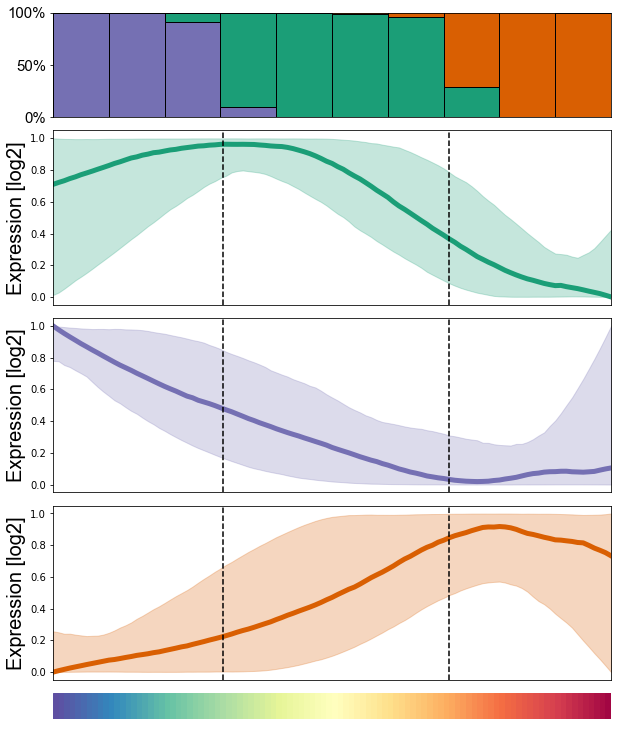

In [121]:
dat = fit_pca.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)
cc = cl_score.apply(lambda x: x / np.sum(x), axis = 1)
xmin, xmax = np.min(dat.columns.astype(float)), np.max(dat.columns.astype(float))
cmap_pop = cmap_cl_tumor

#initialize figure

height = 13
width = 10

fig = plt.figure(facecolor = 'w', figsize = (width, height))
gs1 = plt.GridSpec(5, 1, hspace=0.1, height_ratios=[3,5,5,5,0.75])

#plot basal signature

ax = plt.subplot(gs1[1])
ax.set_xlim(xmin, xmax)
ax.set_xticks([])
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
col_tmp = ['#1b9e77']

for i,g in enumerate([genes_basal]):
    s = dat.loc[g]
    ax.plot(np.array(s.columns).astype(float), s.median(), color=col_tmp[i], lw=5)
    ax.fill_between(np.array(s.columns).astype(float),
                        s.apply(lambda x: np.percentile(x, 5), axis=0),
                        s.apply(lambda x: np.percentile(x, 95), axis=0),
                        color=col_tmp[i], alpha = 0.25)
    
ax.axvline(0.3, color='k', linestyle='--')
ax.axvline(0.7, color='k', linestyle='--')

#plot luminal signatures

ax = plt.subplot(gs1[2])
ax.set_xlim(xmin, xmax)
ax.set_xticks([])
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
col_tmp = ['#7570b3']

for i,g in enumerate([genes_luminal]):
    s = dat.loc[g]
    ax.plot(np.array(s.columns).astype(float), s.median(), color=col_tmp[i], lw=5)
    ax.fill_between(np.array(s.columns).astype(float),
                        s.apply(lambda x: np.percentile(x, 5), axis=0),
                        s.apply(lambda x: np.percentile(x, 95), axis=0),
                        color=col_tmp[i], alpha = 0.25)
    
ax.axvline(0.3, color='k', linestyle='--')
ax.axvline(0.7, color='k', linestyle='--')

#plot mesenchymal signatures

ax = plt.subplot(gs1[3])
ax.set_xlim(xmin, xmax)
ax.set_xticks([])
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
col_tmp = ['#d95f02']

for i,g in enumerate([genes_mes1]):
    s = dat.loc[g]
    ax.plot(np.array(s.columns).astype(float), s.median(), color=col_tmp[i], lw=5)
    ax.fill_between(np.array(s.columns).astype(float),
                        s.apply(lambda x: np.percentile(x, 5), axis=0),
                        s.apply(lambda x: np.percentile(x, 95), axis=0),
                        color=col_tmp[i], alpha = 0.25)
    
ax.axvline(0.3, color='k', linestyle='--')
ax.axvline(0.7, color='k', linestyle='--')
#PTO colormap

ax = plt.subplot(gs1[4])
ax.set_xlim(0,1)
for pos in np.arange(0,1,0.01):
    ax.axvspan(pos, pos + 0.01, color = plt.cm.Spectral_r(pos))    
clean_axis(ax)

#population

ax4 = plt.subplot(gs1[0])

ax4.set_xlim(-0.5, len(set(bins))-0.5)
ax4.set_xticks([])
ax4.set_ylim(0,1)
ax4.set_yticks([0.0,0.5,1.0])
ax4.set_yticklabels(['0%','50%','100%'], family = 'Arial', fontsize = 15)

for pos, b in enumerate(range(10)):
    y0 = 0
    for gr in ['Luminal cells', 'Basal cells', 'Mesenchymal cells']:
        ax4.bar(x = pos, height = y0 + cc.loc[b,gr], bottom = y0, 
                color = cmap_pop[gr], width = 1, linewidth = 1, edgecolor = 'black')
        y0 += cc.loc[b,gr]
        
figname = 'dpt_overlapping_signatures.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Comparison of 2d and 3d cell lines and corresponding tumors

In [15]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [16]:
X.X = X.layers['norm_log2']

In [17]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

## Exclude treated cells

In [18]:
c_sel = Xs.obs[Xs.obs['treatment'].isin(['untreated','vehicle'])].index

In [19]:
len(c_sel)

57686

In [20]:
Xs = Xs[c_sel]

## Select non-training cells

In [21]:
c_sel = Xs.obs[Xs.obs['train_pca']==0].index

In [22]:
len(c_sel)

52728

In [23]:
Xs = Xs[c_sel]

In [24]:
Xs.obsm['X_umap_pca'][:,0] = Xs.obsm['X_umap_pca'][:,0] * -1

Trying to set attribute `.obsm` of view, copying.


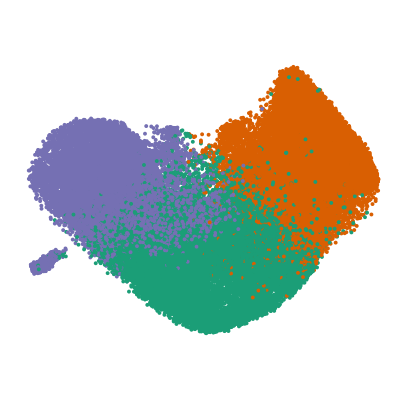

In [25]:
draw_scatter_groups(Xs.obsm['X_umap_pca'],
                    Xs.obs['pheno_class_pca'],
                    cmap={0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'},
                    s=15, show_axes = False, show_legend=False)

figname = 'umap_model_class.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Select equal numbers of cells from each tumor model

In [26]:
Counter(Xs.obs['tumor'])

Counter({'autochthonous': 9434,
         'NSG_sorted': 4099,
         'NSG_fragment': 8948,
         '3D_2%': 1577,
         '2D': 2653,
         '3D_Tuv': 1369,
         'NSG_TdTom-sorted': 5255,
         'NSG_unsorted': 4544,
         'NSG_3D': 3287,
         'F1_3D': 752,
         'NSG_2D': 3029,
         'F1_2D': 7052,
         'F1_unsorted': 243,
         'F1_fragment': 486})

In [27]:
tumor_rs = pd.Series('None', index = Xs.obs_names)

for t in set(Xs.obs['tumor']):
    c_tmp = Xs.obs[Xs.obs['tumor']==t].index
    if len(c_tmp) >= 1000:
        smple = np.random.choice(c_tmp, 1000, replace = False)
        tumor_rs[smple] = t

In [28]:
Counter(tumor_rs)

Counter({'None': 41728,
         'autochthonous': 1000,
         'NSG_sorted': 1000,
         'NSG_fragment': 1000,
         '3D_2%': 1000,
         '2D': 1000,
         '3D_Tuv': 1000,
         'NSG_TdTom-sorted': 1000,
         'NSG_unsorted': 1000,
         'NSG_3D': 1000,
         'NSG_2D': 1000,
         'F1_2D': 1000})

In [29]:
cmap_tumor['None'] = 'silver'

## Checkpoint

In [30]:
#save_to_pickle(tumor_rs, path_output, exp_id, 'tumor_rs')

In [31]:
tumor_rs = load_from_pickle(path_output, exp_id, 'tumor_rs')

## Projection on UMAP

In [32]:
gr_sel = ['autochthonous','2D','3D_2%','3D_Tuv','NSG_2D','NSG_3D','NSG_unsorted','NSG_TdTom-sorted','NSG_fragment']

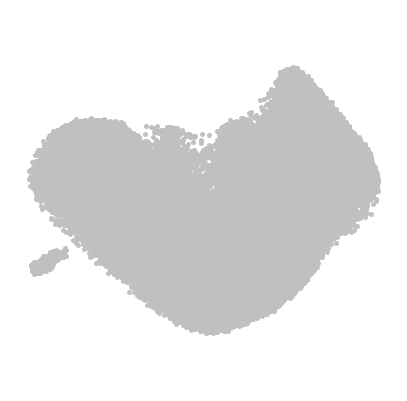

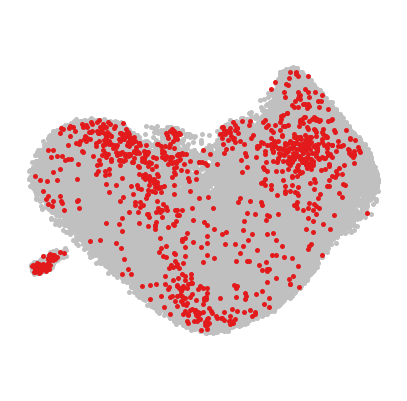

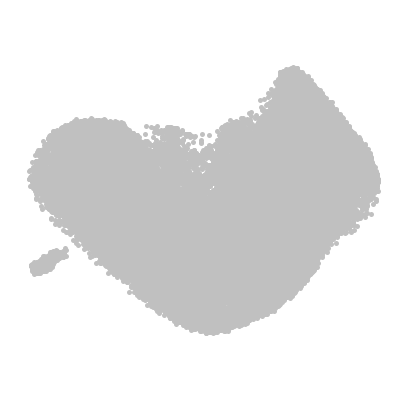

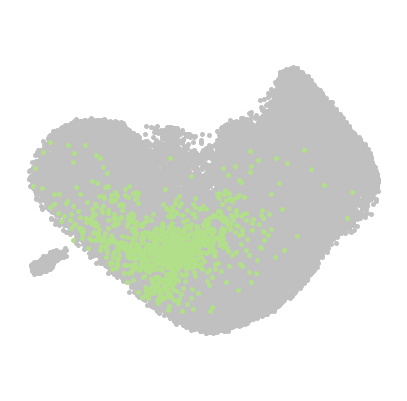

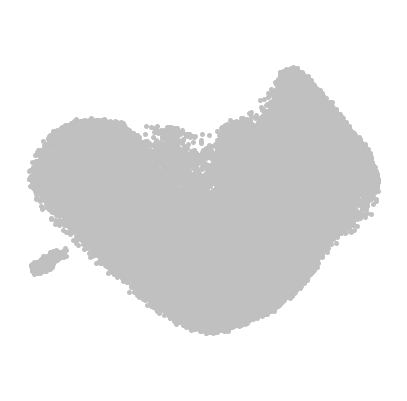

...

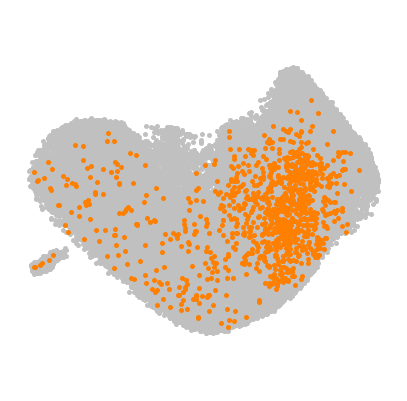

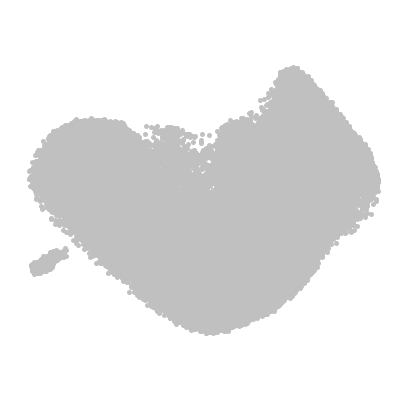

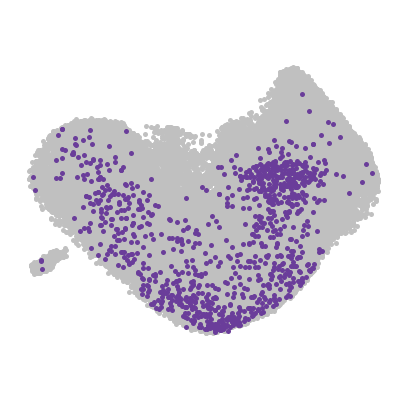

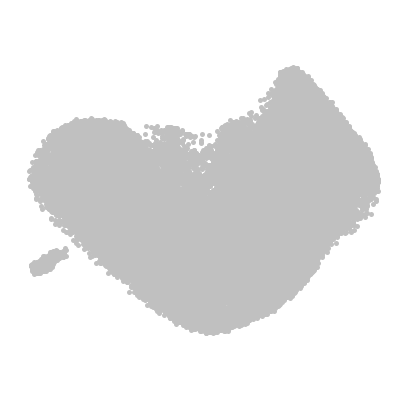

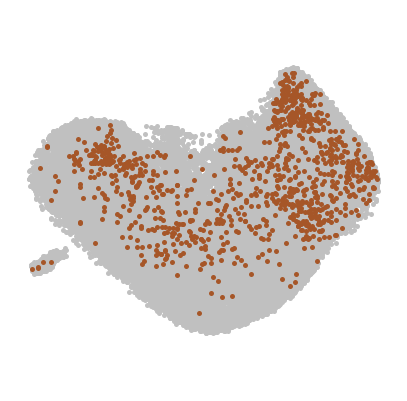

In [33]:
for gr in gr_sel:
    c_sel = Xs.obs[Xs.obs['tumor']==gr].index
    draw_scatter_groups_individual(Xs.obsm['X_umap_pca'], 
                                   tumor_rs==gr,
                                   cmap={True:cmap_tumor_sel[gr],False:'silver'},
                                   s=25, show_axes = False, show_legend=False)
    figname = 'umap_model_%s.pdf' % gr
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Projection on ternary plots (single cells)

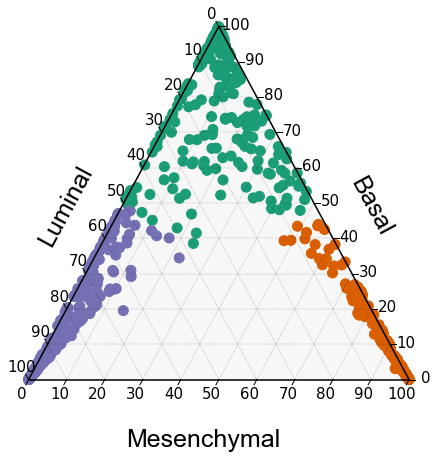

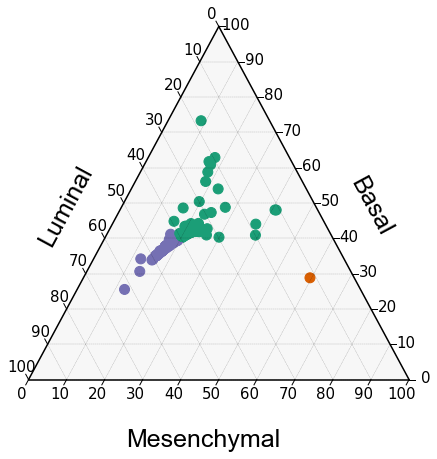

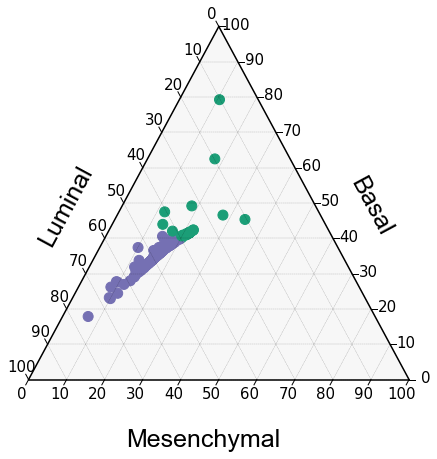

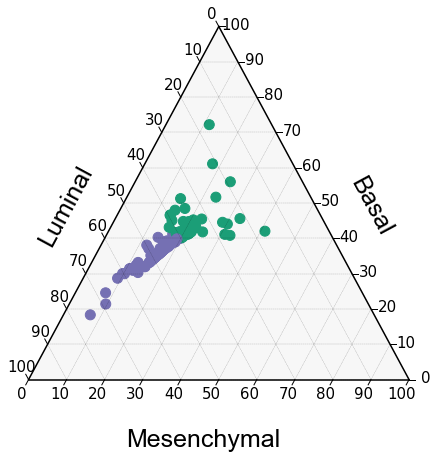

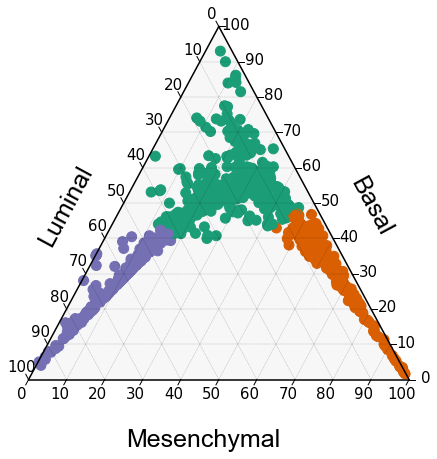

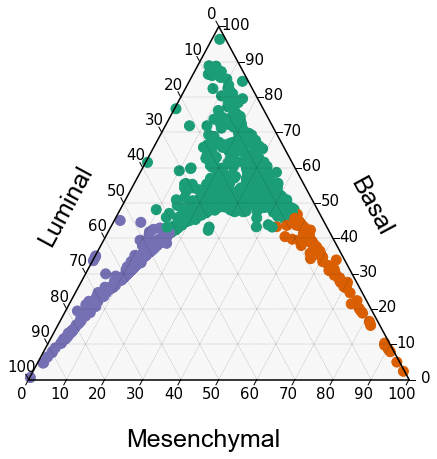

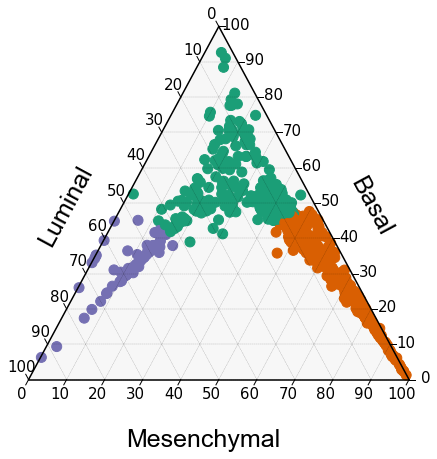

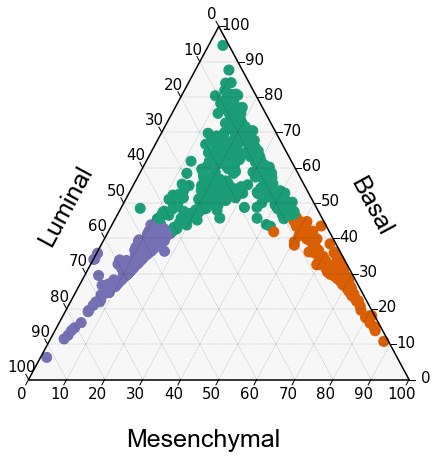

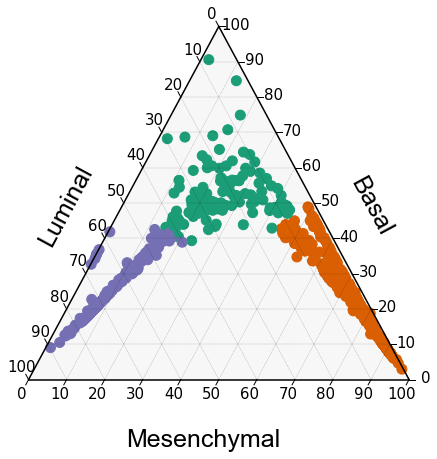

In [34]:
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = {0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'}
    clist = [cmap[i] for i in Xs[c_tmp].obs['pheno_class_pca']]

    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.15
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial', ha='center')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial', ha='center')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=offset, family='Arial', ha='center')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(dat, s=100, color = clist)
    
    figname = 'ternary_sc_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Marker gene expression

In [35]:
pdX = sc2pd(X, 'norm_log2')[tumor_rs.index]

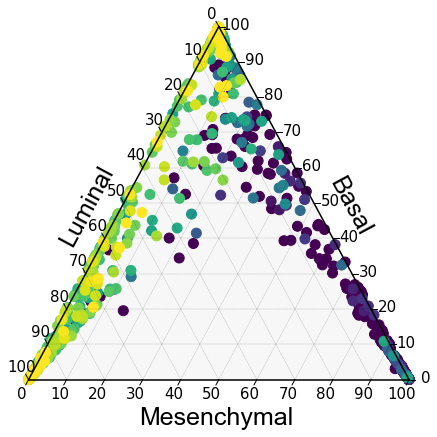

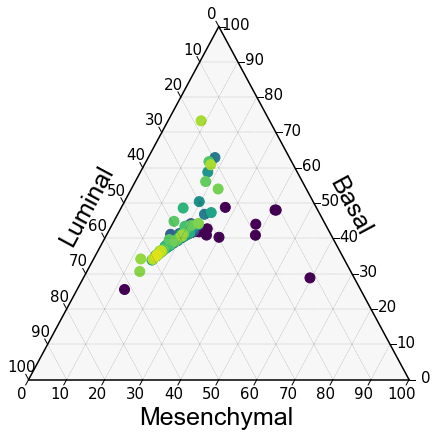

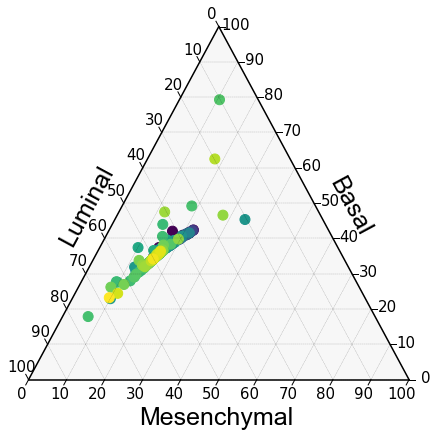

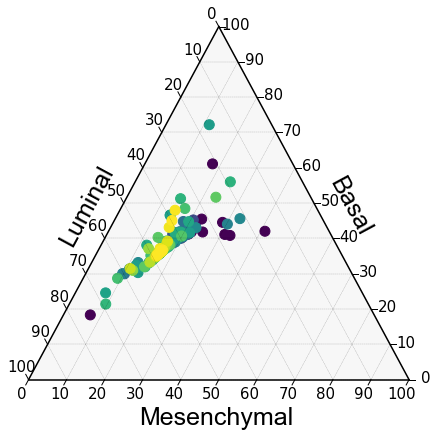

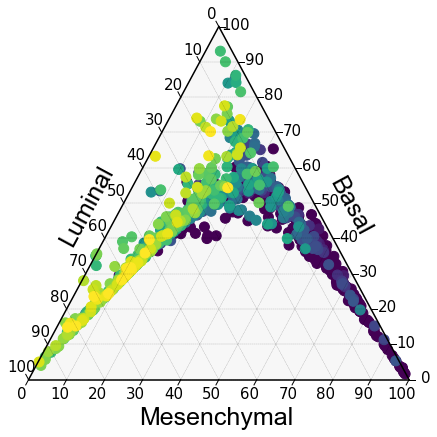

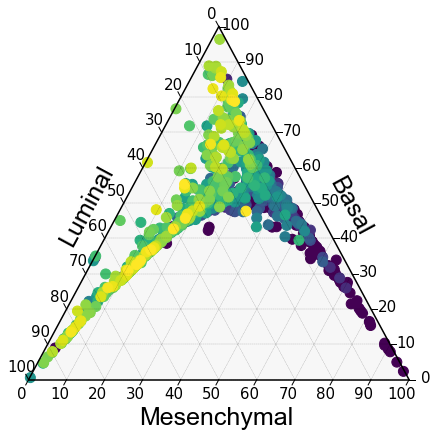

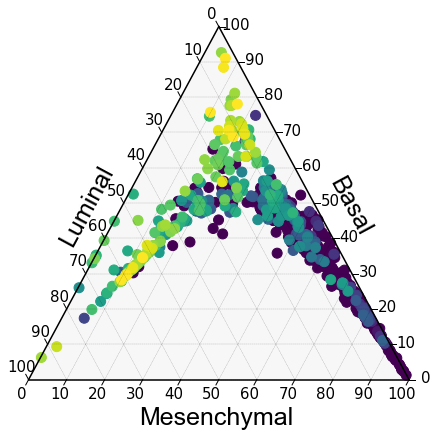

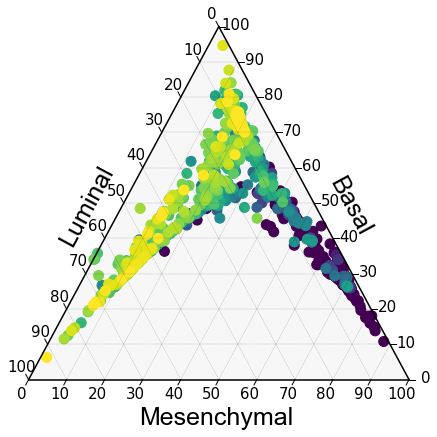

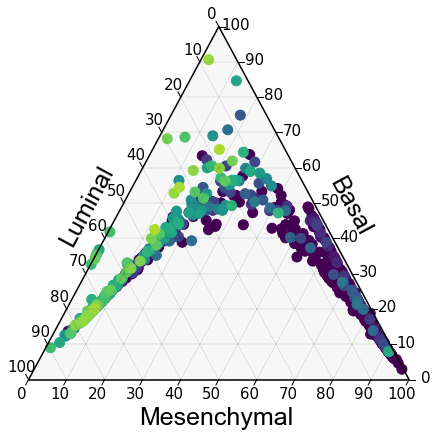

In [36]:
expr = pdX.loc['Epcam']
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)
    
    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Epcam_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

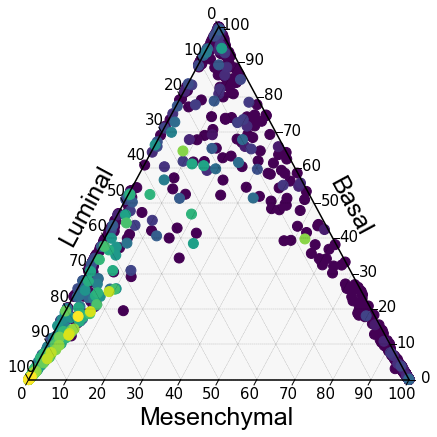

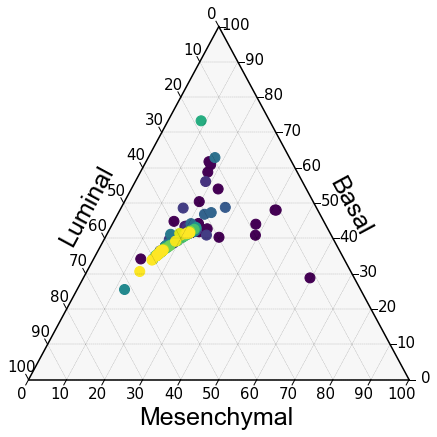

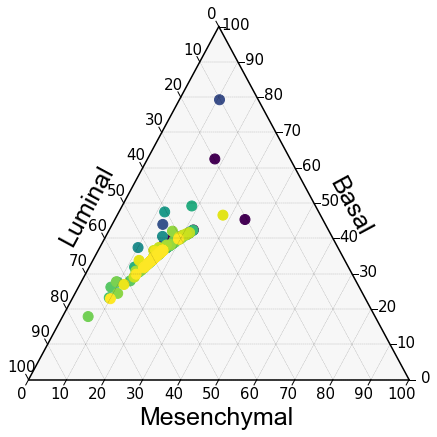

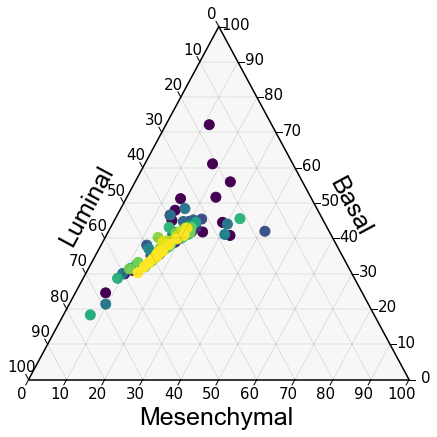

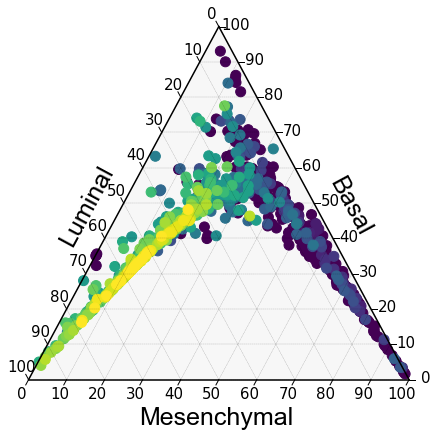

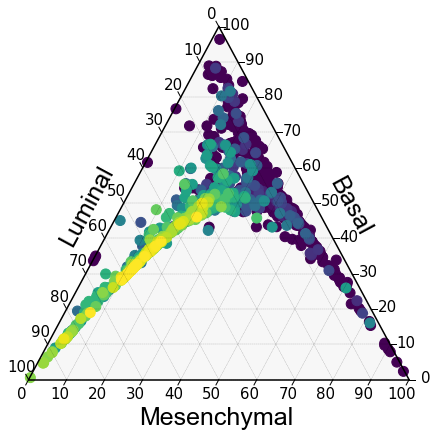

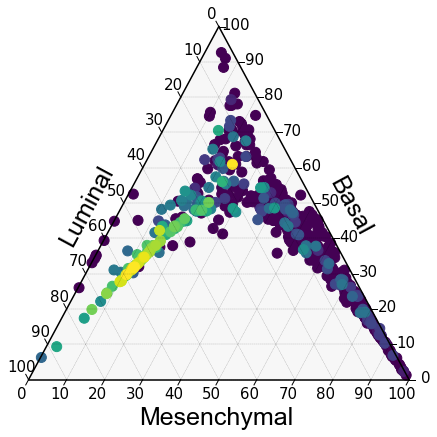

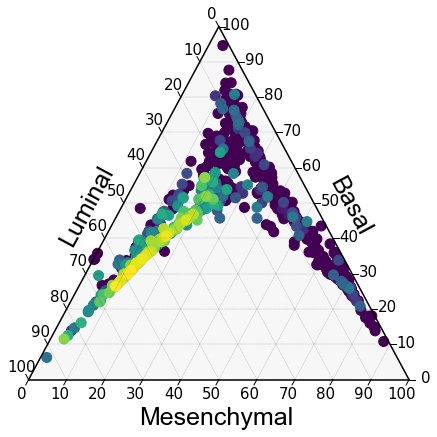

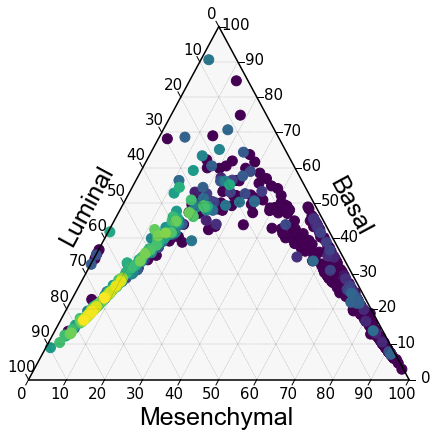

In [37]:
expr = pdX.loc['Lgals4', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Lgals4_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

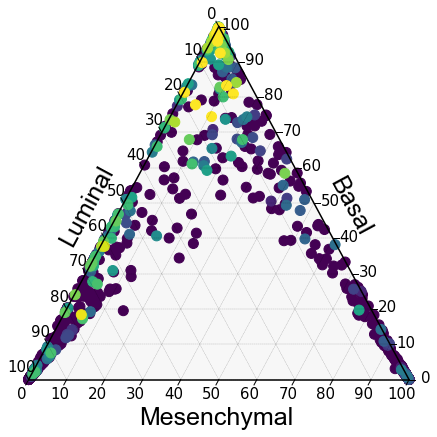

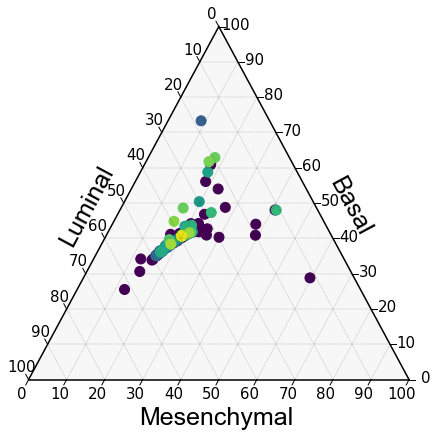

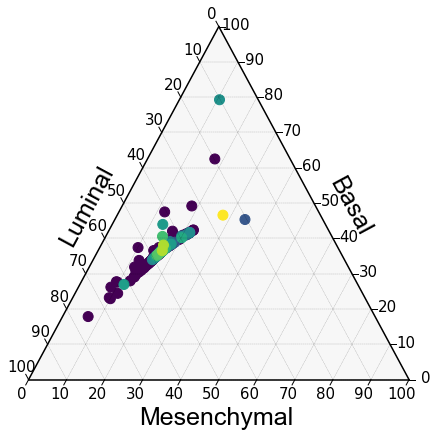

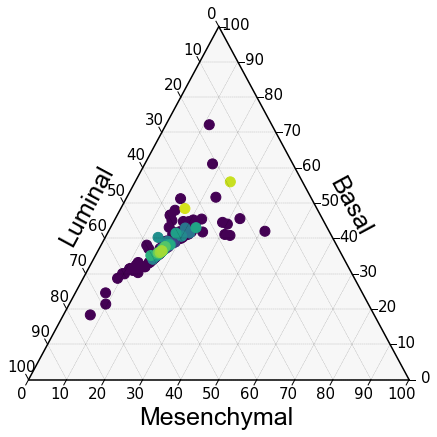

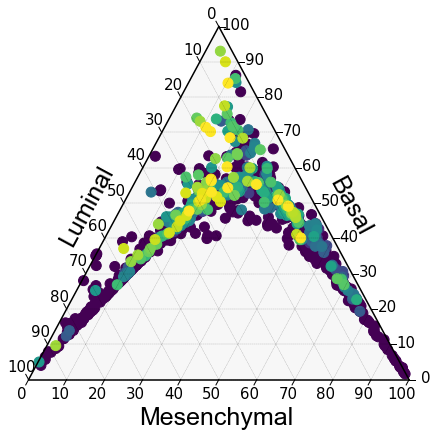

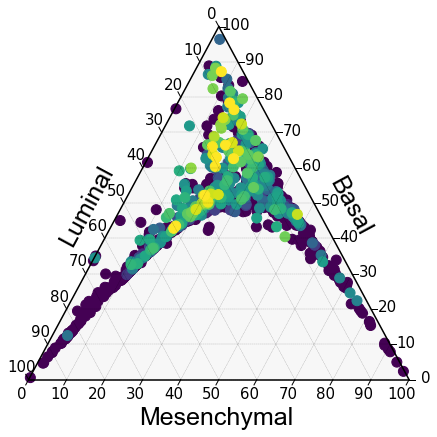

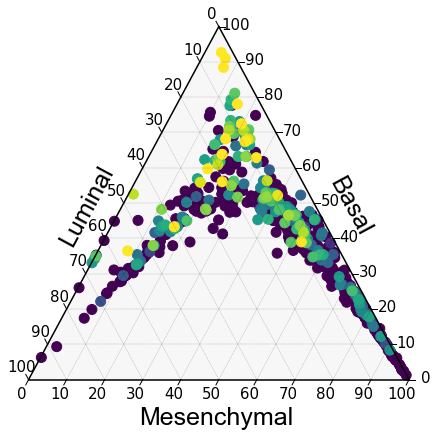

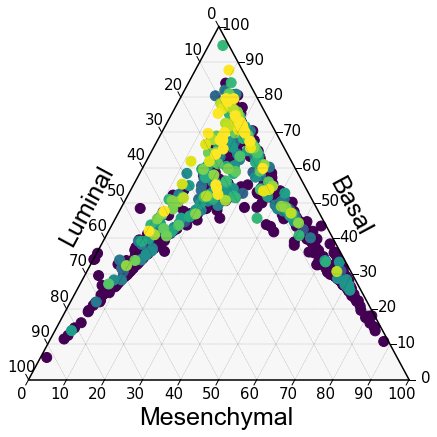

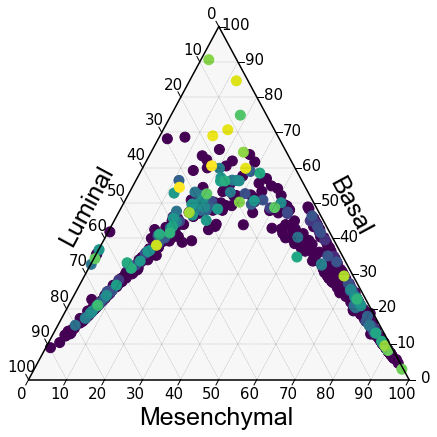

In [38]:
expr = pdX.loc['Cldn6', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Cldn6_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

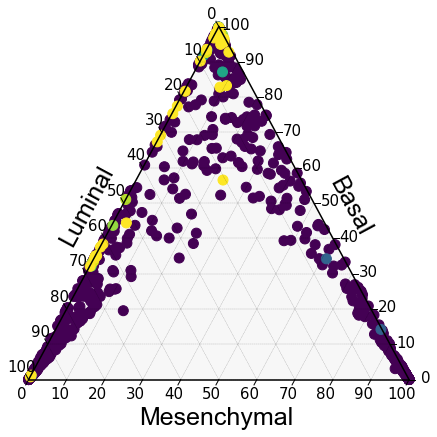

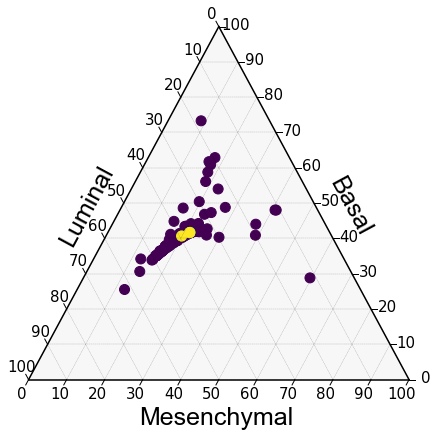

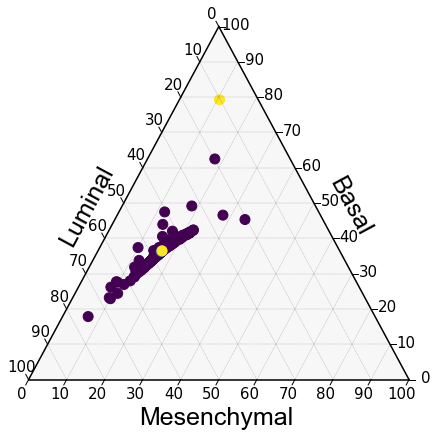

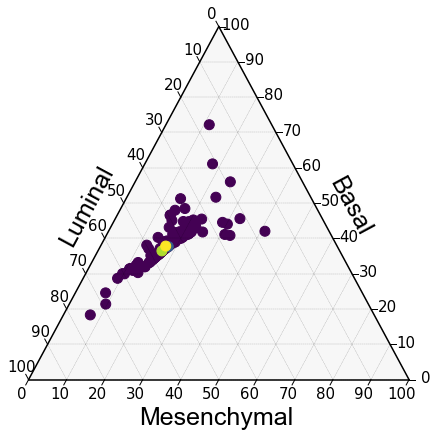

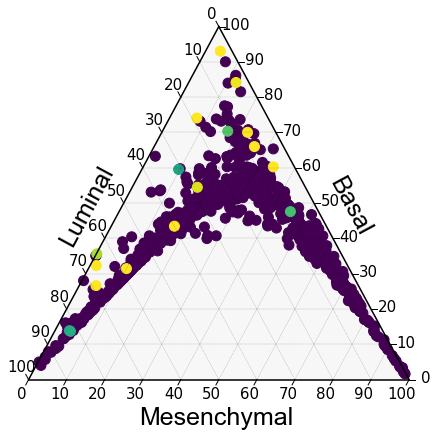

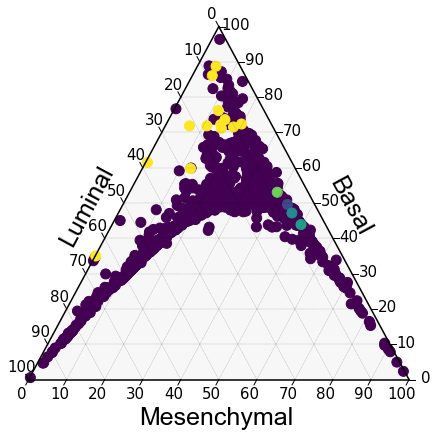

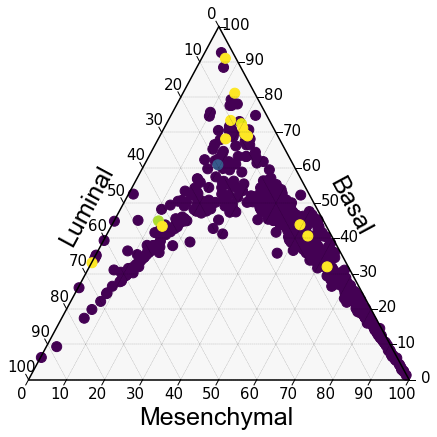

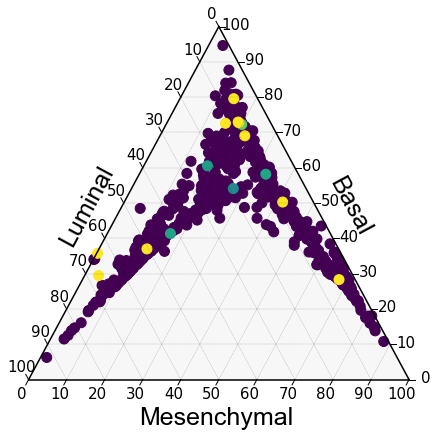

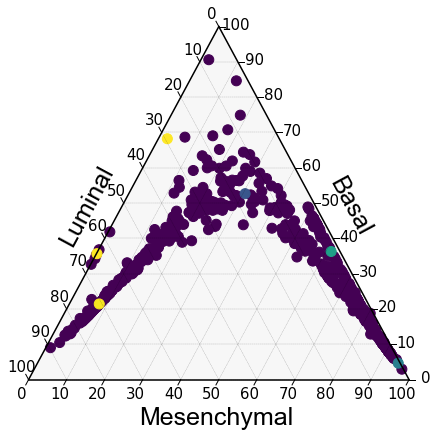

In [39]:
expr = pdX.loc['Krt17', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Krt17_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

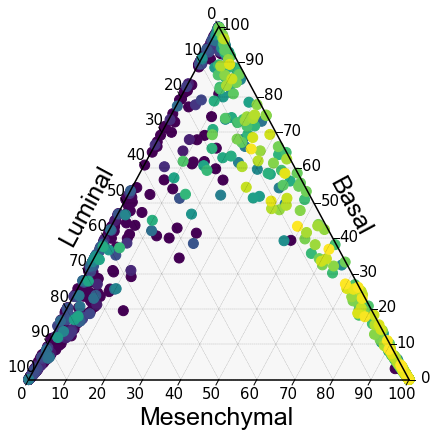

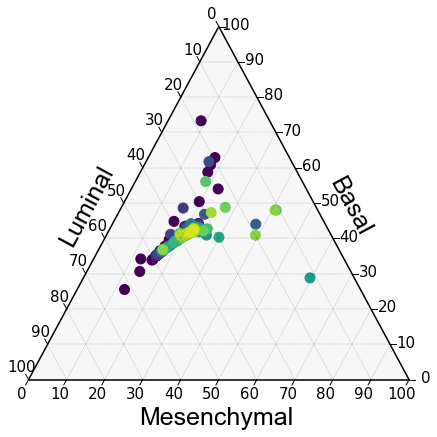

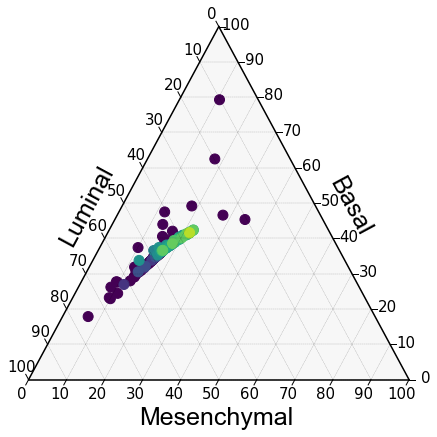

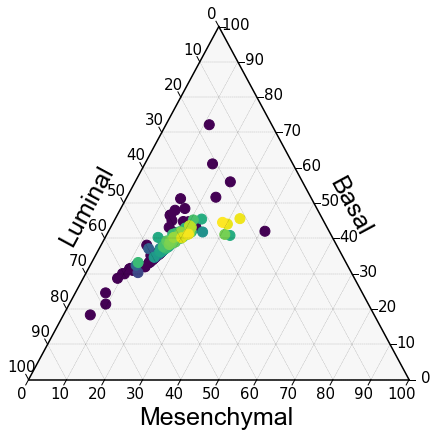

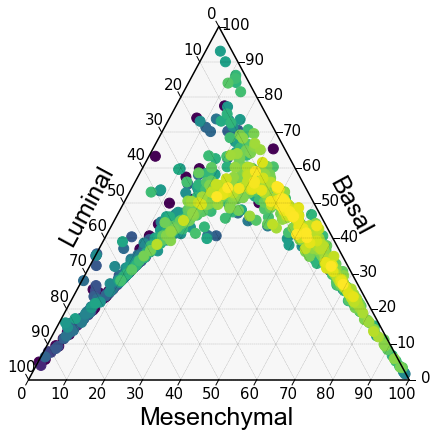

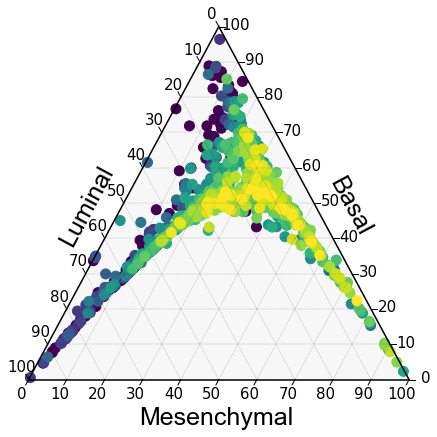

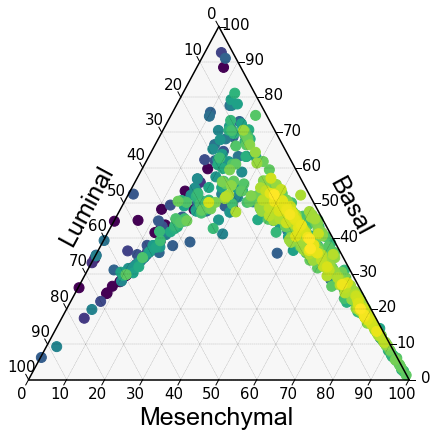

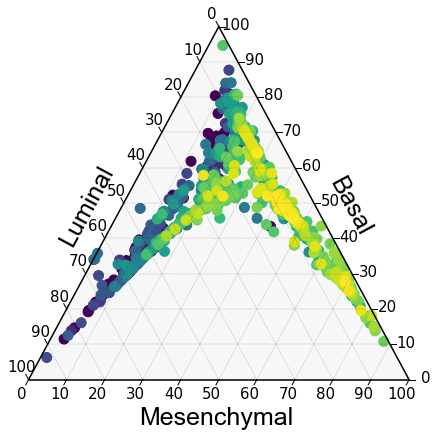

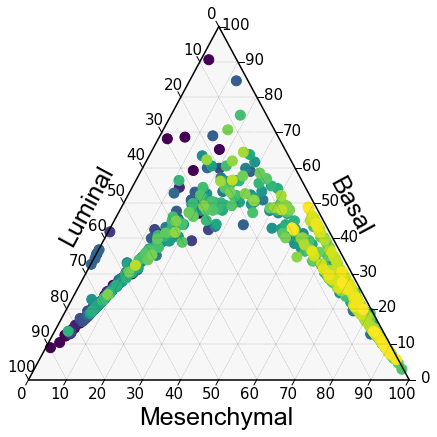

In [40]:
expr = pdX.loc['Vim', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Vim_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

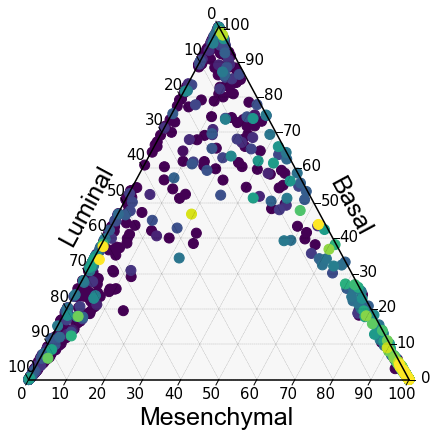

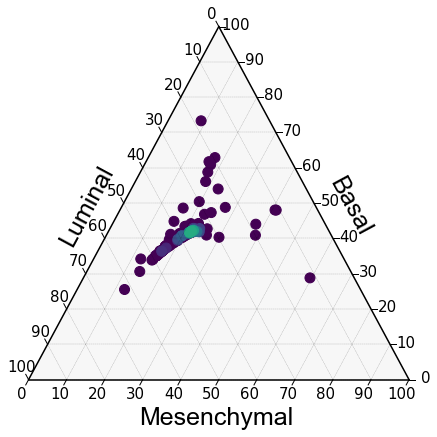

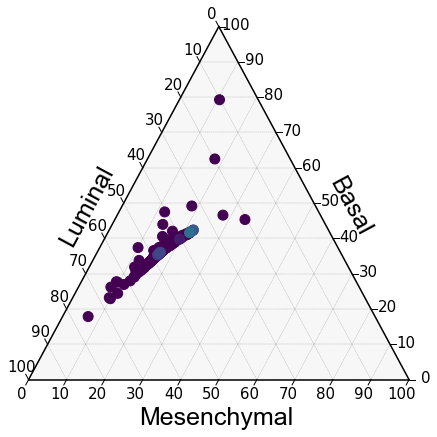

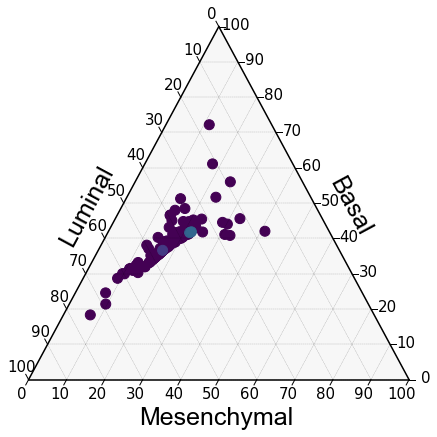

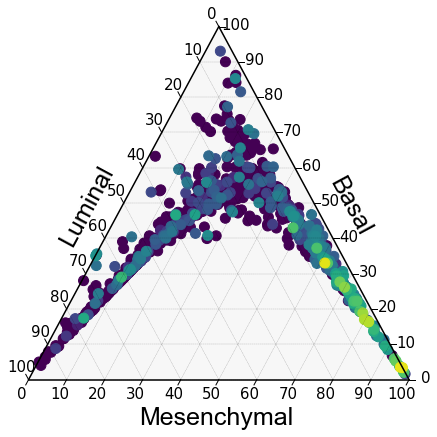

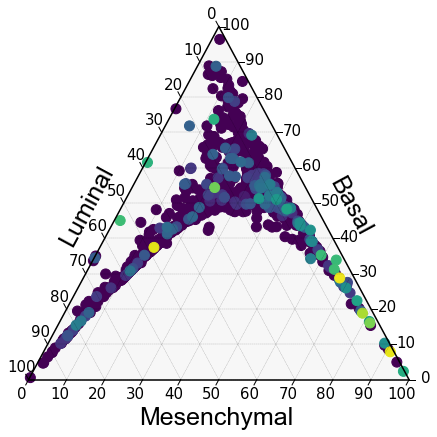

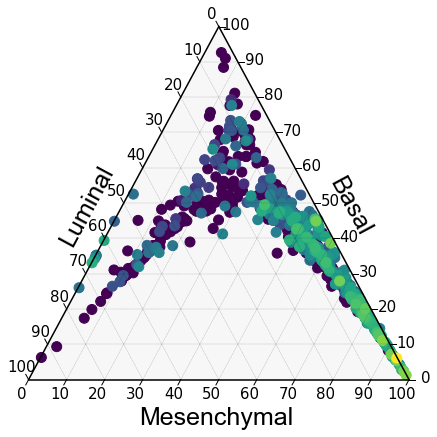

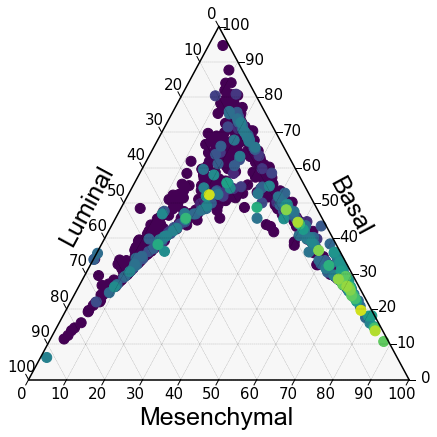

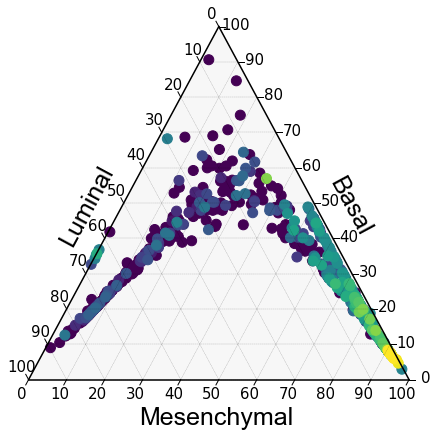

In [41]:
expr = pdX.loc['Sparc', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Sparc_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

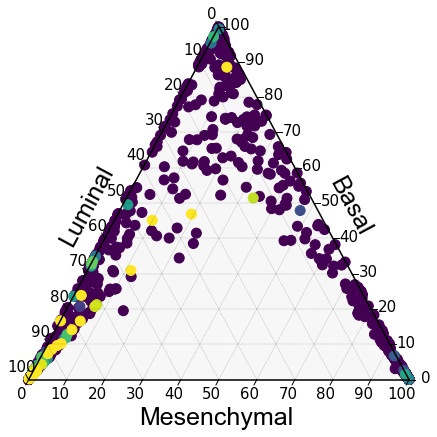

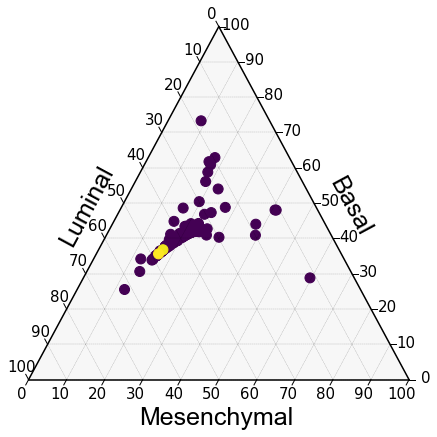

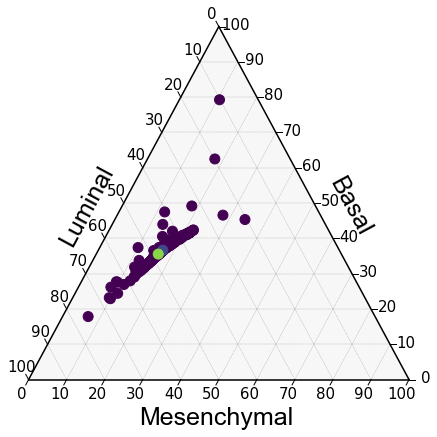

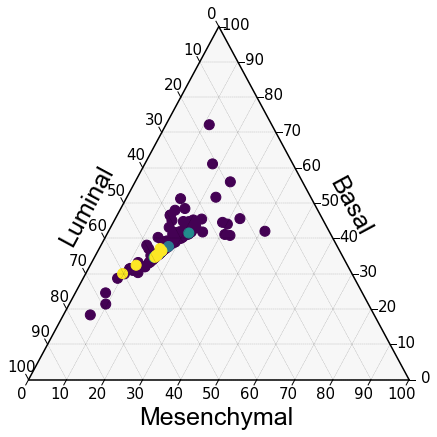

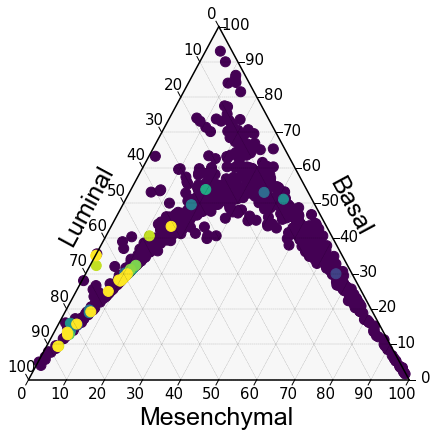

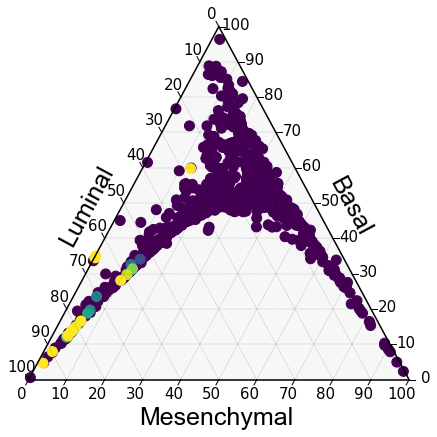

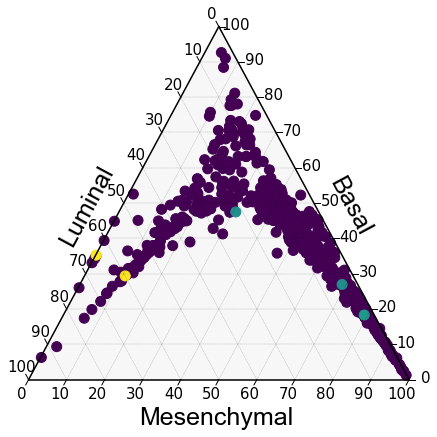

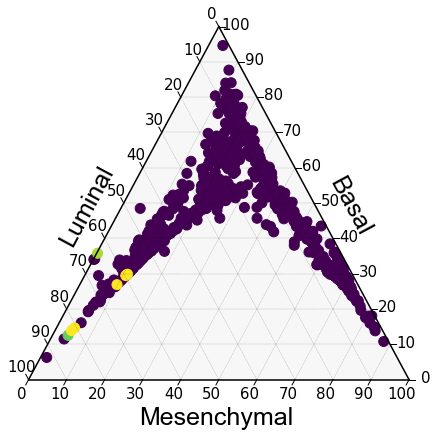

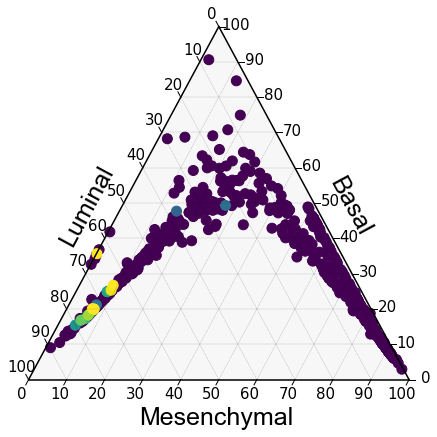

In [42]:
expr = pdX.loc['Muc6', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Muc6_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

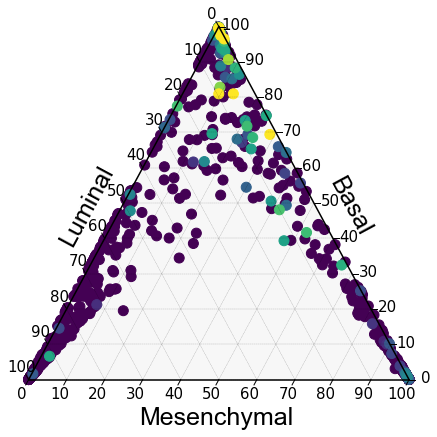

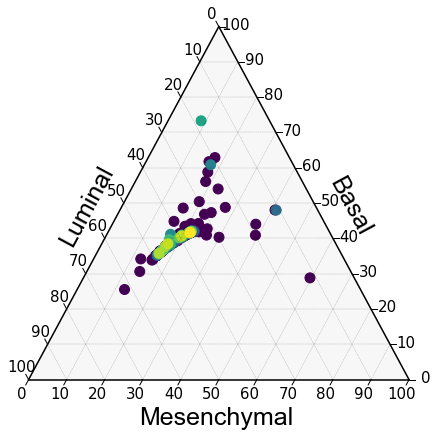

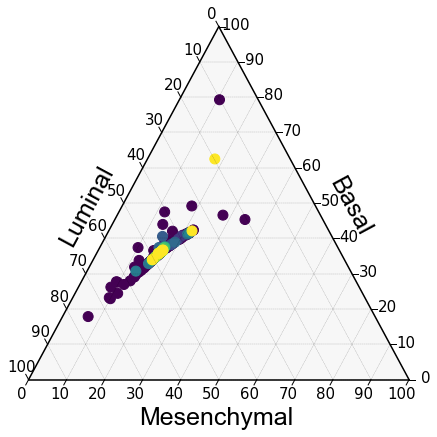

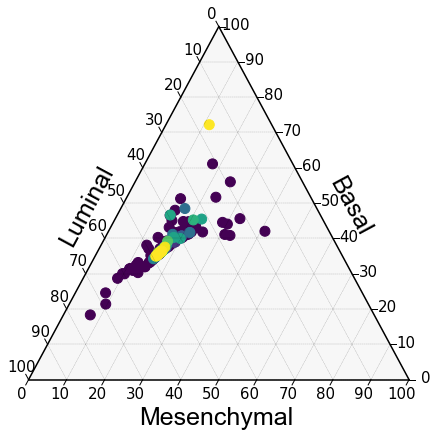

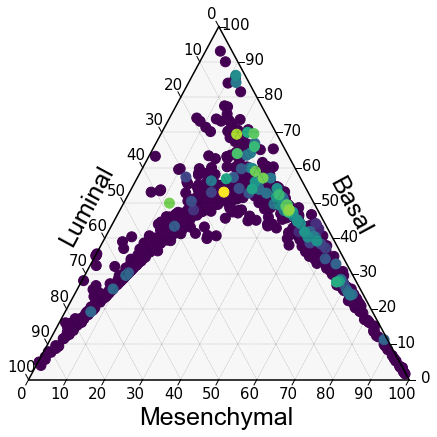

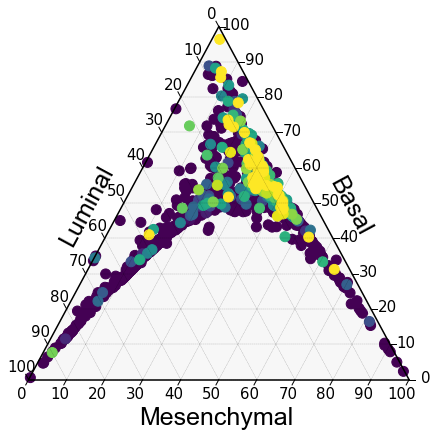

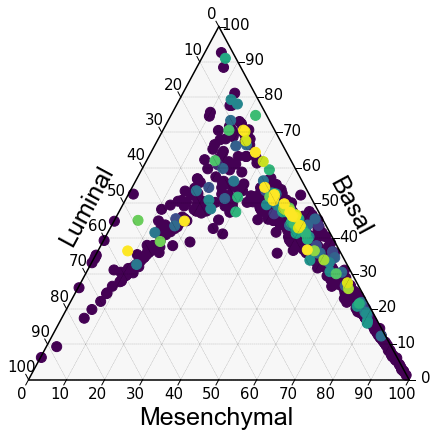

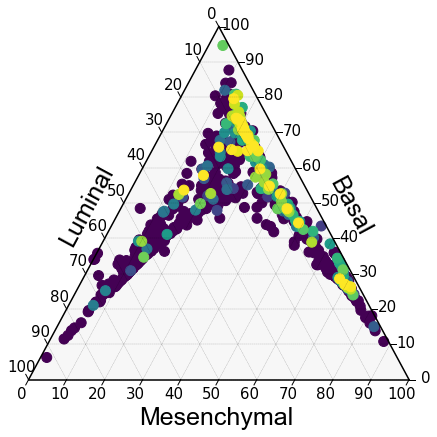

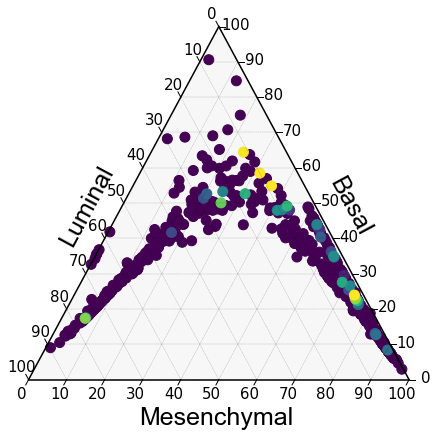

In [43]:
expr = pdX.loc['Csf2', tumor_rs.index]
vmin, vmax = np.percentile(expr, 1), np.percentile(expr, 99)
for i in gr_sel:
    c_tmp = tumor_rs[tumor_rs==i].index
    dat = list(zip(Xs[c_tmp].obs['pheno_prob2_pca']*100, 
                   Xs[c_tmp].obs['pheno_prob1_pca']*100,
                   Xs[c_tmp].obs['pheno_prob0_pca']*100))
    cmap = plt.cm.viridis
    clist = [cmap((e-vmin)/(vmax-vmin)) for e in expr[c_tmp]]
    ixz = expr[c_tmp].argsort()


    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    #tax.set_title(i, fontsize=fontsize, family='Arial')
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset, family='Arial')
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset, family='Arial')
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025, family='Arial')

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the default, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(np.array(dat)[ixz.values], s=100, color = np.array(clist)[ixz.values])
    
    figname = 'ternary_sc_Csf2_%s.pdf' % i
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Projection on ternary plots (tumors)

In [44]:
Xs.obs['mouse_pop'] = pd.Series(['%s_%s' % (Xs.obs['mouse'][i], Xs.obs['tumor'][i]) for i in Xs.obs_names],
                      index = Xs.obs_names)

In [45]:
mouse_pop_sel = [m for m in set(Xs.obs['mouse_pop']) if Counter(Xs.obs['mouse_pop'])[m]>=100]

In [46]:
len(mouse_pop_sel)

61

In [47]:
c_sel = Xs.obs['mouse_pop'][Xs.obs['mouse_pop'].isin(mouse_pop_sel)].index

In [48]:
Xs = Xs[c_sel]

In [49]:
gr_order_tumor = []

for gr in gr_sel:
    gr_order_tumor += list(set(Xs.obs['mouse_pop'][Xs.obs['tumor']==gr]))

In [50]:
comp_tumor = pd.DataFrame(index=gr_order_tumor, columns = [0,1,2])

for gr in comp_tumor.index:
    c_sel = Xs.obs['mouse_pop'][Xs.obs['mouse_pop']==gr].index
    l = len(c_sel)
    cnt_tmp = Counter(Xs.obs['pheno_class_pca'][c_sel])
    comp_tumor.loc[gr] = np.array([cnt_tmp[0], cnt_tmp[1], cnt_tmp[2]])/l

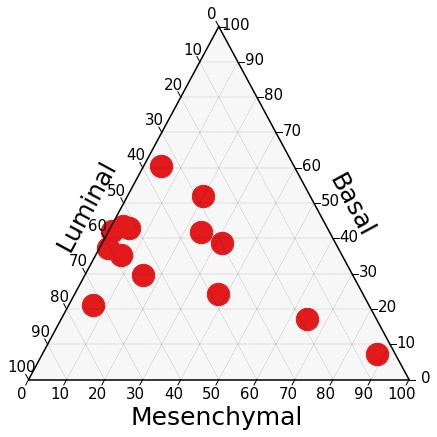

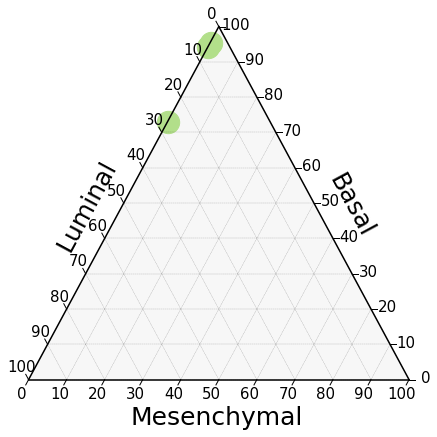

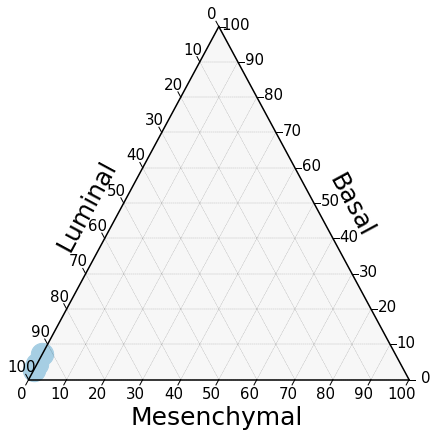

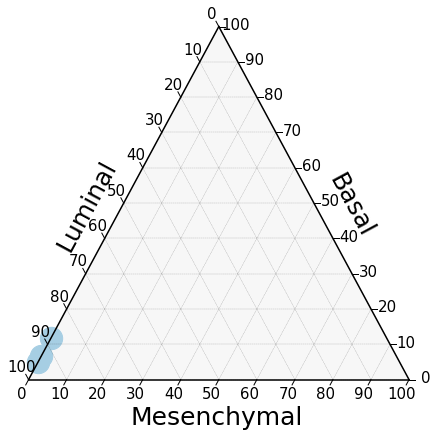

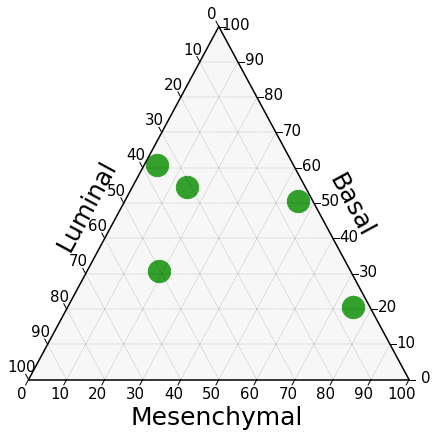

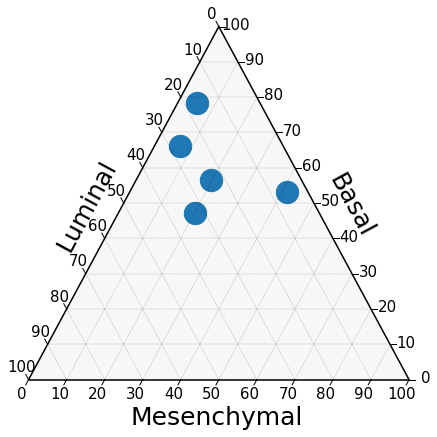

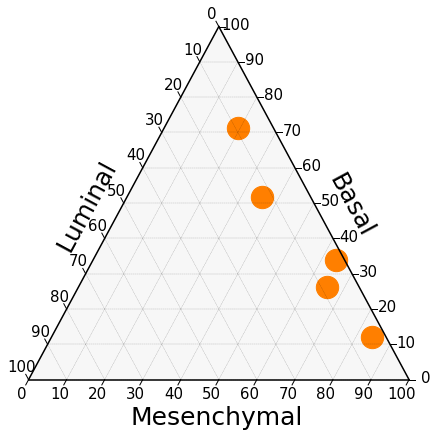

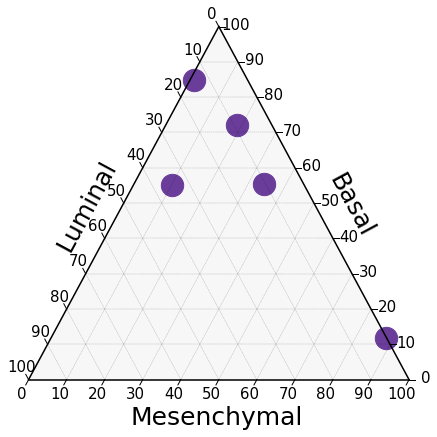

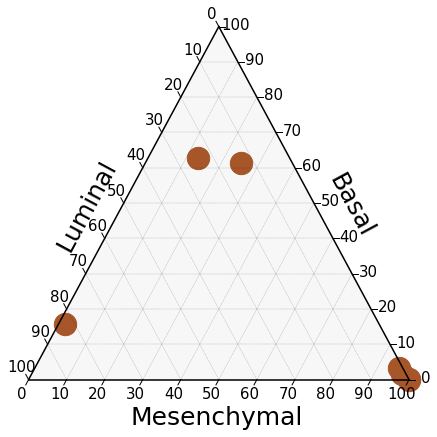

In [51]:
for gr in gr_sel:
    gr_tmp = list(set(Xs.obs['mouse_pop'][Xs.obs['tumor']==gr]))
    dat = list(zip(comp_tumor.loc[gr_tmp][2]*100, 
                   comp_tumor.loc[gr_tmp][1]*100,
                   comp_tumor.loc[gr_tmp][0]*100))

    ## Boundary and Gridlines
    scale = 100
    figure, tax = ternary.figure(scale=scale)
    figure.set_figheight(7.5)
    figure.set_figwidth(7.5)

    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1.5)
    tax.gridlines(color="black", multiple=10, linewidth=0.25)
    #tax.gridlines(color="black", multiple=5, linewidth=0.5)

    # Set Axis labels and Title
    fontsize = 25
    offset = 0.1
    tax.left_axis_label("Luminal", fontsize=fontsize, offset=offset)
    tax.right_axis_label("Basal", fontsize=fontsize, offset=offset)
    tax.bottom_axis_label("Mesenchymal", fontsize=fontsize, offset=0.025)

    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=10, offset=0.015, fontsize=15)

    # Background color
    tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #plot scatter

    tax.scatter(dat, s=500, color = cmap_tumor_sel[gr])
    
    figname = 'ternary_tumors_%s.pdf' % gr
    plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Phenotypic volume

In [39]:
def sample_phenotypic_volume(dat, grps, n_it, dview, sample=1000, replace=True):
    
    ####################
    
    def get_phenotypic_volume(dat):
    
        cov = np.cov(dat)
        eigval = np.linalg.eig(cov)[0]
        phenovolume = np.sum(np.log(eigval[~np.isclose(eigval,0)]))

        return phenovolume
    
    ####################
    
    out = pd.DataFrame(index=return_unique(grps), 
                       columns=range(n_it))
    
    for g in return_unique(grps):
        c_gr = grps[grps==g].index
        
        for i in range(n_it):
            c_it = np.random.choice(c_gr, size=sample, replace=replace)
        
            out.loc[g, i] = get_phenotypic_volume(dat[c_it])
        
    return out

In [40]:
pdX = sc2pd(Xs, 'norm_log2')

In [41]:
Xs.obs['mouse_pop'] = pd.Series(['%s_%s' % (Xs.obs['mouse'][i], Xs.obs['tumor'][i]) for i in Xs.obs_names],
                      index = Xs.obs_names)

In [42]:
mouse_pop_sel = [m for m in set(Xs.obs['mouse_pop']) if Counter(Xs.obs['mouse_pop'])[m]>=250]

In [43]:
len(mouse_pop_sel)

54

In [44]:
c_sel = Xs.obs['mouse_pop'][Xs.obs['mouse_pop'].isin(mouse_pop_sel)].index

In [45]:
Xs = Xs[c_sel]

In [70]:
pv_tumor_mouse = sample_phenotypic_volume(pdX, Xs.obs['mouse_pop'], 10, dview, sample=200, replace=False)

In [71]:
gr_sel = ['autochthonous','2D','3D_2%','3D_Tuv','NSG_2D','NSG_3D','NSG_unsorted','NSG_TdTom-sorted','NSG_fragment']

In [72]:
gr_order_tumor = []

for gr in gr_sel:
    gr_order_tumor += list(set(Xs.obs['mouse_pop'][Xs.obs['tumor']==gr]))

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


[Text(0, 0, 'GH2798_autochthonous'),
 Text(0, 0, 'AN1928_autochthonous'),
 Text(0, 0, 'AK1482_autochthonous'),
 Text(0, 0, 'GH2807_autochthonous'),
 Text(0, 0, 'AO1235_autochthonous'),
 Text(0, 0, 'XZ1386_autochthonous'),
 Text(0, 0, 'AN1185_autochthonous'),
 Text(0, 0, 'KW1710_autochthonous'),
 Text(0, 0, 'AO1213_autochthonous'),
 Text(0, 0, 'AN1187_autochthonous'),
 Text(0, 0, 'Ak1483_2D'),
 Text(0, 0, 'AJ1511_2D'),
 Text(0, 0, 'AK1482_2D'),
 Text(0, 0, 'Ak1483_3D_2%'),
 Text(0, 0, 'AJ1511_3D_2%'),
 Text(0, 0, 'AK1482_3D_2%'),
 Text(0, 0, 'Ak1483_3D_Tuv'),
 Text(0, 0, 'AK1482_3D_Tuv'),
 Text(0, 0, 'AK1754_NSG_2D'),
 Text(0, 0, 'AK1698_NSG_2D'),
 Text(0, 0, 'AK1755_NSG_2D'),
 Text(0, 0, 'AK1694_NSG_2D'),
 Text(0, 0, 'AK1697_NSG_2D'),
 Text(0, 0, 'JC1137_NSG_3D'),
 Text(0, 0, 'JC1140_NSG_3D'),
 Text(0, 0, 'JC1132_NSG_3D'),
 Text(0, 0, 'JC1139_NSG_3D'),
 Text(0, 0, 'AJ1394_NSG_unsorted'),
 Text(0, 0, 'AJ1398_NSG_unsorted'),
 Text(0, 0, 'AJ1395_NSG_unsorted'),
 Text(0, 0, 'AJ1390_NSG_uns

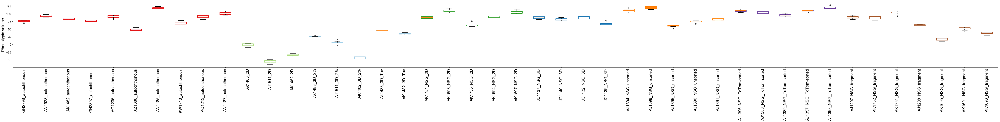

In [73]:
dat = pv_tumor_mouse
gr_order = gr_order_tumor
clist = [cmap_tumor_sel['_'.join(i.split('_')[1:])] for i in gr_order]

L = len(gr_order)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

ax.set_ylabel('Phenotypic volume', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data
    
box = ax.boxplot(x=[dat.loc[i] for i in gr_order], positions = range(L))

for p,b in enumerate(box['boxes']):
            b.set_c(clist[p])
            b.set_lw(3)

ax.set_xticklabels(gr_order, family = 'Arial', fontsize = 20, rotation = 'vertical', )

In [74]:
dat_tumor_mouse = pd.DataFrame(columns = ['vals','mean','std','pval','pval_symbol'],
                                        index = ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment'])

ref = 'autochthonous'

for gr in dat_tumor_mouse.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = pv_tumor_mouse.loc[m_tmp].mean(axis=1)
    dat_tumor_mouse.loc[gr,'vals'] = dat_tmp.values
    dat_tumor_mouse.loc[gr,'mean'] = dat_tmp.mean()
    dat_tumor_mouse.loc[gr,'std'] = dat_tmp.std()
    if gr == ref:
        dat_tumor_mouse.loc[gr,'pval'] = 'ref'
        dat_tumor_mouse.loc[gr,'pval_symbol'] = 'ref'
    else:
        symbol_tmp = 'n.s.'
        pval_tmp = scipy.stats.ttest_ind(dat_tumor_mouse.loc[ref,'vals'], dat_tumor_mouse.loc[gr,'vals'])[1]
        dat_tumor_mouse.loc[gr,'pval'] = pval_tmp
        if pval_tmp < 0.05: symbol_tmp = '*'
        if pval_tmp < 0.01: symbol_tmp = '**'
        if pval_tmp < 0.005: symbol_tmp = '***'
        dat_tumor_mouse.loc[gr,'pval_symbol'] = symbol_tmp

In [88]:
ndict = {'autochthonous':'autochthonous',
         'NSG_unsorted':'transplant: unsorted',
         'NSG_TdTom-sorted':'transplant: TdTom-sorted',
         'NSG_2D':'transplant: 2D',
         'NSG_3D':'transplant: 3D',
         'NSG_fragment':'transplant: fragment',
         '2D':'culture: 2D','3D_Tuv':'culture: 3D'}

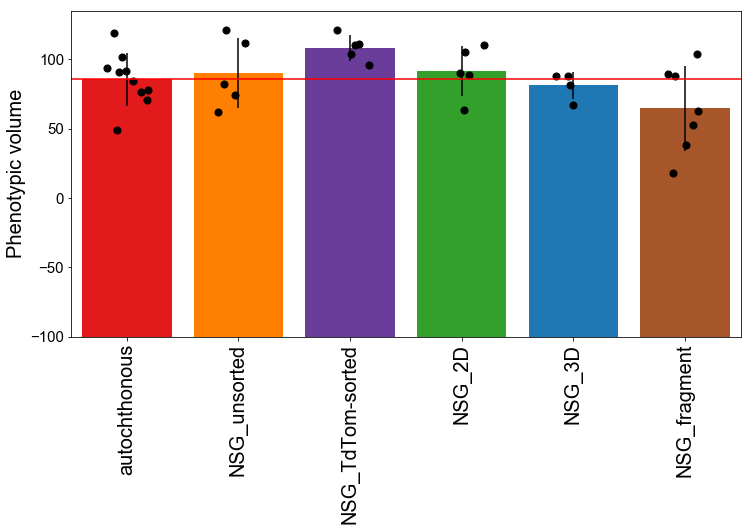

In [76]:
dat = dat_tumor_mouse.loc[['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']]

L = len(dat.index)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Phenotypic volume', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

for i, gr in enumerate(dat.index):
    ax.bar(i, 
           height=dat['mean'].loc[gr]+100, 
           bottom=-100, 
           color = cmap_tumor_sel[gr],  
           yerr = dat['std'].loc[gr])
    
for i, gr in enumerate(dat.index):
    
    ax.scatter(i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               dat['vals'].loc[gr],
               c = 'k',
               s = 50,
               zorder = 2)

ax.set_xticklabels(dat.index, family = 'Arial', fontsize = 20, rotation = 'vertical')
ax.axhline(dat['mean'].loc['autochthonous'], color='r')

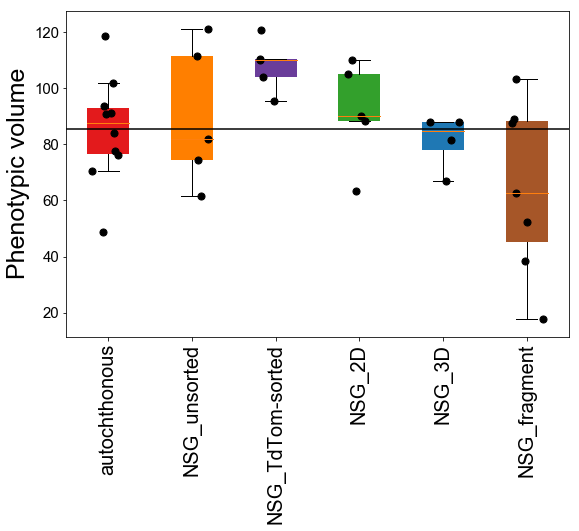

In [77]:
dat = dat_tumor_mouse.loc[['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 6
width = 1.5 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Phenotypic volume', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index)), 
                 vert=True, notch=False, patch_artist=True, showfliers=False, zorder = 1)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index):
    
    ax.scatter(i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               dat['vals'].loc[gr],
               c = 'k',
               s = 50,
               zorder = 1)

ax.set_xticklabels(dat.index, family = 'Arial', fontsize = 20, rotation = 'vertical')
ax.axhline(dat['mean'].loc['autochthonous'], color='k')

    
figname = 'pv_models.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

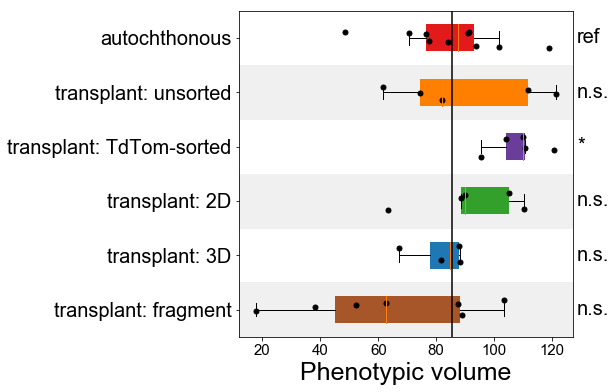

In [86]:
dat = dat_tumor_mouse.loc[['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 6
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Phenotypic volume', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)

#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.01, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
ax.axvline(dat['mean'].loc['autochthonous'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'pv_models.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [79]:
dat_tumor_mouse_2D = pd.DataFrame(columns = ['vals','mean','std','pval','pval_symbol'],
                                        index = ['2D','NSG_2D'])

ref = '2D'

for gr in dat_tumor_mouse_2D.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = pv_tumor_mouse.loc[m_tmp].mean(axis=1)
    dat_tumor_mouse_2D.loc[gr,'vals'] = dat_tmp.values
    dat_tumor_mouse_2D.loc[gr,'mean'] = dat_tmp.mean()
    dat_tumor_mouse_2D.loc[gr,'std'] = dat_tmp.std()
    if gr == ref:
        dat_tumor_mouse_2D.loc[gr,'pval'] = 'ref'
        dat_tumor_mouse_2D.loc[gr,'pval_symbol'] = 'ref'
    else:
        symbol_tmp = 'n.s.'
        pval_tmp = scipy.stats.ttest_ind(dat_tumor_mouse_2D.loc[ref,'vals'], dat_tumor_mouse_2D.loc[gr,'vals'])[1]
        dat_tumor_mouse_2D.loc[gr,'pval'] = pval_tmp
        if pval_tmp < 0.05: symbol_tmp = '*'
        if pval_tmp < 0.01: symbol_tmp = '**'
        if pval_tmp < 0.005: symbol_tmp = '***'
        dat_tumor_mouse_2D.loc[gr,'pval_symbol'] = symbol_tmp

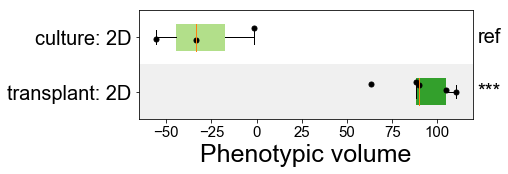

In [89]:
dat = dat_tumor_mouse_2D.loc[['2D','NSG_2D']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 2
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Phenotypic volume', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1, widths=0.5)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)
    
#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
#ax.axvline(dat['mean'].loc['2D'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'pv_models_2D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [90]:
dat_tumor_mouse_3D = pd.DataFrame(columns = ['vals','mean','std','pval','pval_symbol'],
                                        index = ['3D_Tuv','NSG_3D'])

ref = '3D_Tuv'

for gr in dat_tumor_mouse_3D.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = pv_tumor_mouse.loc[m_tmp].mean(axis=1)
    dat_tumor_mouse_3D.loc[gr,'vals'] = dat_tmp.values
    dat_tumor_mouse_3D.loc[gr,'mean'] = dat_tmp.mean()
    dat_tumor_mouse_3D.loc[gr,'std'] = dat_tmp.std()
    if gr == ref:
        dat_tumor_mouse_3D.loc[gr,'pval'] = 'ref'
        dat_tumor_mouse_3D.loc[gr,'pval_symbol'] = 'ref'
    else:
        symbol_tmp = 'n.s.'
        pval_tmp = scipy.stats.ttest_ind(dat_tumor_mouse_3D.loc[ref,'vals'], dat_tumor_mouse_3D.loc[gr,'vals'])[1]
        dat_tumor_mouse_3D.loc[gr,'pval'] = pval_tmp
        if pval_tmp < 0.05: symbol_tmp = '*'
        if pval_tmp < 0.01: symbol_tmp = '**'
        if pval_tmp < 0.005: symbol_tmp = '***'
        dat_tumor_mouse_3D.loc[gr,'pval_symbol'] = symbol_tmp

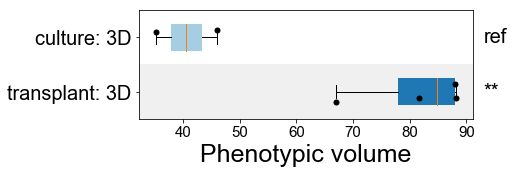

In [91]:
dat = dat_tumor_mouse_3D.loc[['3D_Tuv','NSG_3D']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 2
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Phenotypic volume', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1, widths=0.5)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)
    
#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
#ax.axvline(dat['mean'].loc['2D'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'pv_models_3D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [92]:
dat_tumor_mouse_2D3D = pd.concat([dat_tumor_mouse_2D, dat_tumor_mouse_3D])

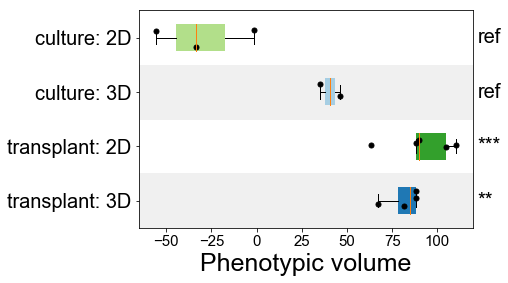

In [93]:
dat = dat_tumor_mouse_2D3D.loc[['2D','3D_Tuv','NSG_2D','NSG_3D']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 4
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Phenotypic volume', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1, widths=0.5)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)
    
#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
#ax.axvline(dat['mean'].loc['2D'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'pv_models_2D3D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Checkpoint

In [94]:
#save_to_pickle(pv_tumor_mouse, path_output, exp_id, 'pv_tumor_mouse')

In [95]:
pv_tumor_mouse = load_from_pickle(path_output, exp_id, 'pv_tumor_mouse')

## Compositional entropy

In [100]:
comp_tumor['ent'] = None
for i in comp_tumor.index:
    comp_tumor['ent'][i] = scipy.stats.entropy(list(comp_tumor[['0','1','2']].loc[i]))

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [101]:
ent_tumor_mouse = pd.DataFrame(columns = ['vals','mean','std','pval','pval_symbol'],
                                        index = ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment'])

ref = 'autochthonous'

for gr in ent_tumor_mouse.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = comp_tumor['ent'].loc[m_tmp]
    ent_tumor_mouse.loc[gr,'vals'] = dat_tmp.values
    ent_tumor_mouse.loc[gr,'mean'] = dat_tmp.mean()
    ent_tumor_mouse.loc[gr,'std'] = dat_tmp.std()
    if gr == ref:
        ent_tumor_mouse.loc[gr,'pval'] = 'ref'
        ent_tumor_mouse.loc[gr,'pval_symbol'] = 'ref'
    else:
        symbol_tmp = 'n.s.'
        pval_tmp = scipy.stats.ttest_ind(ent_tumor_mouse.loc[ref,'vals'], ent_tumor_mouse.loc[gr,'vals'])[1]
        ent_tumor_mouse.loc[gr,'pval'] = pval_tmp
        if pval_tmp < 0.05: symbol_tmp = '*'
        if pval_tmp < 0.01: symbol_tmp = '**'
        if pval_tmp < 0.005: symbol_tmp = '***'
        ent_tumor_mouse.loc[gr,'pval_symbol'] = symbol_tmp

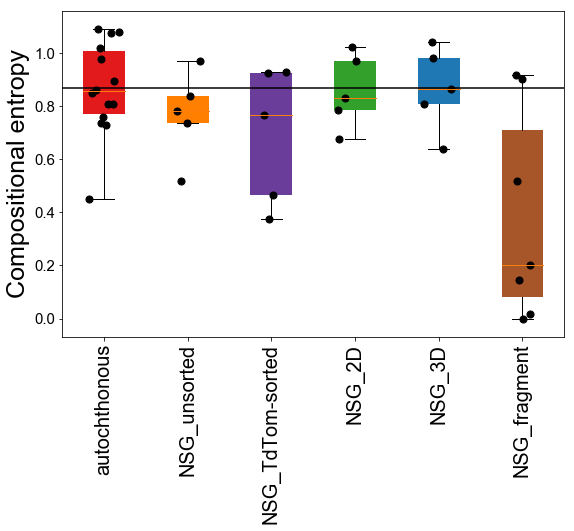

In [211]:
dat = ent_tumor_mouse.loc[['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 6
width = 1.5 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Compositional entropy', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index)), 
                 vert=True, notch=False, patch_artist=True, showfliers=False, zorder = 1)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index):
    
    ax.scatter(i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               dat['vals'].loc[gr],
               c = 'k',
               s = 50,
               zorder = 1)

ax.set_xticklabels(dat.index, family = 'Arial', fontsize = 20, rotation = 'vertical')
ax.axhline(dat['mean'].loc['autochthonous'], color='k')

figname = 'ent_models.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

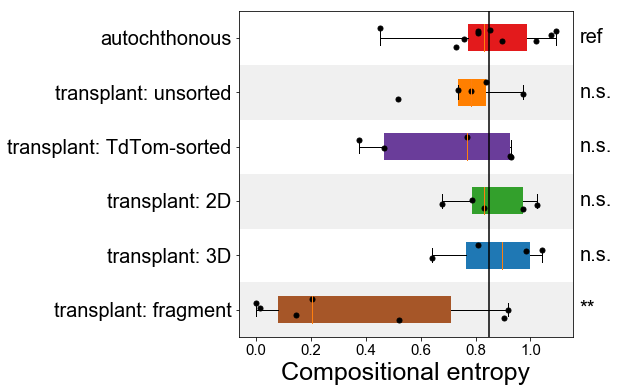

In [106]:
dat = ent_tumor_mouse.loc[['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 6
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Compositional entropy', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
ax.axvline(dat['mean'].loc['autochthonous'], color='k')

#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'ent_models.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [103]:
ent_tumor_mouse_2D = pd.DataFrame(columns = ['vals','mean','std','pval','pval_symbol'],
                                        index = ['2D','NSG_2D'])

ref = '2D'

for gr in ent_tumor_mouse_2D.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = comp_tumor['ent'].loc[m_tmp]
    ent_tumor_mouse_2D.loc[gr,'vals'] = dat_tmp.values
    ent_tumor_mouse_2D.loc[gr,'mean'] = dat_tmp.mean()
    ent_tumor_mouse_2D.loc[gr,'std'] = dat_tmp.std()
    if gr == ref:
        ent_tumor_mouse_2D.loc[gr,'pval'] = 'ref'
        ent_tumor_mouse_2D.loc[gr,'pval_symbol'] = 'ref'
    else:
        symbol_tmp = 'n.s.'
        pval_tmp = scipy.stats.ttest_ind(ent_tumor_mouse_2D.loc[ref,'vals'], ent_tumor_mouse_2D.loc[gr,'vals'])[1]
        ent_tumor_mouse_2D.loc[gr,'pval'] = pval_tmp
        if pval_tmp < 0.05: symbol_tmp = '*'
        if pval_tmp < 0.01: symbol_tmp = '**'
        if pval_tmp < 0.005: symbol_tmp = '***'
        ent_tumor_mouse_2D.loc[gr,'pval_symbol'] = symbol_tmp

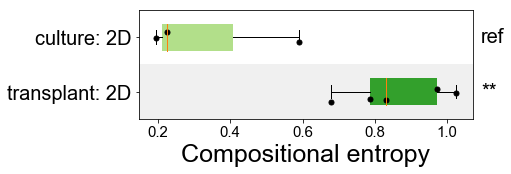

In [104]:
dat = ent_tumor_mouse_2D.loc[['2D','NSG_2D']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 2
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Compositional entropy', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1, widths=0.5)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)
    
#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
#ax.axvline(dat['mean'].loc['autochthonous'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'ent_models_2D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [107]:
ent_tumor_mouse_3D = pd.DataFrame(columns = ['vals','mean','std','pval','pval_symbol'],
                                        index = ['3D_Tuv','NSG_3D'])

ref = '3D_Tuv'

for gr in ent_tumor_mouse_3D.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = comp_tumor['ent'].loc[m_tmp]
    ent_tumor_mouse_3D.loc[gr,'vals'] = dat_tmp.values
    ent_tumor_mouse_3D.loc[gr,'mean'] = dat_tmp.mean()
    ent_tumor_mouse_3D.loc[gr,'std'] = dat_tmp.std()
    if gr == ref:
        ent_tumor_mouse_3D.loc[gr,'pval'] = 'ref'
        ent_tumor_mouse_3D.loc[gr,'pval_symbol'] = 'ref'
    else:
        symbol_tmp = 'n.s.'
        pval_tmp = scipy.stats.ttest_ind(ent_tumor_mouse_3D.loc[ref,'vals'], ent_tumor_mouse_3D.loc[gr,'vals'])[1]
        ent_tumor_mouse_3D.loc[gr,'pval'] = pval_tmp
        if pval_tmp < 0.05: symbol_tmp = '*'
        if pval_tmp < 0.01: symbol_tmp = '**'
        if pval_tmp < 0.005: symbol_tmp = '***'
        ent_tumor_mouse_3D.loc[gr,'pval_symbol'] = symbol_tmp

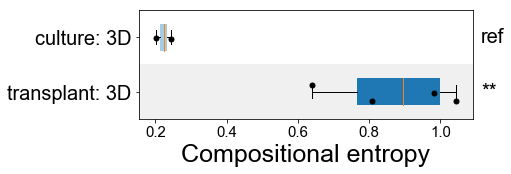

In [108]:
dat = ent_tumor_mouse_3D.loc[['3D_Tuv','NSG_3D']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 2
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Compositional entropy', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1, widths=0.5)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)
    
#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
#ax.axvline(dat['mean'].loc['autochthonous'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'ent_models_3D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [109]:
ent_tumor_mouse_2D3D = pd.concat([ent_tumor_mouse_2D, ent_tumor_mouse_3D])

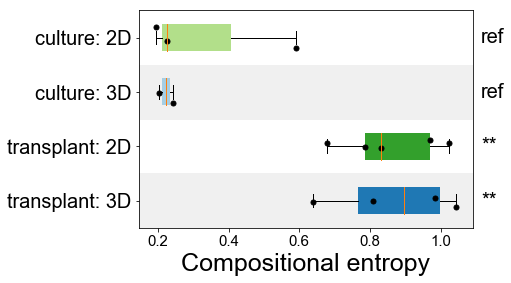

In [110]:
dat = ent_tumor_mouse_2D3D.loc[['2D','3D_Tuv','NSG_2D','NSG_3D']]
clist = [cmap_tumor_sel[i] for i in dat.index]

L = len(dat.index)

#initialize figure

height = 4
width = 6

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_ylim(L-0.5, -0.5)
ax.set_yticks(range(L)[::-1])

ax.set_xlabel('Compositional entropy', family = 'Arial', fontsize = 25)
for tick_pos, tick in enumerate(ax.xaxis.get_major_ticks()):
    ax.xaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.xaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

box = ax.boxplot(x=dat['vals'].values,
                 positions = range(len(dat.index))[::-1], 
                 vert=False, notch=False, patch_artist=True, showfliers=False, zorder = 1, widths=0.5)

for p,b in enumerate(box['boxes']):
    b.set_facecolor(clist[p])
    b.set_linewidth(0.0)
    b.set_zorder(0)
    
for i, gr in enumerate(dat.index[::-1]):
    
    ax.scatter(dat['vals'].loc[gr],
               i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               c = 'k',
               s = 25,
               zorder = 1)
    
#plot pvals
    
for i, gr in enumerate(dat.index[::-1]):
    ax.text(ax.get_xlim()[1]*1.02, i, dat.loc[gr]['pval_symbol'], family='Arial', fontsize=20, va = 'center')

ax.set_yticklabels([ndict[i] for i in dat.index], family = 'Arial', fontsize = 20, rotation = 'horizontal')
#ax.axvline(dat['mean'].loc['autochthonous'], color='k')

for i in [0,2,4]:
    ax.axhspan(i-0.5, i+0.5, color='#f0f0f0', zorder=0)
    
figname = 'ent_models_2D3D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Checkpoint

In [221]:
#save_to_txt(comp_tumor, path_output, exp_id, 'comp_tumor')

In [54]:
comp_tumor = load_from_txt(path_output, exp_id, 'comp_tumor', 'DataFrame')

## Fractions of L, B, M cells per tumor

In [86]:
def draw_fraction_cluster(cluster, variable, cmap, cl_order=False, var_order=False):
    
    if not cl_order:
        cl_order = return_unique(cluster)
        
    if not var_order:
        var_order = return_unique(variable)
        
    #initialize figure

    height = 10
    width = len(cl_order) * 1
    
    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #set axes

    ax = plt.subplot(111)

    ax.set_xlim(-0.5, len(cl_order)-0.5)
    ax.set_xticks(list(range(len(cl_order))))
    ax.set_xticklabels([p for p,i in enumerate(cl_order)], fontsize = 35, family = 'Arial', rotation = 'vertical')

    ax.set_ylim(0,1)
    ax.set_yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
    ax.set_yticklabels([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0], family = 'Arial', fontsize = 30)
    ax.set_ylabel('Fraction', fontsize = 45, family = 'Arial')
    
    #iterate over clusters
    
    for pos, cl in enumerate(cl_order):
        c_tmp = cluster[cluster==cl].index
        l = len(c_tmp)
        rep_tmp = Counter(variable[c_tmp])
        y = 0
        for var in var_order:
            y_new = y + rep_tmp[var]/l
            ax.bar(x = pos, bottom=y, height=y_new, width=1, color = cmap[var])
            y = y_new
        ax.axvline(pos+0.5, color = 'k', linewidth = 0.5)

### Autochthonous tumor cells

In [87]:
c_sel = [i for i in comp_tumor.index if i.split('_')[1] == 'autochthonous']

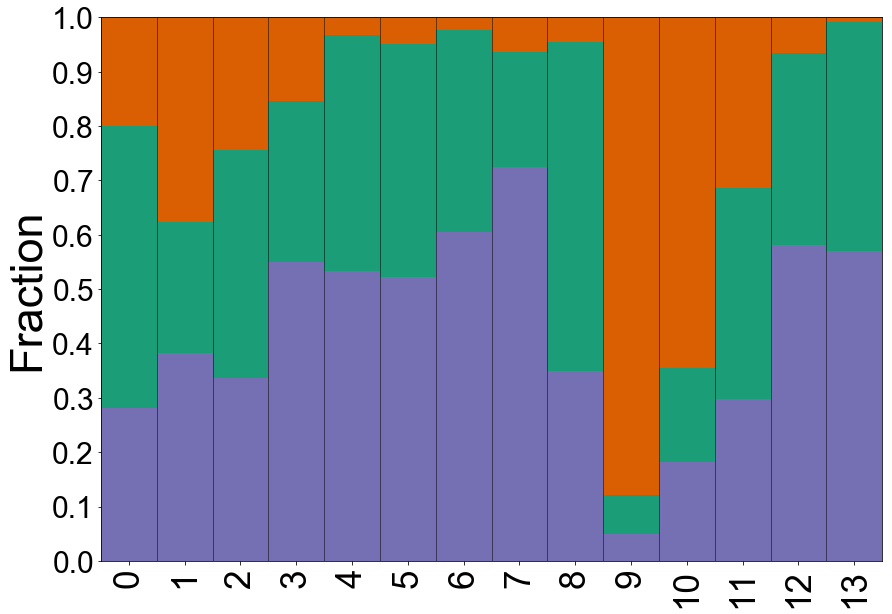

In [88]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_autochthonous.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### 2D

In [89]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == '2D']

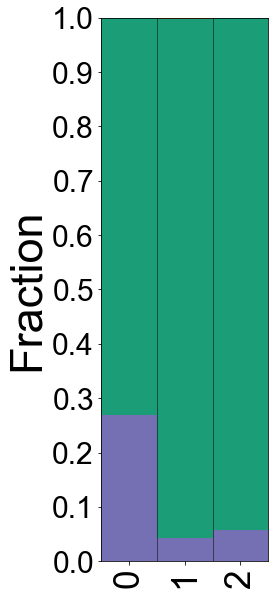

In [90]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_2D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### 3D_Tuv

In [91]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == '3D_Tuv']

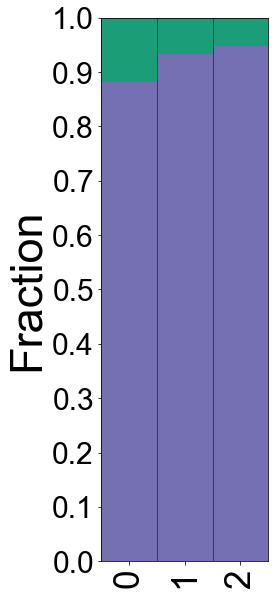

In [92]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_3D_Tuv.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### NSG_2D

In [93]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == 'NSG_2D']

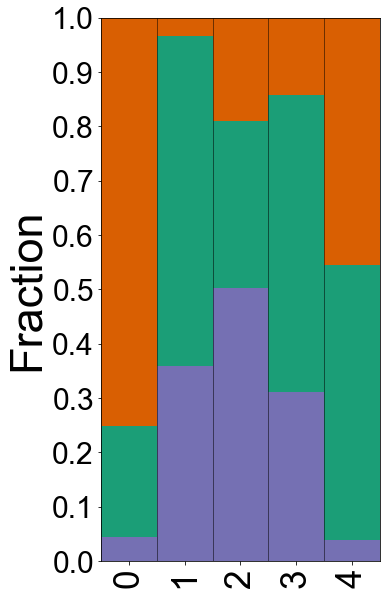

In [94]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_NSG_2D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### NSG_3D

In [95]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == 'NSG_3D']

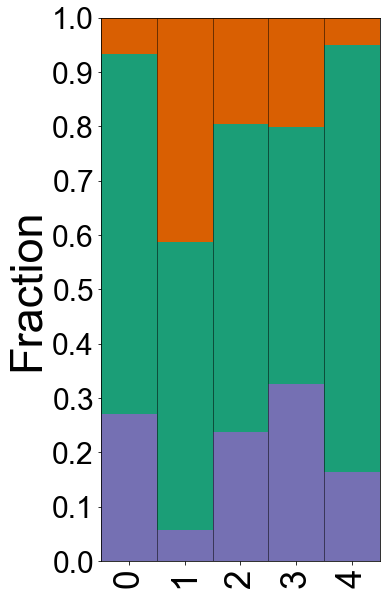

In [96]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_NSG_3D.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### NSG_unsorted

In [97]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == 'NSG_unsorted']

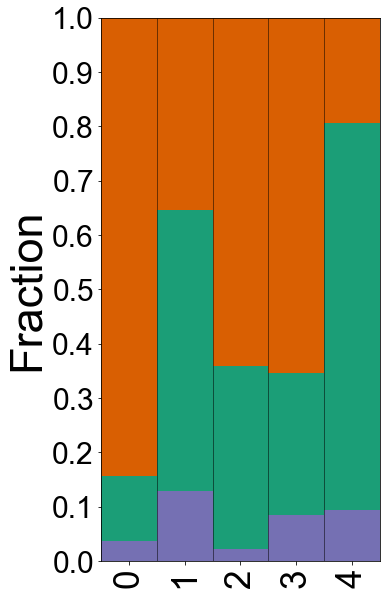

In [98]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_NSG_unsorted.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### NSG_TdTom-sorted

In [99]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == 'NSG_TdTom-sorted']

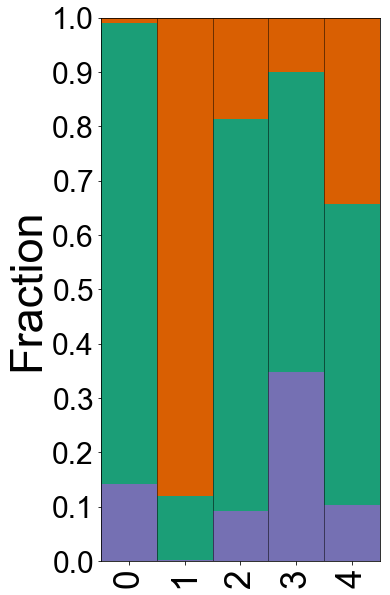

In [100]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])

figname = 'comp_NSG_TdTom.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### NSG_fragment

In [101]:
c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == 'NSG_fragment']

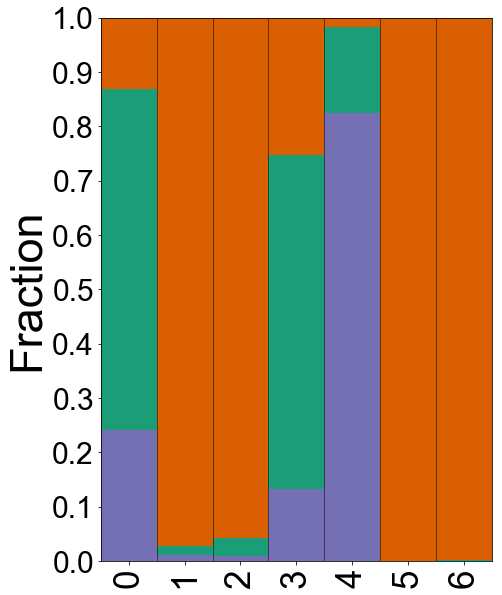

In [102]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'], 
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02'},
                      cl_order = c_sel,
                      var_order=[0,1,2])
figname = 'comp_NSG_fragment.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Fractions of L, B, M cells per tumor type

In [87]:
ndict = {'autochthonous':'autochthonous',
         'NSG_unsorted':'transplant:\nunsorted',
         'NSG_TdTom-sorted':'transplant:\nTdTom-sorted',
         'NSG_2D':'transplant: 2D',
         'NSG_3D':'transplant: 3D',
         'NSG_fragment':'transplant:\nfragment',
         '2D':'culture: 2D','3D_Tuv':'culture: 3D'}

### Luminal cells

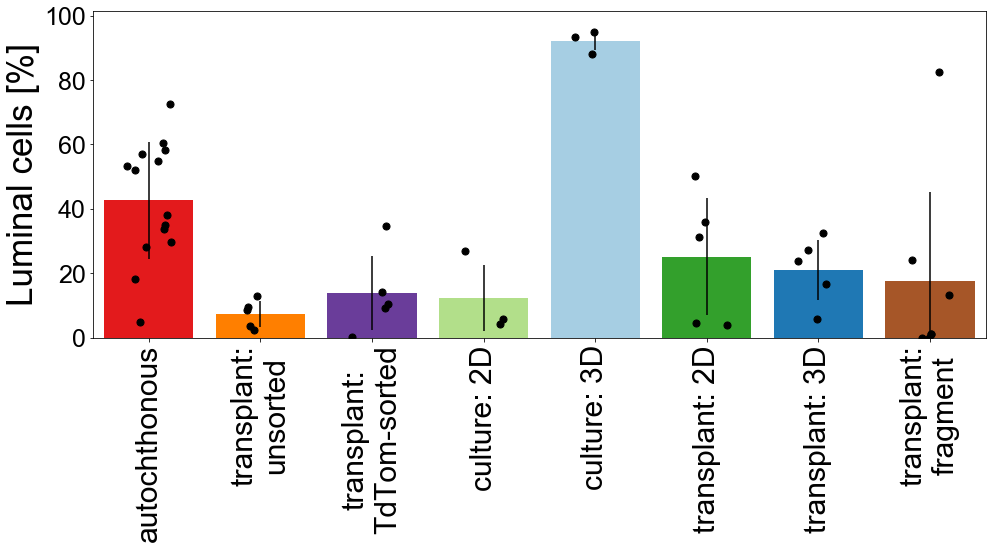

In [97]:
dat = comp_tumor[0]
gr_sel = ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','2D','3D_Tuv','NSG_2D','NSG_3D','NSG_fragment']
cmap = cmap_tumor_sel

L = len(gr_sel)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Luminal cells [%]', family = 'Arial', fontsize = 35)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)

#plot data

for i, gr in enumerate(gr_sel):
    c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == gr]
    dat_tmp = dat.loc[c_sel]*100
    ax.bar(i, 
           height=np.mean(dat_tmp), 
           bottom=0, 
           color = cmap_tumor_sel[gr],  
           yerr = np.std(dat_tmp))
    
    ax.scatter(i-(np.random.random(len(dat_tmp))-0.5)*0.4,
               dat_tmp ,
               c = 'k',
               s = 50,
               zorder = 2)

ax.set_xticklabels([ndict[i] for i in gr_sel], family = 'Arial', fontsize = 30, rotation = 'vertical')
ax.set_ylim(bottom=0)

figname = 'comp_Luminal.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

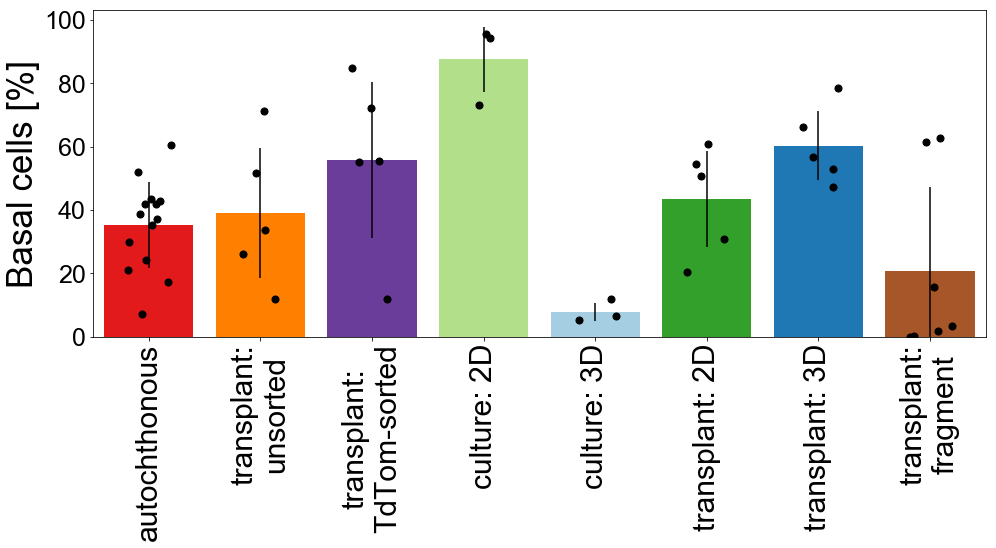

In [95]:
dat = comp_tumor[1]
gr_sel = ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','2D','3D_Tuv','NSG_2D','NSG_3D','NSG_fragment']
cmap = cmap_tumor_sel

L = len(gr_sel)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Basal cells [%]', family = 'Arial', fontsize = 35)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)

#plot data

for i, gr in enumerate(gr_sel):
    c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == gr]
    dat_tmp = dat.loc[c_sel]*100
    ax.bar(i, 
           height=np.mean(dat_tmp), 
           bottom=0, 
           color = cmap_tumor_sel[gr],  
           yerr = np.std(dat_tmp))
    
    ax.scatter(i-(np.random.random(len(dat_tmp))-0.5)*0.4,
               dat_tmp ,
               c = 'k',
               s = 50,
               zorder = 2)

ax.set_xticklabels([ndict[i] for i in gr_sel], family = 'Arial', fontsize = 30, rotation = 'vertical')
ax.set_ylim(bottom=0)

figname = 'comp_Basal.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

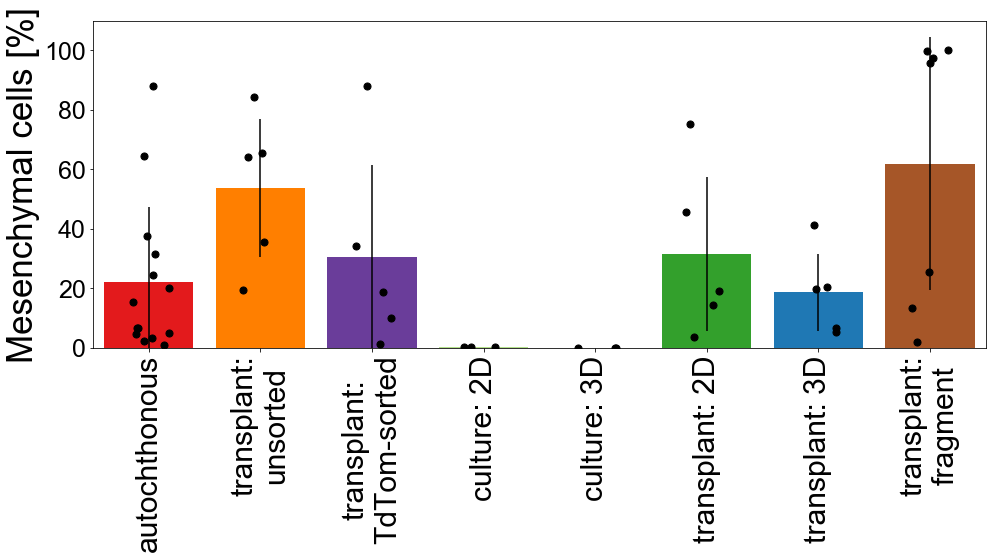

In [96]:
dat = comp_tumor[2]
gr_sel = ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','2D','3D_Tuv','NSG_2D','NSG_3D','NSG_fragment']
cmap = cmap_tumor_sel

L = len(gr_sel)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Mesenchymal cells [%]', family = 'Arial', fontsize = 35)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)

#plot data

for i, gr in enumerate(gr_sel):
    c_sel = [i for i in comp_tumor.index if '_'.join(i.split('_')[1:]) == gr]
    dat_tmp = dat.loc[c_sel]*100
    ax.bar(i, 
           height=np.mean(dat_tmp), 
           bottom=0, 
           color = cmap_tumor_sel[gr],  
           yerr = np.std(dat_tmp))
    
    ax.scatter(i-(np.random.random(len(dat_tmp))-0.5)*0.4,
               dat_tmp ,
               c = 'k',
               s = 50,
               zorder = 2)

ax.set_xticklabels([ndict[i] for i in gr_sel], family = 'Arial', fontsize = 30, rotation = 'vertical')
ax.set_ylim(bottom=0)

figname = 'comp_Mesenchymal.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Legends / Colormaps

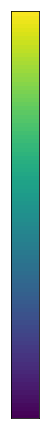

In [20]:
height = 7.5
width = 0.5
vmin, vmax = 0,1
plt.figure(facecolor = 'w', figsize = (width, height))

ax = plt.subplot(111)

ax.set_xlim(0,1)
ax.set_xticks([])

ax.set_ylim(vmin, vmax)
ax.yaxis.set_ticks_position('right')

for i in np.linspace(vmin, vmax, 100):
    ax.axhspan(i, i + (vmax-vmin) / 100, color = plt.cm.viridis((i-vmin)/(vmax-vmin)))
    
ax.set_yticks([])
ax.set_yticklabels([], family='Arial', fontsize=25)

#ax.set_ylabel('Expression score', family='Arial', fontsize=30)

figname = 'legend_viridis.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

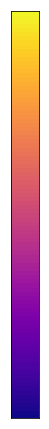

In [21]:
height = 7.5
width = 0.5
vmin, vmax = 0,1
plt.figure(facecolor = 'w', figsize = (width, height))

ax = plt.subplot(111)

ax.set_xlim(0,1)
ax.set_xticks([])

ax.set_ylim(vmin, vmax)
ax.yaxis.set_ticks_position('right')

for i in np.linspace(vmin, vmax, 100):
    ax.axhspan(i, i + (vmax-vmin) / 100, color = plt.cm.plasma((i-vmin)/(vmax-vmin)))
    
ax.set_yticks([])
ax.set_yticklabels([], family='Arial', fontsize=25)

#ax.set_ylabel('Expression score', family='Arial', fontsize=30)

figname = 'legend_plasma.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

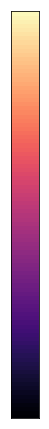

In [22]:
height = 7.5
width = 0.5
vmin, vmax = 0,1
plt.figure(facecolor = 'w', figsize = (width, height))

ax = plt.subplot(111)

ax.set_xlim(0,1)
ax.set_xticks([])

ax.set_ylim(vmin, vmax)
ax.yaxis.set_ticks_position('right')

for i in np.linspace(vmin, vmax, 100):
    ax.axhspan(i, i + (vmax-vmin) / 100, color = plt.cm.magma((i-vmin)/(vmax-vmin)))
    
ax.set_yticks([])
ax.set_yticklabels([], family='Arial', fontsize=25)

#ax.set_ylabel('Expression score', family='Arial', fontsize=30)

figname = 'legend_magma.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

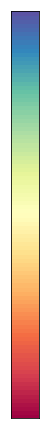

In [24]:
height = 7.5
width = 0.5
vmin, vmax = 0,1
plt.figure(facecolor = 'w', figsize = (width, height))

ax = plt.subplot(111)

ax.set_xlim(0,1)
ax.set_xticks([])

ax.set_ylim(vmin, vmax)
ax.yaxis.set_ticks_position('right')

for i in np.linspace(vmin, vmax, 100):
    ax.axhspan(i, i + (vmax-vmin) / 100, color = plt.cm.Spectral((i-vmin)/(vmax-vmin)))
    
ax.set_yticks([])
ax.set_yticklabels([], family='Arial', fontsize=25)

#ax.set_ylabel('Expression score', family='Arial', fontsize=30)

figname = 'legend_spectral.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

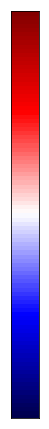

In [13]:
height = 7.5
width = 0.5
vmin, vmax = 0,1
plt.figure(facecolor = 'w', figsize = (width, height))

ax = plt.subplot(111)

ax.set_xlim(0,1)
ax.set_xticks([])

ax.set_ylim(vmin, vmax)
ax.yaxis.set_ticks_position('right')

for i in np.linspace(vmin, vmax, 100):
    ax.axhspan(i, i + (vmax-vmin) / 100, color = plt.cm.seismic((i-vmin)/(vmax-vmin)))
    
ax.set_yticks([])
ax.set_yticklabels([], family='Arial', fontsize=25)

#ax.set_ylabel('Expression score', family='Arial', fontsize=30)

figname = 'legend_seismic.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

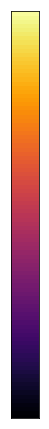

In [14]:
height = 7.5
width = 0.5
vmin, vmax = 0,1
plt.figure(facecolor = 'w', figsize = (width, height))

ax = plt.subplot(111)

ax.set_xlim(0,1)
ax.set_xticks([])

ax.set_ylim(vmin, vmax)
ax.yaxis.set_ticks_position('right')

for i in np.linspace(vmin, vmax, 100):
    ax.axhspan(i, i + (vmax-vmin) / 100, color = plt.cm.inferno((i-vmin)/(vmax-vmin)))
    
ax.set_yticks([])
ax.set_yticklabels([], family='Arial', fontsize=25)

#ax.set_ylabel('Expression score', family='Arial', fontsize=30)

figname = 'legend_inferno.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [48]:
15 * 20

300

In [ ]:
dat = fit_pca.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=1)
cc = cl_score.apply(lambda x: x / np.sum(x), axis = 1)
xmin, xmax = np.min(dat.columns.astype(float)), np.max(dat.columns.astype(float))
cmap_pop = cmap_cl_tumor

#initialize figure

height = 10
width = 10

fig = plt.figure(facecolor = 'w', figsize = (width, height))
gs1 = plt.GridSpec(4, 1, hspace=0.1, height_ratios=[3,5,5,0.75])

#plot basal signature

ax = plt.subplot(gs1[1])
ax.set_xlim(xmin, xmax)
ax.set_xticks([])
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
col_tmp = ['#1b9e77']

for i,g in enumerate([genes_basal]):
    s = dat.loc[g]
    ax.plot(np.array(s.columns).astype(float), s.median(), color=col_tmp[i], lw=5)
    ax.fill_between(np.array(s.columns).astype(float),
                        s.apply(lambda x: np.percentile(x, 5), axis=0),
                        s.apply(lambda x: np.percentile(x, 95), axis=0),
                        color=col_tmp[i], alpha = 0.25)
    
ax.axvline(0.3, color='k', linestyle='--')
ax.axvline(0.7, color='k', linestyle='--')

#plot luminal and mesenchymal signatures

ax = plt.subplot(gs1[2])
ax.set_xlim(xmin, xmax)
ax.set_xticks([])
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
col_tmp = ['#7570b3','#d95f02']

for i,g in enumerate([genes_luminal, genes_mes1]):
    s = dat.loc[g]
    ax.plot(np.array(s.columns).astype(float), s.median(), color=col_tmp[i], lw=5)
    ax.fill_between(np.array(s.columns).astype(float),
                        s.apply(lambda x: np.percentile(x, 5), axis=0),
                        s.apply(lambda x: np.percentile(x, 95), axis=0),
                        color=col_tmp[i], alpha = 0.25)
    
ax.axvline(0.3, color='k', linestyle='--')
ax.axvline(0.7, color='k', linestyle='--')

#plot entropy

ax = plt.subplot(gs1[3])
ax.set_xlim(xmin, xmax)
ax.set_xticks([])
ax.set_ylabel('Shannon entropy', family = 'Arial', fontsize = 20)
"""
s = dat.loc[dpt_leiden_pca.index][~np.any(np.isnan(dat.loc[dpt_leiden_pca.index]),axis=1)]
s = s.apply(lambda x: scipy.stats.entropy(x), axis=0)

ax.plot(np.array(s.index).astype(float), 
        s, 
        color='k', lw=5)
"""
ax.axvline(0.3, color='k', linestyle='--')
ax.axvline(0.7, color='k', linestyle='--')

#PTO colormap

ax = plt.subplot(gs1[4])
ax.set_xlim(0,1)
for pos in np.arange(0,1,0.01):
    ax.axvspan(pos, pos + 0.01, color = plt.cm.Spectral_r(pos))    
clean_axis(ax)

#population

ax4 = plt.subplot(gs1[0])

ax4.set_xlim(-0.5, len(set(bins))-0.5)
ax4.set_xticks([])
ax4.set_ylim(0,1)
ax4.set_yticks([0.0,0.5,1.0])
ax4.set_yticklabels(['0%','50%','100%'], family = 'Arial', fontsize = 15)

for pos, b in enumerate(range(10)):
    y0 = 0
    for gr in ['Luminal cells', 'Basal cells', 'Mesenchymal cells']:
        ax4.bar(x = pos, height = y0 + cc.loc[b,gr], bottom = y0, 
                color = cmap_pop[gr], width = 1, linewidth = 1, edgecolor = 'black')
        y0 += cc.loc[b,gr]
        
figname = 'dpt_overlapping_signatures.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)